In [1]:
library(dplyr)
library(ggplot2)
library(ggbeeswarm)


Attaching package: ‘dplyr’

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



In [2]:
## genotype file
genos = read.table("/hps/nobackup/hipsci/scratch/genotypes/imputed/2017-03-27/Anna_selection_2020/neuroseq_Jan27.dosages.txt")
colnames(genos) = gsub("\\.","-",colnames(genos))
head(genos)

,HPSI0514i-sohd_2,HPSI0115i-zihe_1,HPSI1014i-eesb_1,HPSI0913i-eika_2,HPSI0114i-lexy_2,HPSI1014i-quls_2,HPSI0514i-yewo_4,HPSI0314i-bubh_3,HPSI0714i-burb_1,HPSI0314i-xugn_2,⋯,HPSI0413i-nudd_1,HPSI0513i-pedc_1,HPSI0513i-dulv_1,HPSI0813i-peoj_1,HPSI0413i-yotv_2,HPSI0513i-dipe_1,HPSI0613i-bawa_1,HPSI0813i-aizi_3,HPSI0613i-hikj_2,HPSI0513i-momt_2
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
13_21085751_A_T,0.902,0.935,0.387,0,0.357,0.005,0.019,0.681,0.605,0.768,⋯,0.025,0.313,0.008,1.027,0.004,0.028,0.896,0.929,0.016,0.944
13_21088717_T_C,0.914,0.947,0.671,0,0.336,0.015,0.001,0.962,0.609,0.783,⋯,0.011,0.312,0.003,1.014,0.000,0.018,0.977,0.940,0.007,0.993
13_21131211_C_A,0.731,0.005,1.112,1,0.996,0.992,1.033,0.999,0.006,1.006,⋯,1.994,1.000,0.003,0.002,0.966,1.027,0.998,0.000,0.996,0.005
13_21151047_T_C,1.000,1.000,2.000,1,1.000,1.000,0.999,0.000,0.000,0.000,⋯,0.000,0.000,0.000,0.000,0.956,0.000,0.002,0.000,1.000,0.000
13_21200260_C_T,1.001,1.468,1.010,1,1.951,1.578,1.077,2.000,1.999,2.000,⋯,2.000,1.982,2.000,2.000,1.007,2.000,2.000,2.000,1.004,2.000
13_21258328_T_C,1.000,0.988,1.000,1,1.000,1.000,0.003,1.000,2.000,1.000,⋯,0.003,1.000,2.000,2.000,1.000,0.995,0.981,2.000,1.000,2.000


In [3]:
### annotation file (map genes IDs)
annos_file = "/hps/nobackup/hipsci/scratch/singlecell_endodiff/data_processed/scQTLs/annos/combined_feature_id_annos.tsv"
annos = read.csv(annos_file,sep="\t")
# head(annos,2)
annos$feature_id = annos$ensembl_gene_id
head(annos,2)

feature_id,chromosome,start,end,hgnc_symbol,combined_feature_id,ensembl_gene_id
<fct>,<fct>,<int>,<int>,<fct>,<fct>,<fct>
ENSG00000000003,X,99883667,99894988,TSPAN6,ENSG00000000003_TSPAN6,ENSG00000000003
ENSG00000000419,20,49551404,49575092,DPM1,ENSG00000000419_DPM1,ENSG00000000419


In [4]:
annos[annos$hgnc_symbol == 'CUL7',]

,feature_id,chromosome,start,end,hgnc_symbol,combined_feature_id,ensembl_gene_id
,<fct>,<fct>,<int>,<int>,<fct>,<fct>,<fct>
414,ENSG00000044090,6,43005355,43021683,CUL7,ENSG00000044090_CUL7,ENSG00000044090


In [5]:
#### full expressino files (grouped by celltype, pool, donor, treatment)
mydir = '/nfs/leia/research/stegle/dseaton/hipsci/singlecell_neuroseq/data/data_processed/'
Sert = 'pool1_17_D52/pool1_17_D52.scanpy.w_metadata.w_celltype.scanpy.celltype.Sert.groupedby.donor_id-celltype-treatment.mean.tsv'
e_Sert = read.csv(paste0(mydir,Sert),sep="\t")

In [6]:
e = e_Sert
e_ROT = e[e$treatment == "ROT",]
rownames(e_ROT) = e_ROT$donor_id
e_noROT = e[e$treatment == "NONE",]
rownames(e_noROT) = e_noROT$donor_id

In [7]:
## Sert (ROT inter)
ROT_inter_Sert = "/hps/nobackup/stegle/users/acuomo/all_scripts/sc_neuroseq/eqtl/interaction_qtl/treatment_D52/celltype_Sert/treatment_interaction_test_100cellfilter_top_qtl_results_all/qtl_results_all.txt"
int_Sert = read.csv(ROT_inter_Sert,sep="\t")
nrow(int_Sert)
int_Sert$q_value = p.adjust(int_Sert$p_value, "BH")
nrow(int_Sert[int_Sert$q_value < 0.05,])

[1] 7450

[1] 461

In [10]:
head(int_Sert,2)
for (i in 1:nrow(int_Sert)){
    int_Sert$gene_name[i] = as.character(annos[annos$feature_id == as.character(int_Sert$feature_id[i]),"hgnc_symbol"])
}
head(int_Sert,2)

feature_id,snp_id,p_value,beta,beta_se,empirical_feature_p_value,feature_chromosome,feature_start,feature_end,n_samples,n_e_samples,snp_chromosome,snp_position,assessed_allele,call_rate,maf,hwe_p,q_value
ENSG00000136098,13_52714837_C_A,7.246341e-25,-1.507194,0.1463678,-1,13,52706775,52733996,170,170,13,52714837,A,1,0.3117647,0.05069468,5.398524e-21
ENSG00000136098,13_52716189_G_C,4.847093e-21,-1.429132,0.1518342,-1,13,52706775,52733996,170,170,13,52716189,C,1,0.3294118,0.22557491,1.805542e-17


feature_id,snp_id,p_value,beta,beta_se,empirical_feature_p_value,feature_chromosome,feature_start,feature_end,n_samples,n_e_samples,snp_chromosome,snp_position,assessed_allele,call_rate,maf,hwe_p,q_value,gene_name
ENSG00000136098,13_52714837_C_A,7.246341e-25,-1.507194,0.1463678,-1,13,52706775,52733996,170,170,13,52714837,A,1,0.3117647,0.05069468,5.398524e-21,NEK3
ENSG00000136098,13_52716189_G_C,4.847093e-21,-1.429132,0.1518342,-1,13,52706775,52733996,170,170,13,52716189,C,1,0.3294118,0.22557491,1.805542e-17,NEK3


In [11]:
int_Sert[int_Sert$gene_name == "SFXN5",]

feature_id,snp_id,p_value,beta,beta_se,empirical_feature_p_value,feature_chromosome,feature_start,feature_end,n_samples,n_e_samples,snp_chromosome,snp_position,assessed_allele,call_rate,maf,hwe_p,q_value,gene_name


In [30]:
res = int_Sert
res[-log10(res$p_value)*sign(res$beta) > 6,c("snp_id","feature_id")]
res[-log10(res$p_value)*sign(res$beta) < -6,c("snp_id","feature_id")]

,snp_id,feature_id
,<fct>,<fct>
196,2_190541861_G_T,ENSG00000064933
437,9_108456726_G_C,ENSG00000095209
659,19_50471300_T_G,ENSG00000105053
741,10_93449413_T_C,ENSG00000107854
750,10_30714440_G_A,ENSG00000107968
1798,3_11833473_C_T,ENSG00000144559
1850,7_6884764_A_C,ENSG00000146574
1905,11_34905987_T_C,ENSG00000149089
1999,10_94569129_T_C,ENSG00000152804


,snp_id,feature_id
,<fct>,<fct>
113,5_6607916_T_C,ENSG00000037474
495,22_45764874_T_C,ENSG00000100376
515,14_96812820_A_C,ENSG00000100744
852,12_6990548_A_G,ENSG00000111671
978,1_15912987_G_T,ENSG00000116138
998,1_75213088_G_A,ENSG00000116791
1239,7_158732959_G_A,ENSG00000126870
1481,13_52714837_C_A,ENSG00000136098
1781,2_88446892_G_T,ENSG00000144115


In [31]:
snps_positive = res[-log10(res$p_value)*sign(res$beta) > 5,"snp_id"]
snps_negative = res[-log10(res$p_value)*sign(res$beta) < -5,"snp_id"]

In [8]:
col_NONE = "darkgrey"
col_ROT = "firebrick"

In [15]:
snp = '2_73360608_A_G'
gene = 'ENSG00000144040'
gene_name = as.character(annos[annos$feature_id == as.character(gene),"hgnc_symbol"])
gene_name 
g = data.frame(donor_id = colnames(genos), snp = t(genos[snp,]))
g$donor_id = as.character(g$donor_id)
head(g)

[1] "SFXN5"

,donor_id,NA.
HPSI0514i-sohd_2,HPSI0514i-sohd_2,NA
HPSI0115i-zihe_1,HPSI0115i-zihe_1,NA
HPSI1014i-eesb_1,HPSI1014i-eesb_1,NA
HPSI0913i-eika_2,HPSI0913i-eika_2,NA
HPSI0114i-lexy_2,HPSI0114i-lexy_2,NA
HPSI1014i-quls_2,HPSI1014i-quls_2,NA


In [ ]:
colnames(g)[2] = "dosages"
#     print(head(g,2))
    e1 = e_noROT[,c("donor_id",gene_name)]
    e1$donor_id = as.character(e1$donor_id)
    df1 = inner_join(e1,g,by = "donor_id")
    colnames(df1)[2] = "gene"
    df1$genotypes <- round(df1$dosages)
#     print(head(df1,2))
    e2 = e_ROT[,c("donor_id",gene_name)]
    e2$donor_id = as.character(e2$donor_id)
    df2 = inner_join(e2,g,by = "donor_id")
    colnames(df2)[2] = "gene"
    df2$genotypes <- round(df2$dosages)
#     print(head(df2,2))   
    m = min(min(df1$gene),min(df1$gene))
    M = max(max(df1$gene),max(df2$gene))
    p1 = ggplot(df1, aes(x = as.factor(genotypes), y = gene)) +  geom_violin(col = col_NONE) + 
                xlab(snp) + ylab(gene_name) +  geom_quasirandom(size = 0.5, col = col_NONE) + 
                geom_boxplot(width = 0.25, col = col_NONE) + ylim(c(m,M)) + ggtitle("NONE")
    p2 = ggplot(df2, aes(x = as.factor(genotypes), y = gene))  + geom_violin(col = col_ROT) + 
                xlab(snp) + ylab(gene_name) + geom_quasirandom(size = 0.5, col = col_ROT) + 
                geom_boxplot(width = 0.25, col = col_ROT) + ylim(c(m,M)) +  ggtitle("ROT")
    options(repr.plot.width=6, repr.plot.height=3.5)
    print(cowplot::plot_grid(p1, p2, align = "h", ncol = 2))   
    print(c(mean(df1$gene),mean(df2$gene)))
}

[1] "CAPG"
[1] 0.08710369 0.16071179
[1] "PMS1"


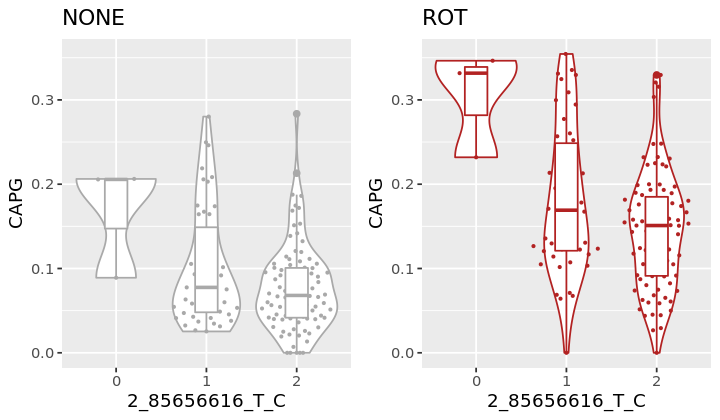

[1] 0.1004150 0.1003512
[1] "ASNS"
[1] 0.3947230 0.5906694
[1] "CECR1"


Warning message:
“Removed 4 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 4 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 4 rows containing missing values (position_quasirandom).”

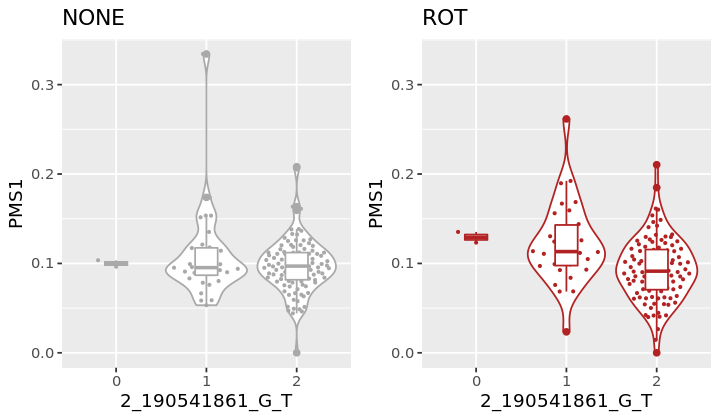

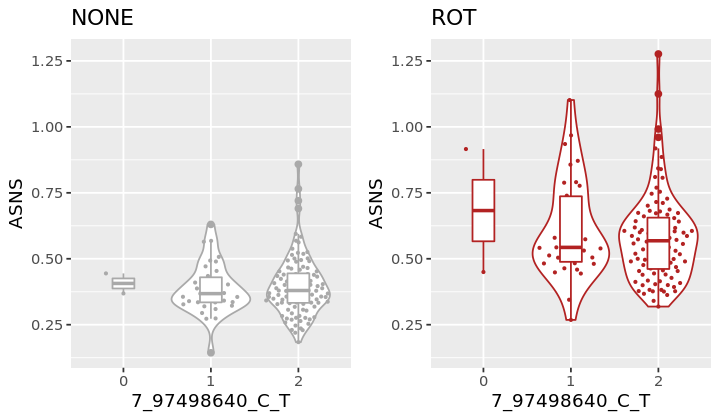

[1] 0.2288475 0.2429566
[1] "TMEM38B"


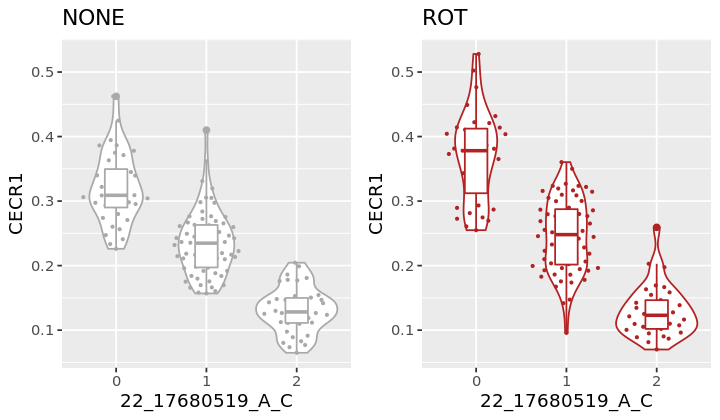

[1] 0.1373120 0.2573837
[1] "VRK3"


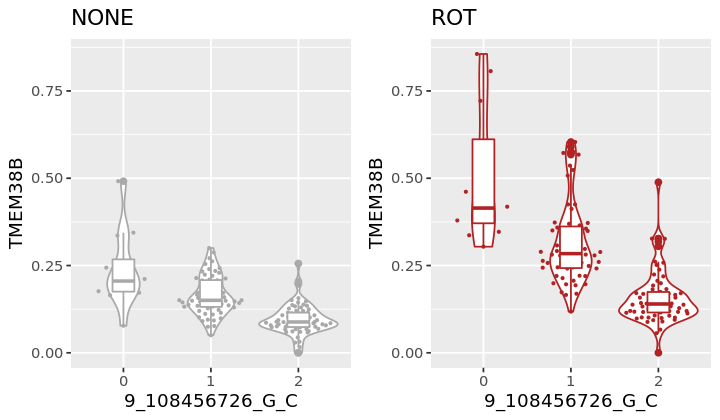

[1] 0.2444846 0.1544875
[1] "TNKS2"


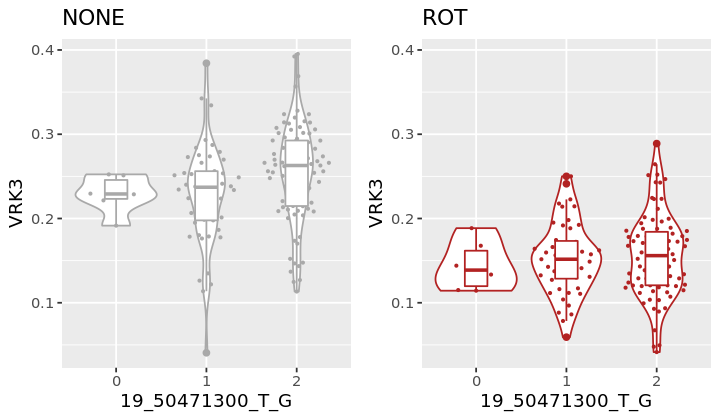

[1] 0.1817069 0.1502947
[1] "MAP3K8"


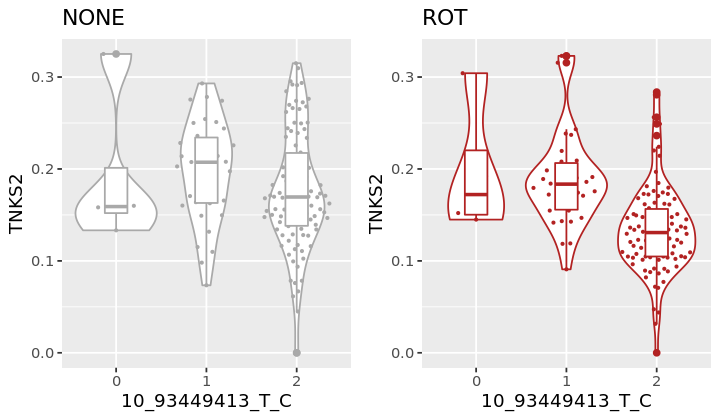

[1] 0.0513082 0.1269314
[1] "TMEM97"


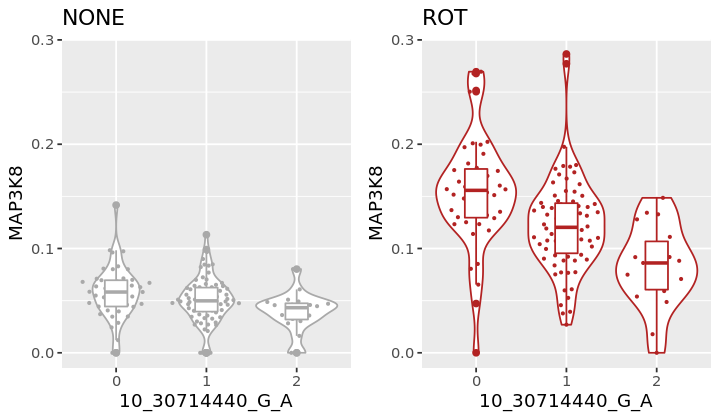

[1] 0.2019207 0.2742642
[1] "STX2"


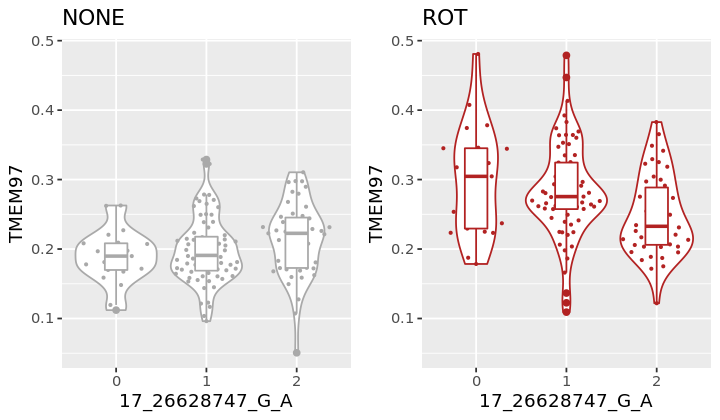

[1] 0.07297628 0.02552992
[1] "POR"


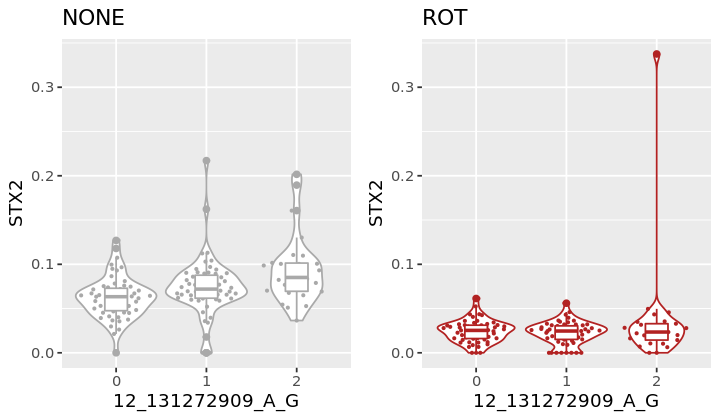

[1] 0.5418337 0.6722126
[1] "SMC2"


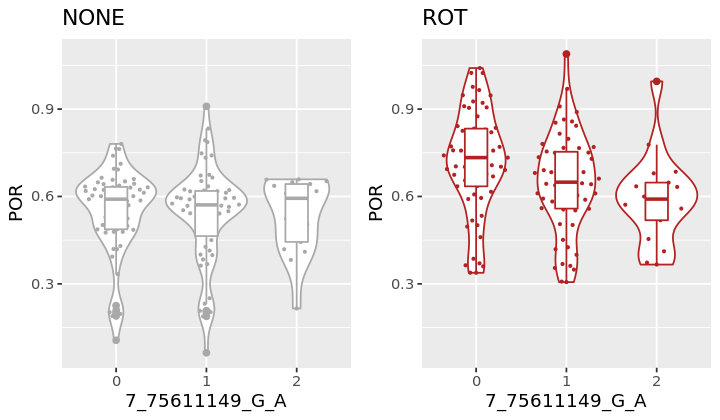

[1] 0.1440887 0.1234225
[1] "TAMM41"


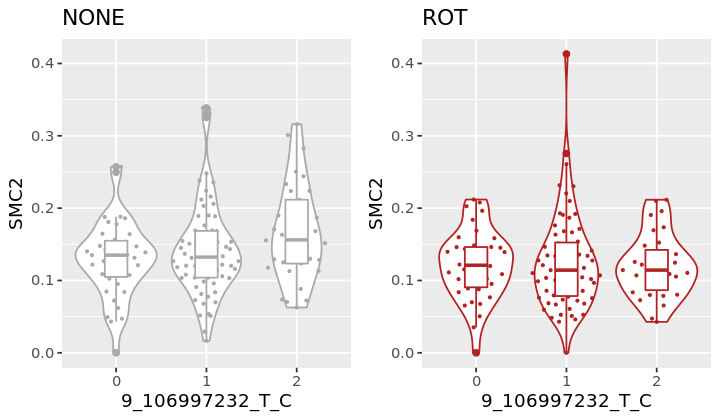

[1] 0.06310690 0.07058131
[1] "CCZ1B"


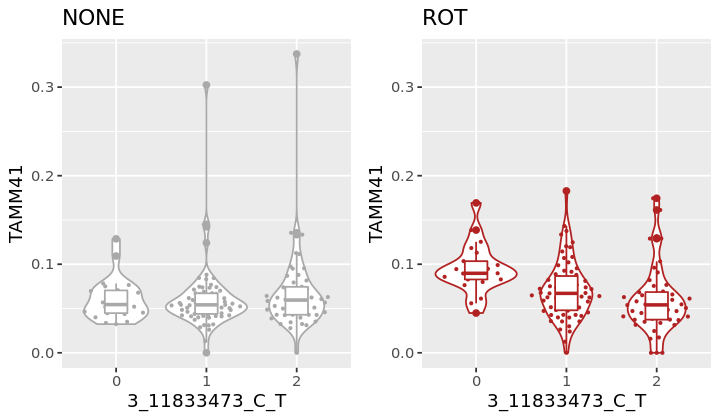

[1] 0.11435705 0.09584318
[1] "APIP"


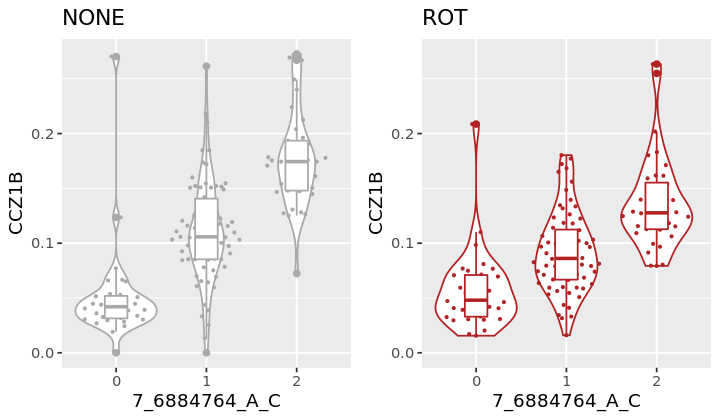

[1] 0.2321799 0.2084563
[1] "HSPB8"


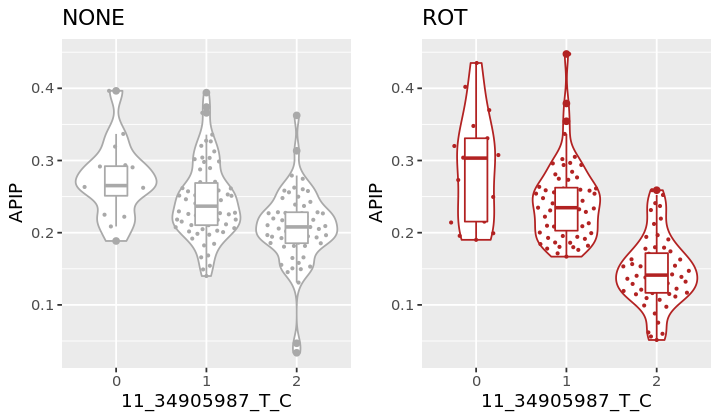

[1] 0.1124022 0.2756566
[1] "HHEX"


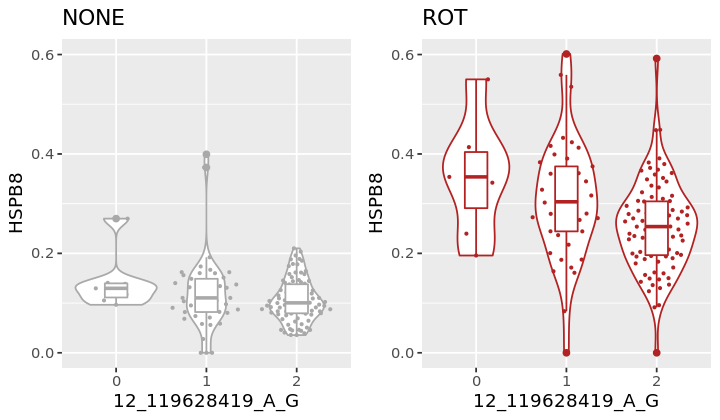

[1] 0.04916591 0.02561751
[1] "SLC22A15"
[1] 0.01298984 0.02304905
[1] "ARPC2"


Warning message:
“Removed 57 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 57 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 57 rows containing missing values (position_quasirandom).”

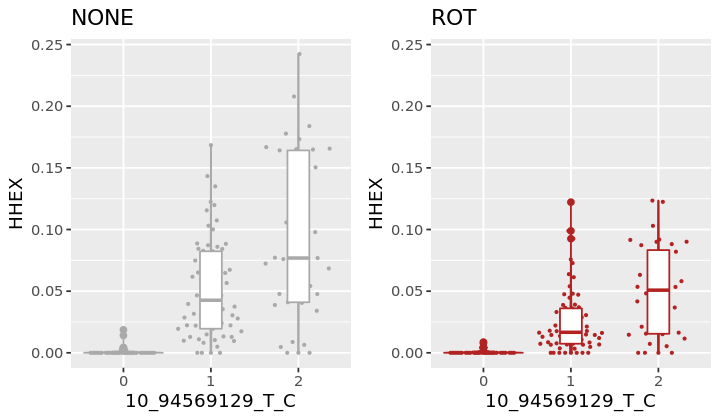

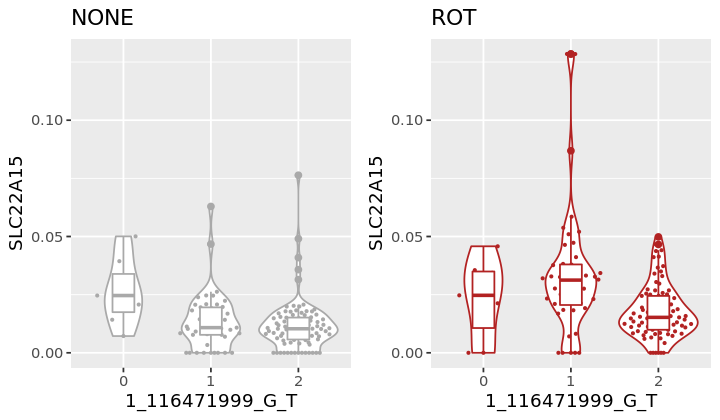

[1] 1.399485 1.143086
[1] "RASEF"


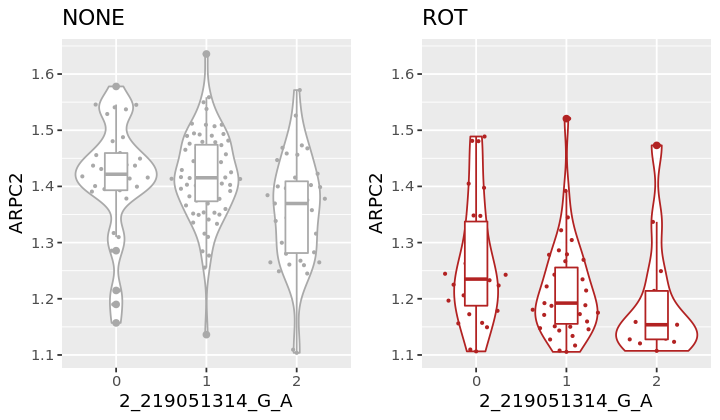

[1] 0.14947484 0.05303349
[1] "FEZ2"


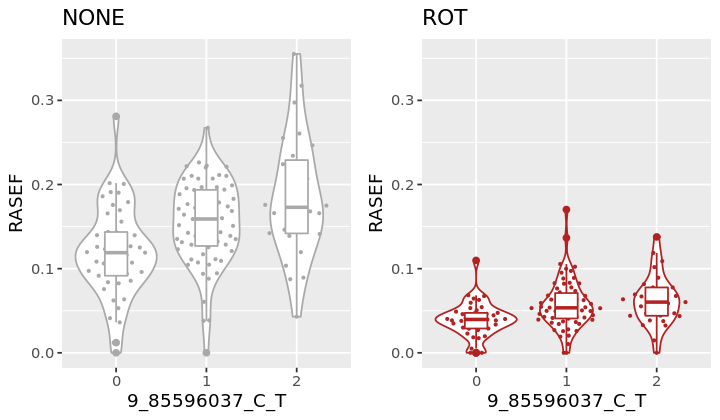

[1] 0.2204836 0.1600431
[1] "C11orf24"
[1] 0.05253354 0.05743496
[1] "CCDC66"


Warning message:
“Removed 5 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 5 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 5 rows containing missing values (position_quasirandom).”

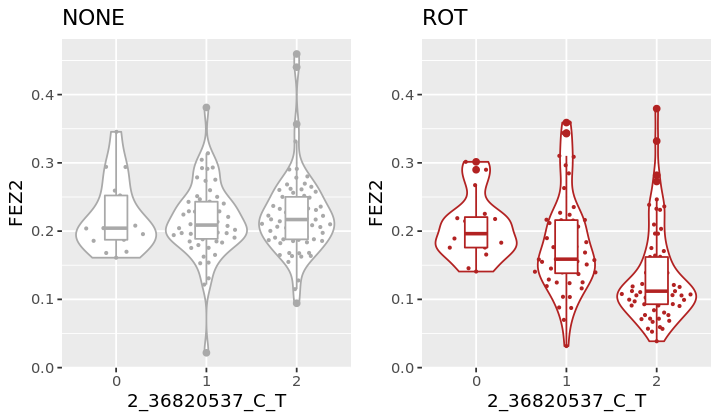

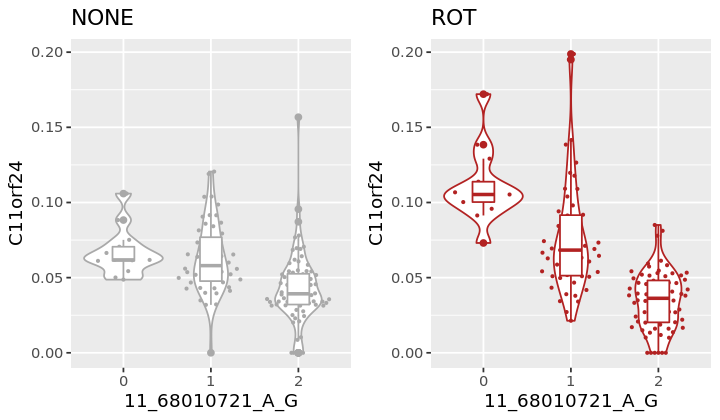

[1] 0.1914828 0.1061843
[1] "ZNF587"
[1] 0.07659227 0.07012062
[1] "C17orf89"


Warning message:
“Removed 6 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 6 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 6 rows containing missing values (position_quasirandom).”

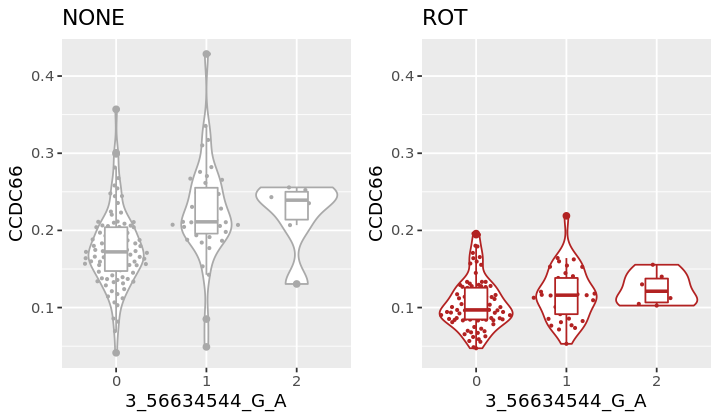

[1] 0.6610688 0.5322442


Warning message in `==.default`(annos$feature_id, as.character(gene)):
“longer object length is not a multiple of shorter object length”Warning message in is.na(e1) | is.na(e2):
“longer object length is not a multiple of shorter object length”

character(0)


ERROR: Error: $ operator is invalid for atomic vectors


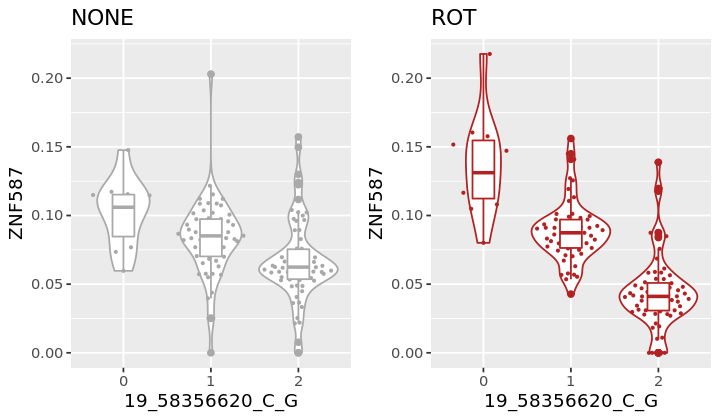

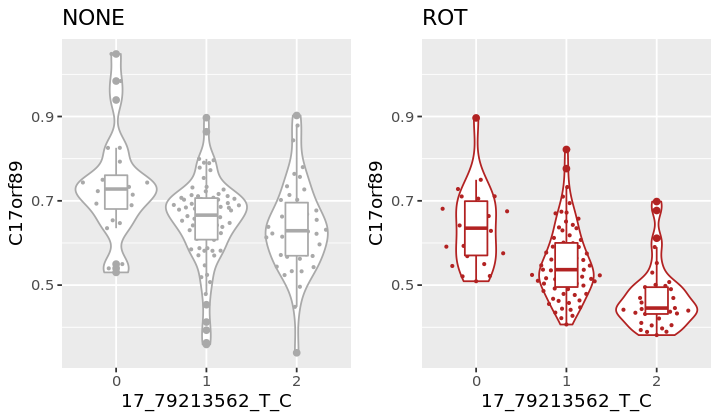

In [35]:
for (i in 1:length(snps_positive)){
#     print(i)
    snp = as.character(snps_positive[i])
#     print(snp)
    gene = as.character(res[res$snp_id == snp,"feature_id"])
#     print(gene)
    gene_name = as.character(annos[annos$feature_id == as.character(gene),"hgnc_symbol"])
    print(gene_name)
    g = data.frame(donor_id = colnames(genos), snp = t(genos[snp,]))
    g$donor_id = as.character(g$donor_id)
    colnames(g)[2] = "dosages"
#     print(head(g,2))
    e1 = e_noROT[,c("donor_id",gene_name)]
    e1$donor_id = as.character(e1$donor_id)
    df1 = inner_join(e1,g,by = "donor_id")
    colnames(df1)[2] = "gene"
    df1$genotypes <- round(df1$dosages)
#     print(head(df1,2))
    e2 = e_ROT[,c("donor_id",gene_name)]
    e2$donor_id = as.character(e2$donor_id)
    df2 = inner_join(e2,g,by = "donor_id")
    colnames(df2)[2] = "gene"
    df2$genotypes <- round(df2$dosages)
#     print(head(df2,2))   
    m = min(min(df1$gene),min(df1$gene))
    M = max(max(df1$gene),max(df2$gene))
    p1 = ggplot(df1, aes(x = as.factor(genotypes), y = gene)) +  geom_violin(col = col_NONE) + 
                xlab(snp) + ylab(gene_name) +  geom_quasirandom(size = 0.5, col = col_NONE) + 
                geom_boxplot(width = 0.25, col = col_NONE) + ylim(c(m,M)) + ggtitle("NONE")
    p2 = ggplot(df2, aes(x = as.factor(genotypes), y = gene))  + geom_violin(col = col_ROT) + 
                xlab(snp) + ylab(gene_name) + geom_quasirandom(size = 0.5, col = col_ROT) + 
                geom_boxplot(width = 0.25, col = col_ROT) + ylim(c(m,M)) +  ggtitle("ROT")
    options(repr.plot.width=6, repr.plot.height=3.5)
    print(cowplot::plot_grid(p1, p2, align = "h", ncol = 2))   
    print(c(mean(df1$gene),mean(df2$gene)))
}

[1] "NSUN2"
[1] 0.10529365 0.04681489
[1] "PPIE"


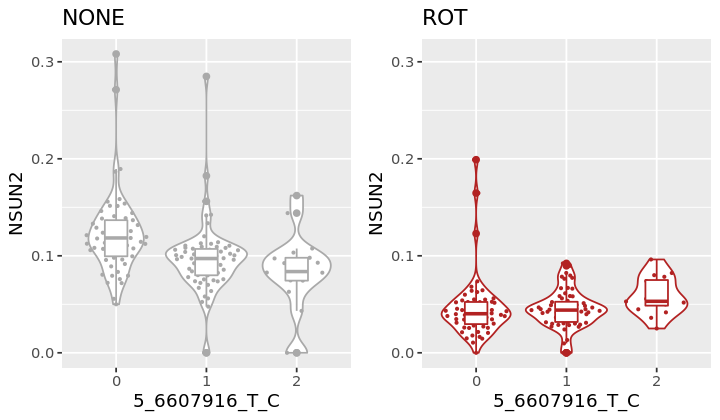

[1] 0.3459132 0.3843705
[1] "FAM118A"


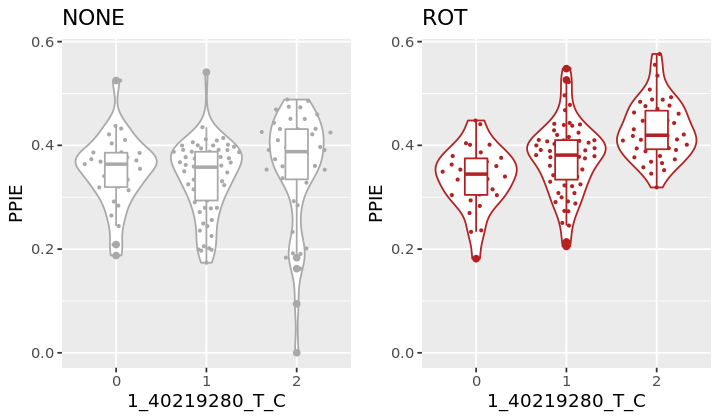

[1] 0.12514129 0.09688453
[1] "GSKIP"


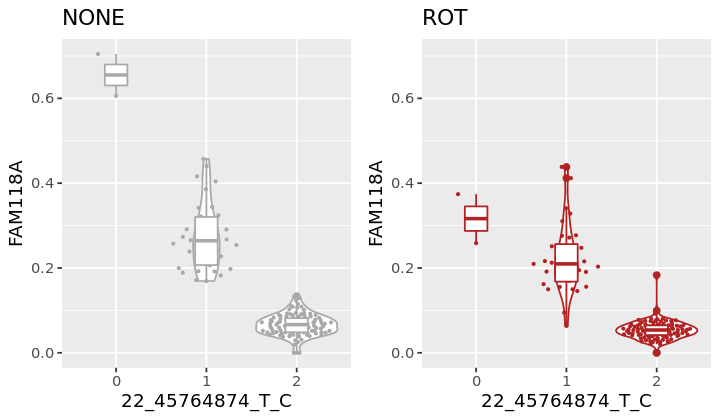

[1] 0.2679299 0.2930983
[1] "MGRN1"


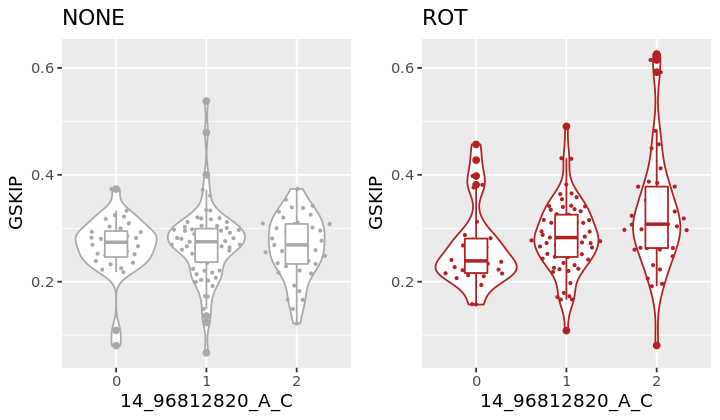

[1] 0.1058403 0.0873094
[1] "ZFR2"


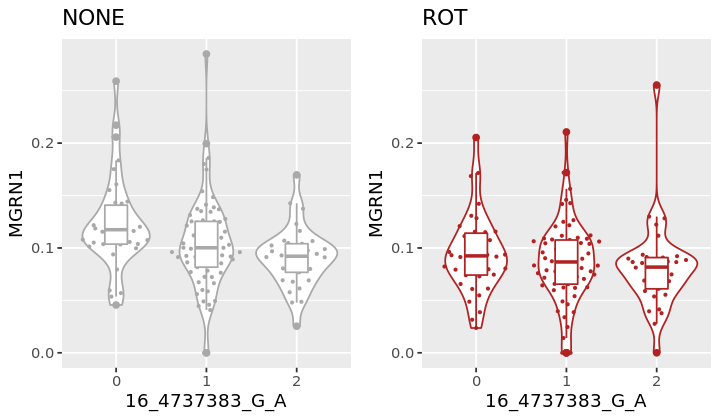

[1] 0.14164586 0.06493985
[1] "PHYH"


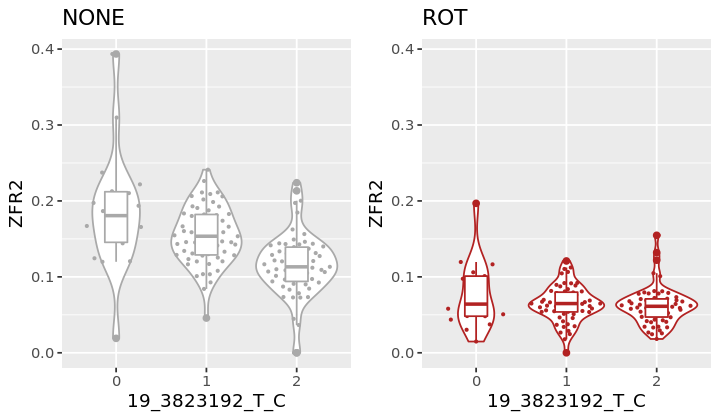

[1] 0.4317273 0.5822606
[1] "SPSB2"


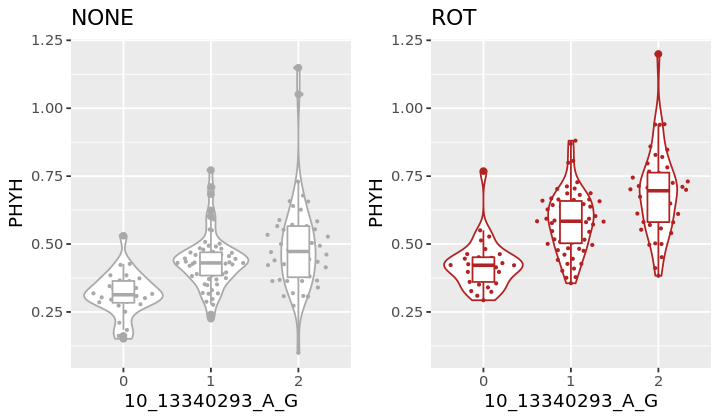

[1] 0.08603083 0.06193365
[1] "DNAJC16"


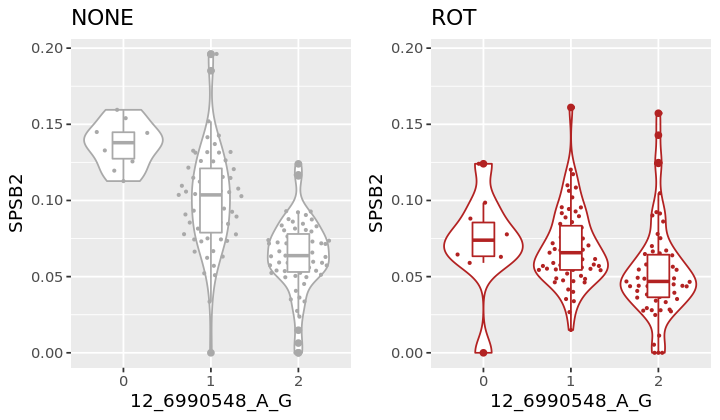

[1] 0.07593141 0.03659942
[1] "CRYZ"
[1] 0.1127798 0.1680376
[1] "WDR60"


Warning message:
“Removed 8 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 8 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 8 rows containing missing values (position_quasirandom).”

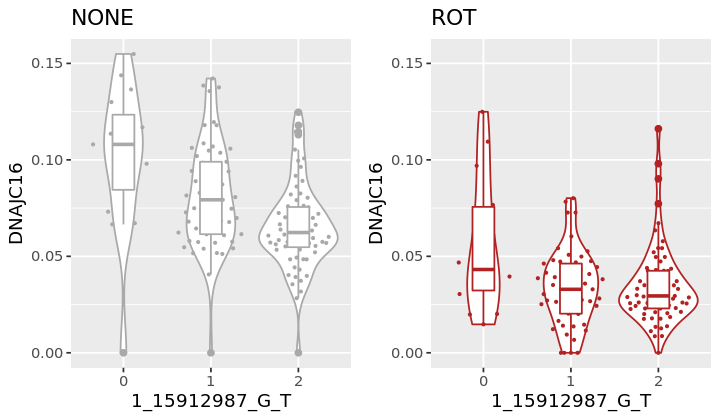

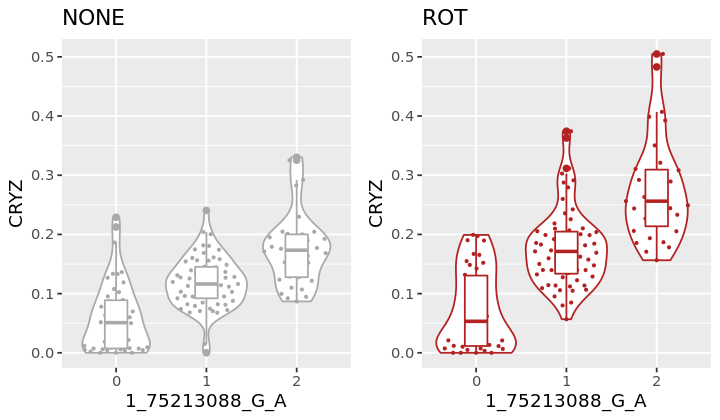

[1] 0.3378719 0.2149943
[1] "NEK3"


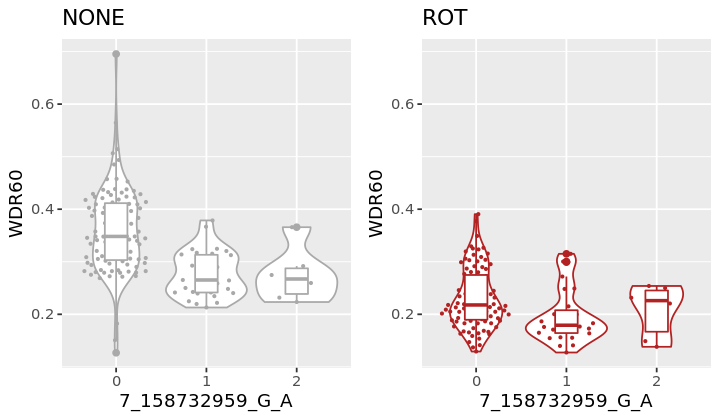

[1] 0.05810231 0.07796658
[1] "NBPF3"


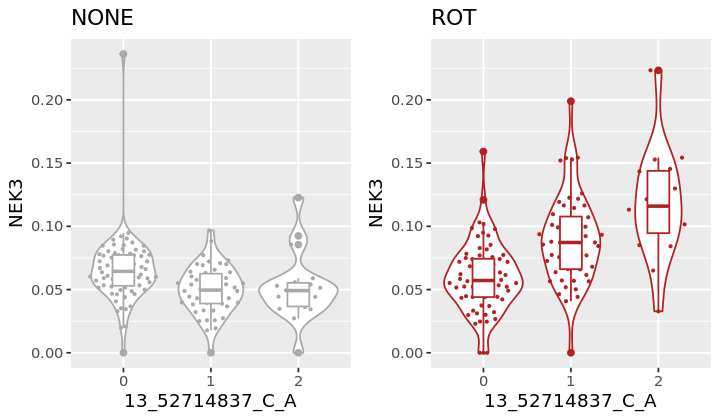

[1] 0.017087194 0.009261458
[1] "THNSL2"
[1] 0.11562449 0.08240604


Warning message in `==.default`(annos$feature_id, as.character(gene)):
“longer object length is not a multiple of shorter object length”Warning message in is.na(e1) | is.na(e2):
“longer object length is not a multiple of shorter object length”

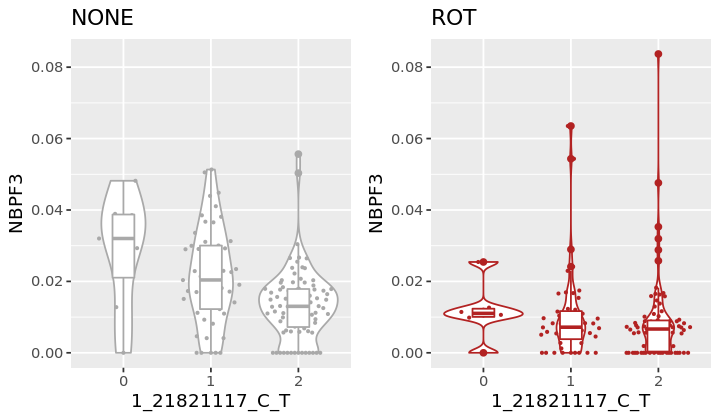

[1] "GTF2H2" "NAIP"  


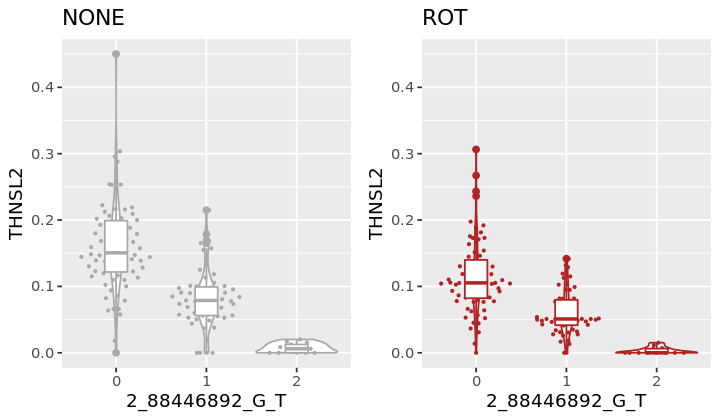

[1] 0.1880348 0.2753025
[1] "SQSTM1"


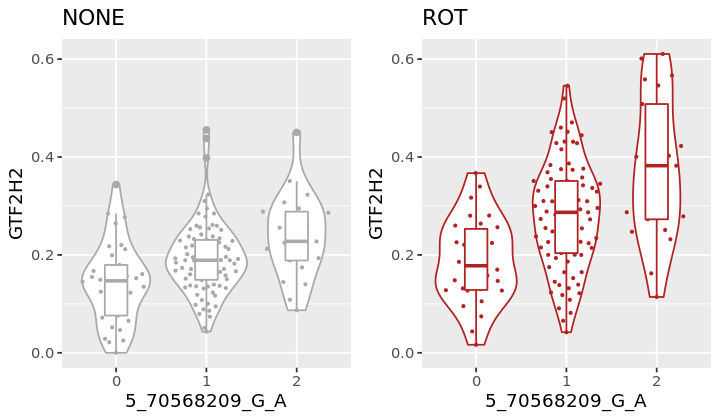

[1] 0.7215254 0.6971222
[1] "NIPAL1"


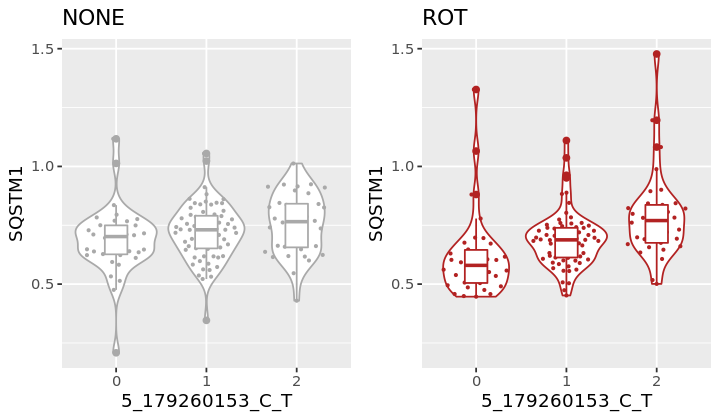

[1] 0.01995992 0.00749157
[1] "SUN1"


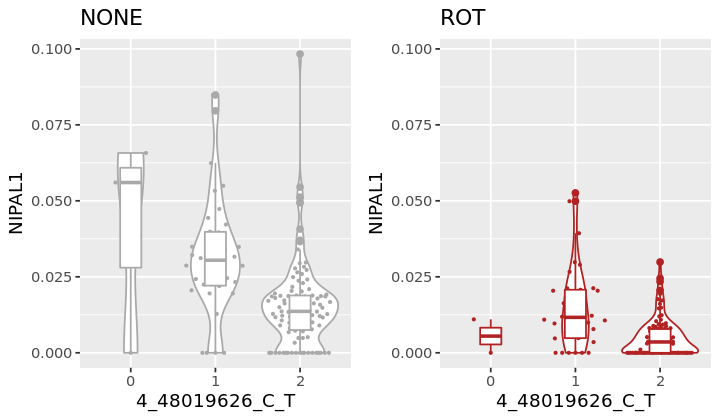

[1] 0.2107086 0.2593133
[1] "REEP3"


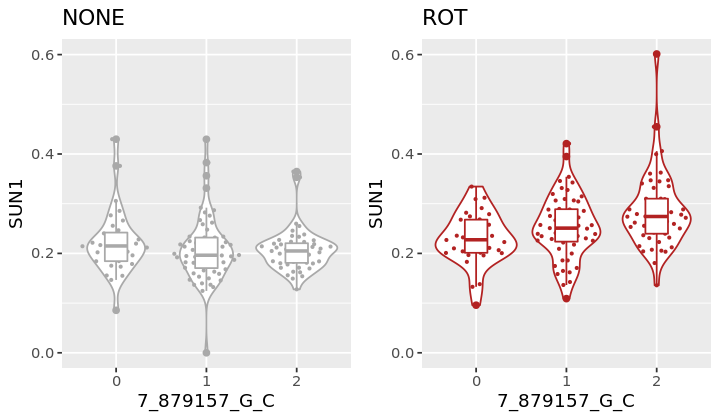

[1] 0.3581995 0.2948326
[1] "SLC18A2"


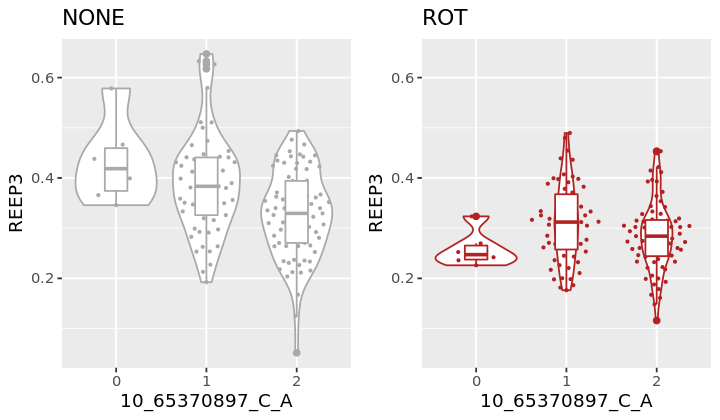

[1] 0.2590814 0.3589252
[1] "C5orf34"


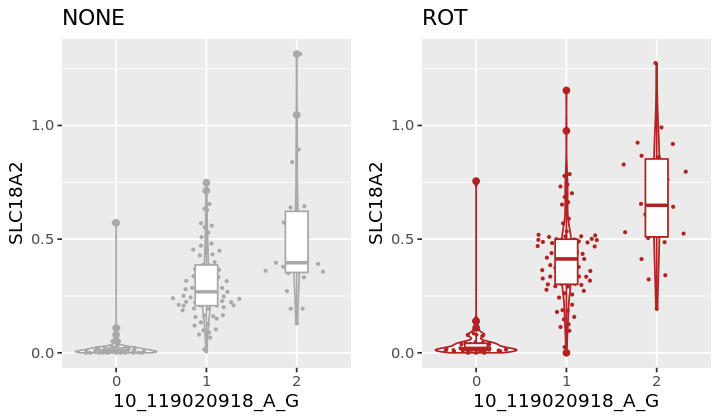

[1] 0.004558561 0.043638849
[1] "GPR171"


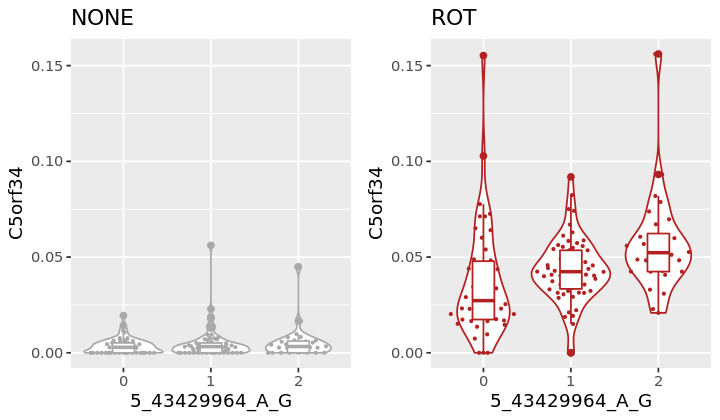

[1] 0.005530112 0.003660311
[1] "RMI2"


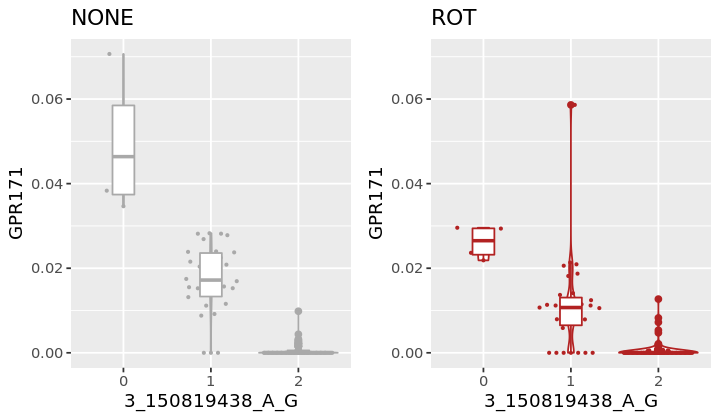

[1] 0.04168986 0.01844611
[1] "CA8"


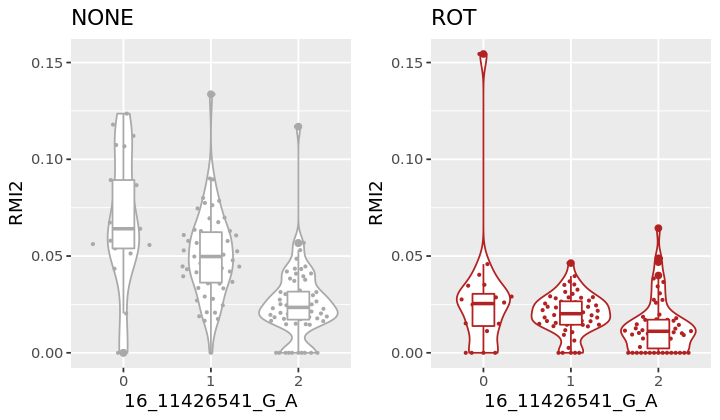

[1] 0.09418114 0.04629303
[1] "FAHD1"


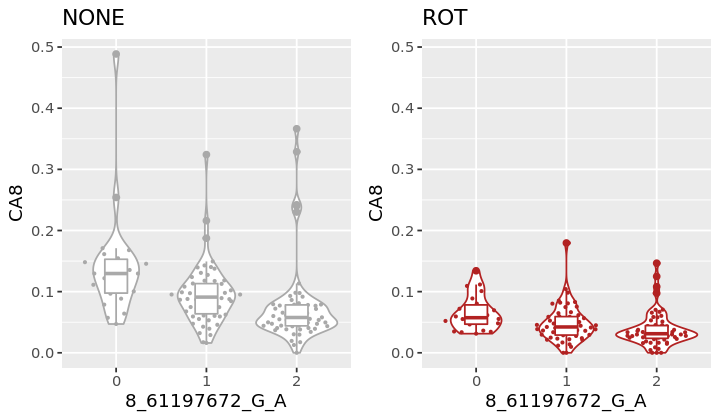

[1] 0.16368169 0.06722987
[1] "LSM10"


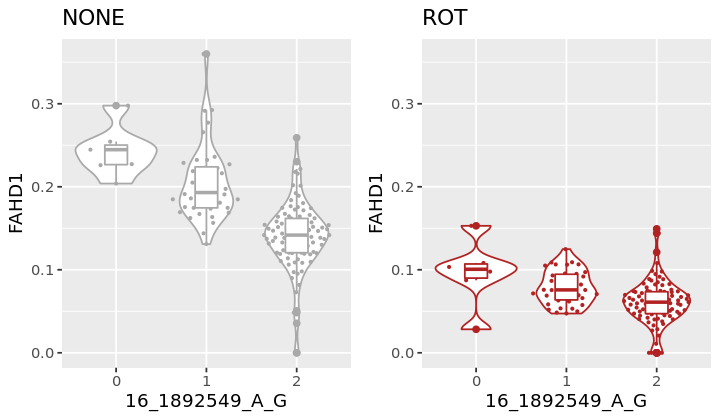

[1] 0.5294550 0.7135743
[1] "TTC32"
[1] 0.16855593 0.08808175


Warning message in `==.default`(annos$feature_id, as.character(gene)):
“longer object length is not a multiple of shorter object length”Warning message in is.na(e1) | is.na(e2):
“longer object length is not a multiple of shorter object length”

[1] "RPL41"


Warning message:
“Removed 1 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 1 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 1 rows containing missing values (position_quasirandom).”

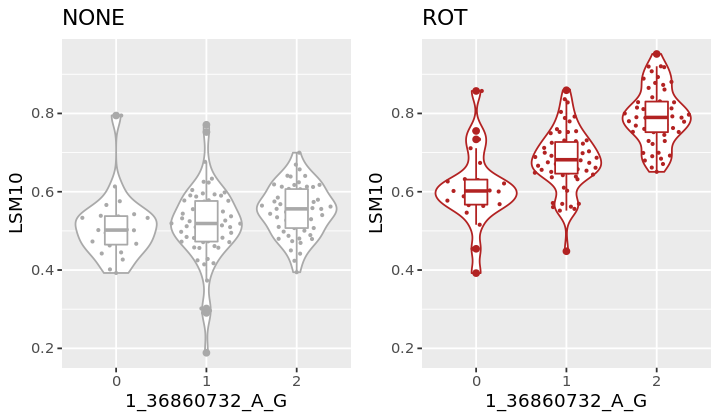

[1] 3.859869 3.858787
[1] "C7orf73"


Warning message:
“Removed 5 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 5 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 5 rows containing missing values (position_quasirandom).”

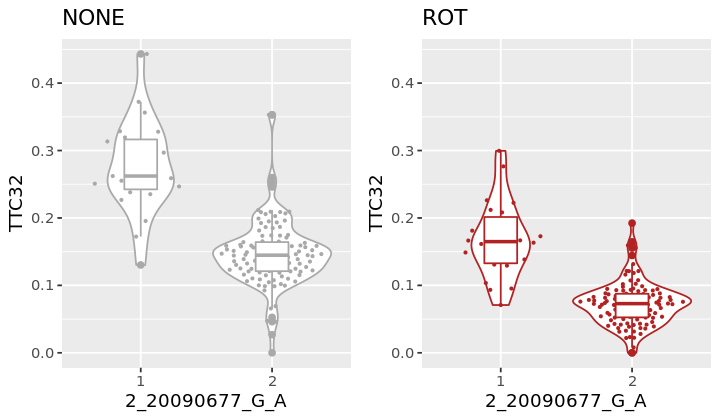

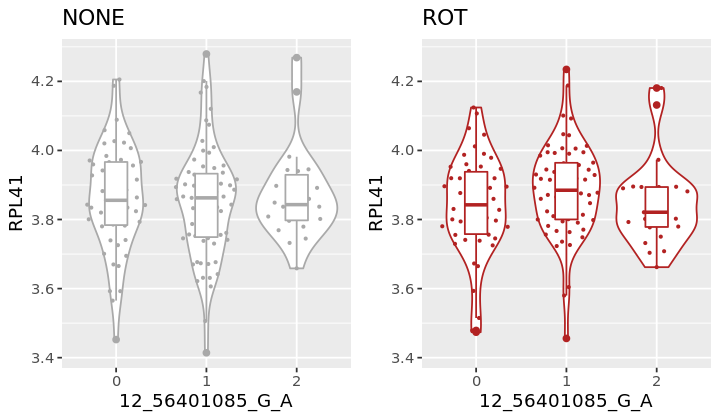

[1] 1.085026 1.070494


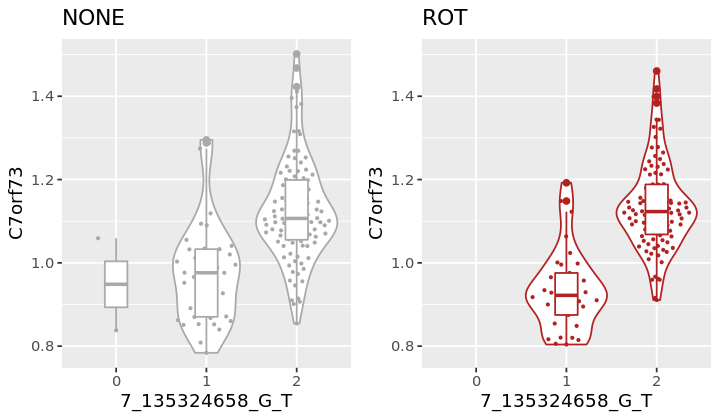

In [37]:
for (i in 1:length(snps_negative)){
#     print(i)
    snp = as.character(snps_negative[i])
#     print(snp)
    gene = as.character(res[res$snp_id == snp,"feature_id"])
#     print(gene)
    gene_name = as.character(annos[annos$feature_id == as.character(gene),"hgnc_symbol"])
    print(gene_name)
    g = data.frame(donor_id = colnames(genos), snp = t(genos[snp,]))
    g$donor_id = as.character(g$donor_id)
    colnames(g)[2] = "dosages"
#     print(head(g,2))
    e1 = e_noROT[,c("donor_id",gene_name)]
    e1$donor_id = as.character(e1$donor_id)
    df1 = inner_join(e1,g,by = "donor_id")
    colnames(df1)[2] = "gene"
    df1$genotypes <- round(df1$dosages)
#     print(head(df1,2))
    e2 = e_ROT[,c("donor_id",gene_name)]
    e2$donor_id = as.character(e2$donor_id)
    df2 = inner_join(e2,g,by = "donor_id")
    colnames(df2)[2] = "gene"
    df2$genotypes <- round(df2$dosages)
#     print(head(df2,2))   
    m = min(min(df1$gene),min(df1$gene))
    M = max(max(df1$gene),max(df2$gene))
    p1 = ggplot(df1, aes(x = as.factor(genotypes), y = gene)) +  geom_violin(col = col_NONE) + 
                xlab(snp) + ylab(gene_name) +  geom_quasirandom(size = 0.5, col = col_NONE) + 
                geom_boxplot(width = 0.25, col = col_NONE) + ylim(c(m,M)) + ggtitle("NONE")
    p2 = ggplot(df2, aes(x = as.factor(genotypes), y = gene))  + geom_violin(col = col_ROT) + 
                xlab(snp) + ylab(gene_name) + geom_quasirandom(size = 0.5, col = col_ROT) + 
                geom_boxplot(width = 0.25, col = col_ROT) + ylim(c(m,M)) +  ggtitle("ROT")
    options(repr.plot.width=6, repr.plot.height=3.5)
    print(cowplot::plot_grid(p1, p2, align = "h", ncol = 2))   
    print(c(mean(df1$gene),mean(df2$gene)))
}

In [11]:
res = int_Sert[int_Sert$q_value < 0.05,]
snps = unique(res$snp_id)
length(snps)

[1] 458

[1] "NEK3"
[1] 0.05810231 0.07796658
[1] "NEK3"


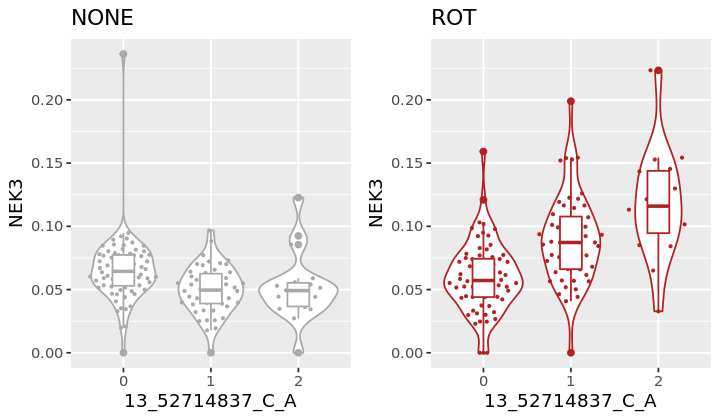

[1] 0.05810231 0.07796658
[1] "TMEM38B"


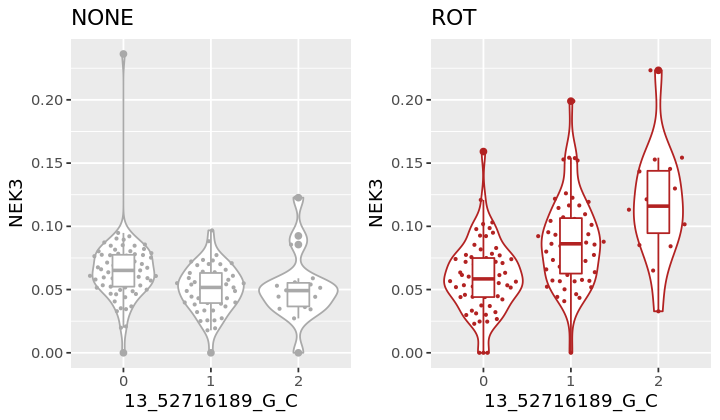

[1] 0.1373120 0.2573837
[1] "TMEM38B"


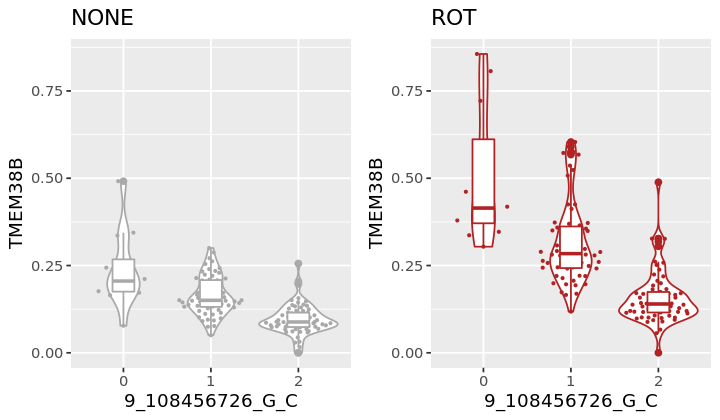

[1] 0.1373120 0.2573837
[1] "GPR171"


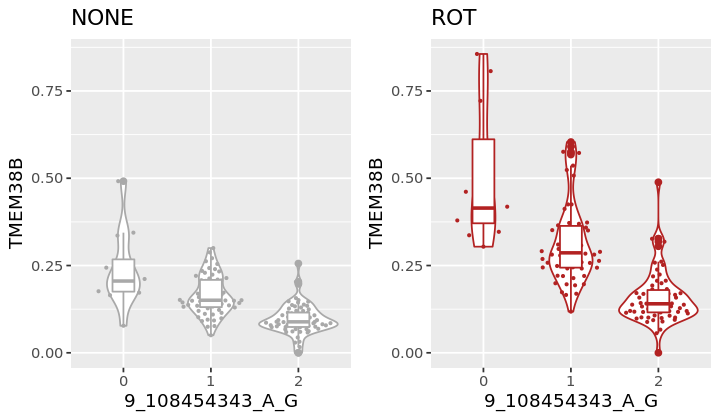

[1] 0.005530112 0.003660311
[1] "NEK3"


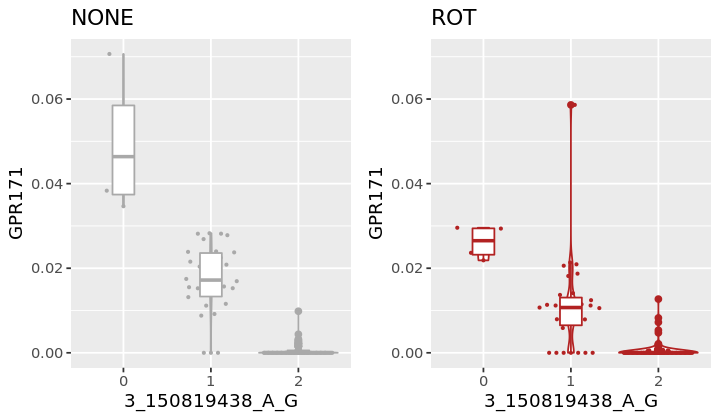

[1] 0.05810231 0.07796658
[1] "TMEM38B"


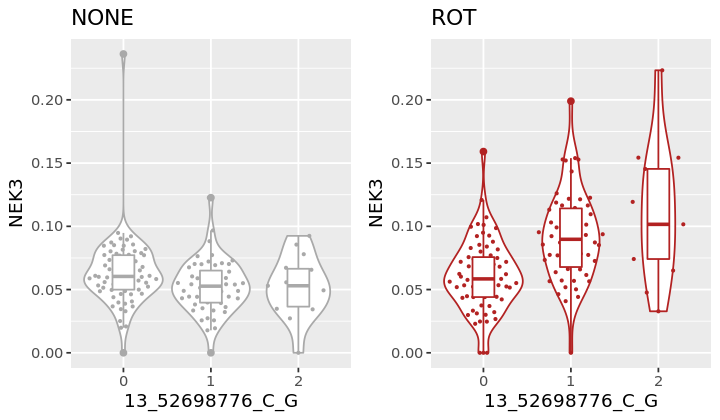

[1] 0.1373120 0.2573837
[1] "LSM10"


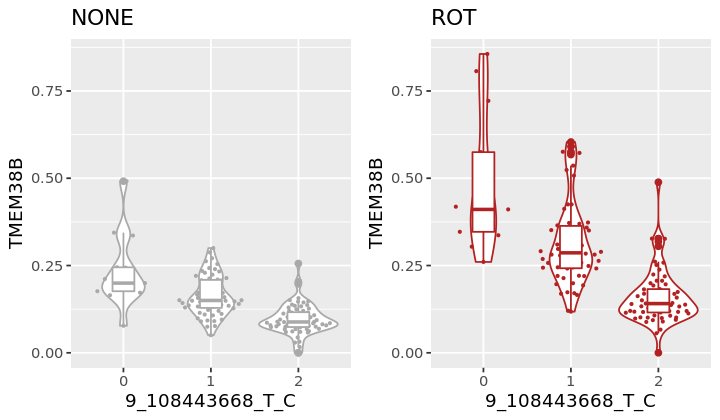

[1] 0.5294550 0.7135743
[1] "APIP"


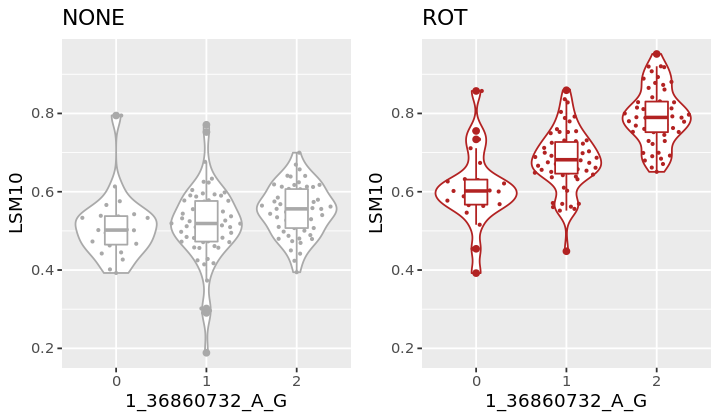

[1] 0.2321799 0.2084563
[1] "FAM118A"


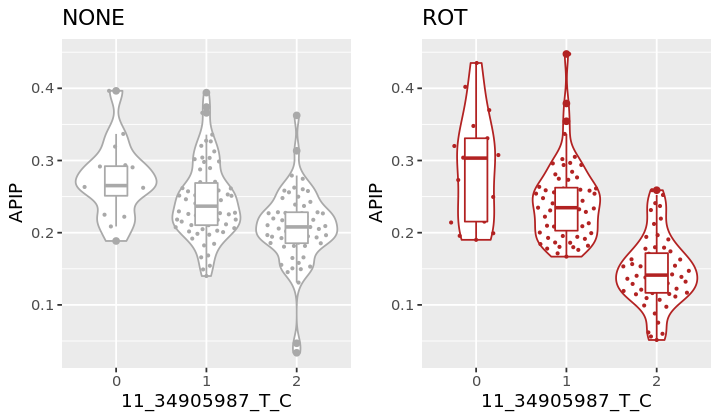

[1] 0.12514129 0.09688453
[1] "FAM118A"


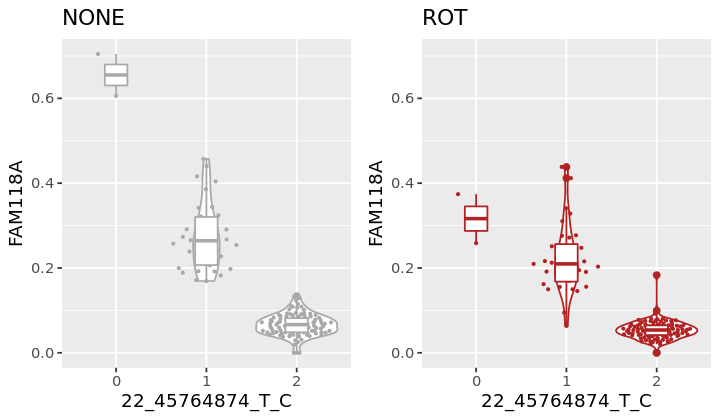

[1] 0.12514129 0.09688453
[1] "GPR171"


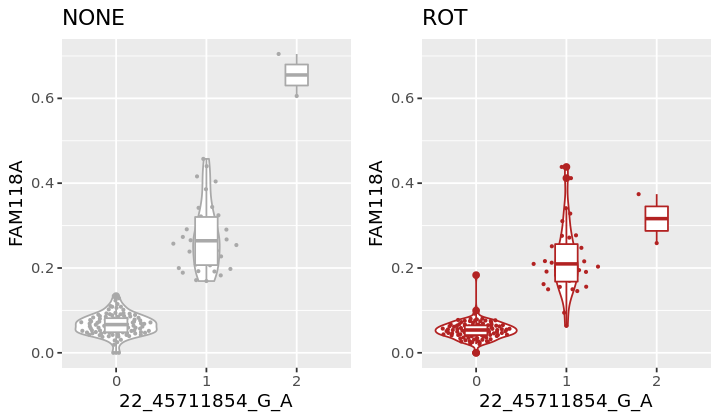

[1] 0.005530112 0.003660311
[1] "GPR171"


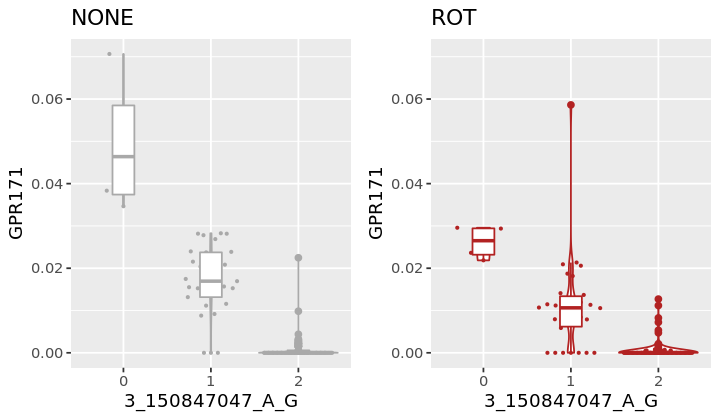

[1] 0.005530112 0.003660311
[1] "LSM10"
[1] 0.5294550 0.7135743


Warning message in `==.default`(annos$feature_id, as.character(gene)):
“longer object length is not a multiple of shorter object length”Warning message in is.na(e1) | is.na(e2):
“longer object length is not a multiple of shorter object length”

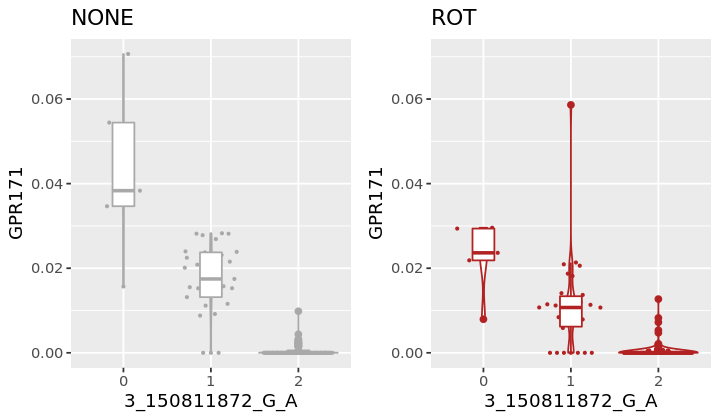

[1] "CRYZ" "TYW3"


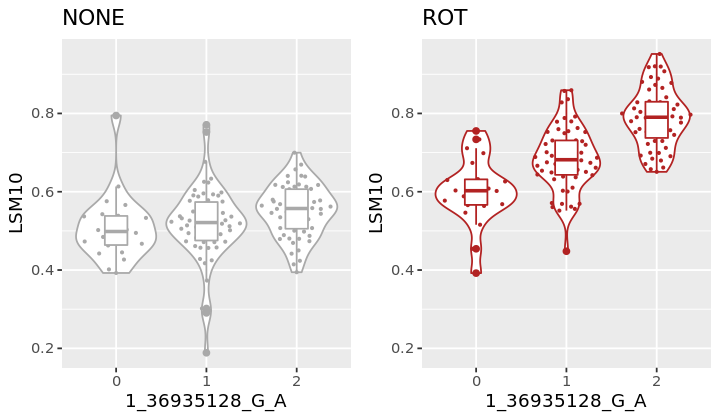

[1] 0.1127798 0.1680376
[1] "SLC18A2"
[1] 0.2590814 0.3589252


Warning message in `==.default`(annos$feature_id, as.character(gene)):
“longer object length is not a multiple of shorter object length”Warning message in is.na(e1) | is.na(e2):
“longer object length is not a multiple of shorter object length”

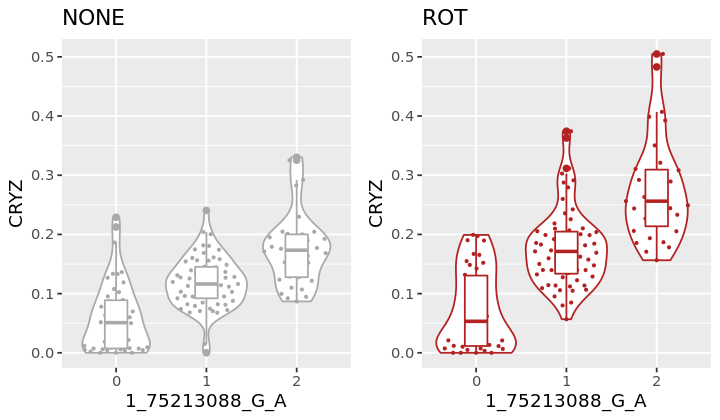

[1] "CRYZ" "TYW3"


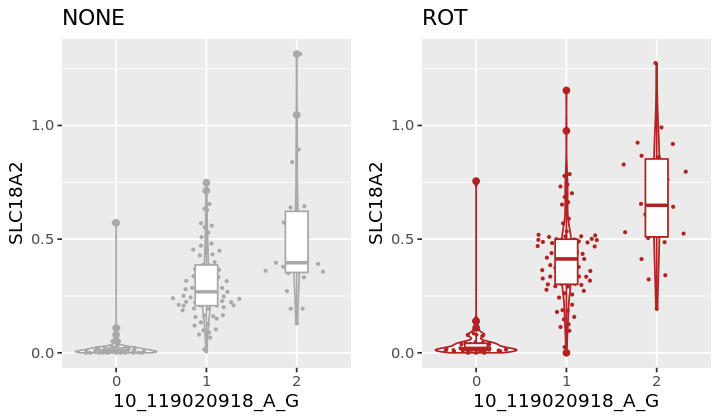

[1] 0.1127798 0.1680376
[1] "C11orf24"


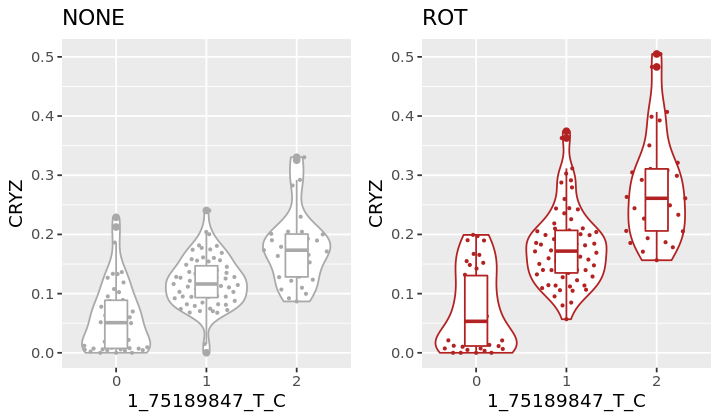

[1] 0.05253354 0.05743496
[1] "C11orf24"


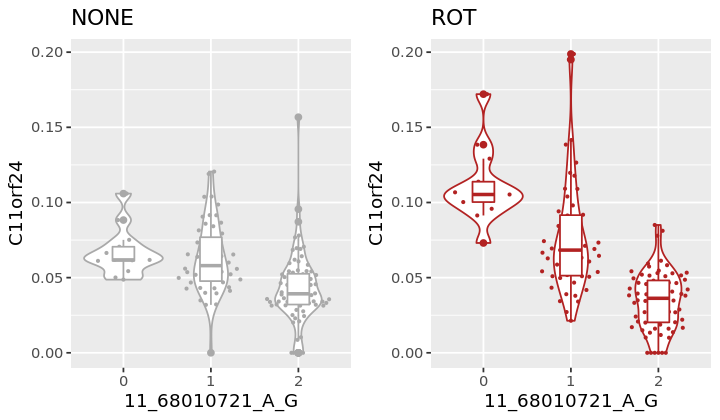

[1] 0.05253354 0.05743496
[1] "GPR171"


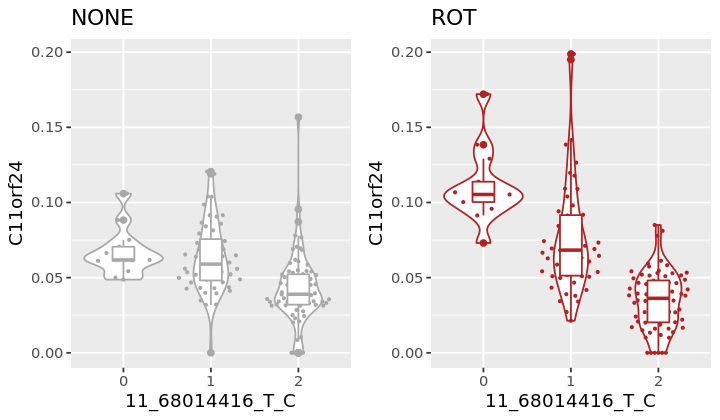

[1] 0.005530112 0.003660311
[1] "TTC32"


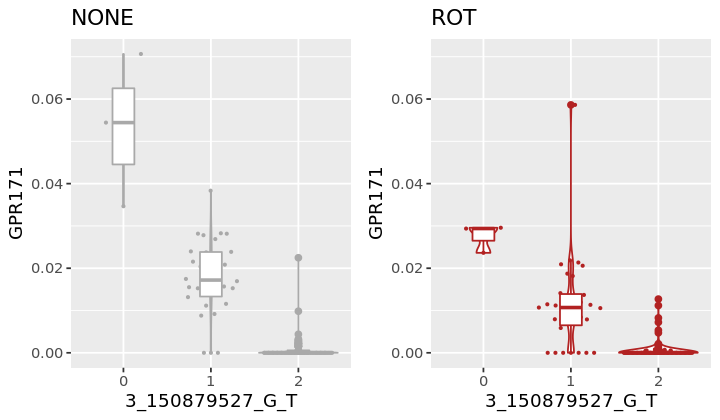

[1] 0.16855593 0.08808175
[1] "NSUN2"
[1] 0.10529365 0.04681489
[1] "C7orf73"


Warning message:
“Removed 5 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 5 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 5 rows containing missing values (position_quasirandom).”

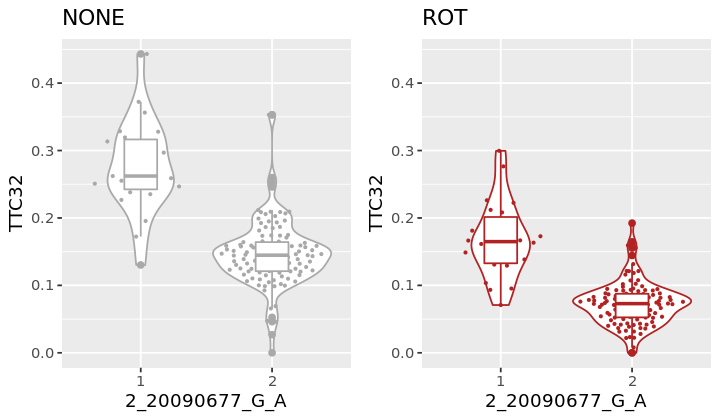

[1] 1.085026 1.070494
[1] "C7orf73"


Warning message:
“Removed 5 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 5 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 5 rows containing missing values (position_quasirandom).”

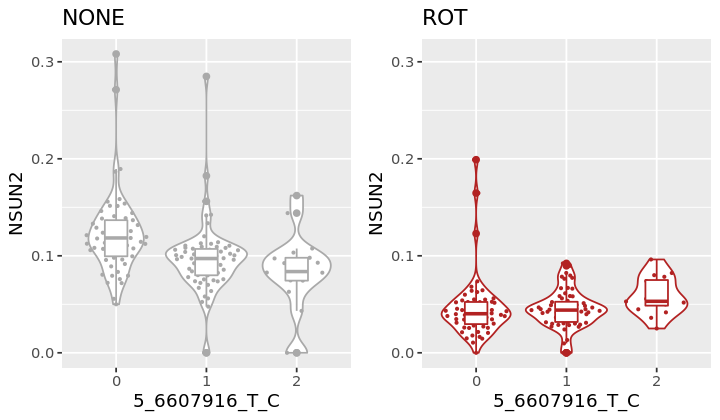

[1] 1.085026 1.070494


Warning message in `==.default`(annos$feature_id, as.character(gene)):
“longer object length is not a multiple of shorter object length”Warning message in is.na(e1) | is.na(e2):
“longer object length is not a multiple of shorter object length”

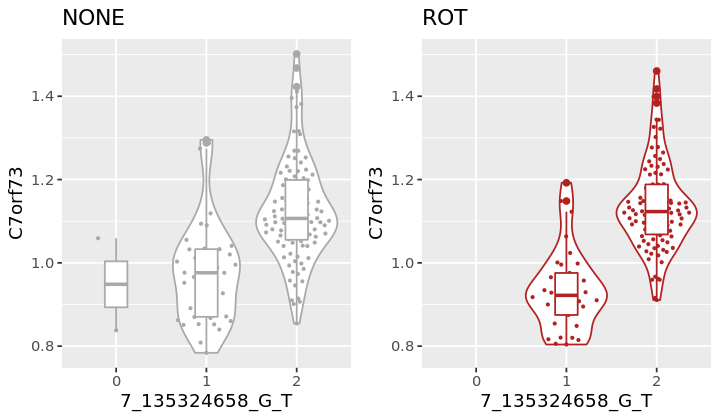

[1] "GTF2H2" "NAIP"  


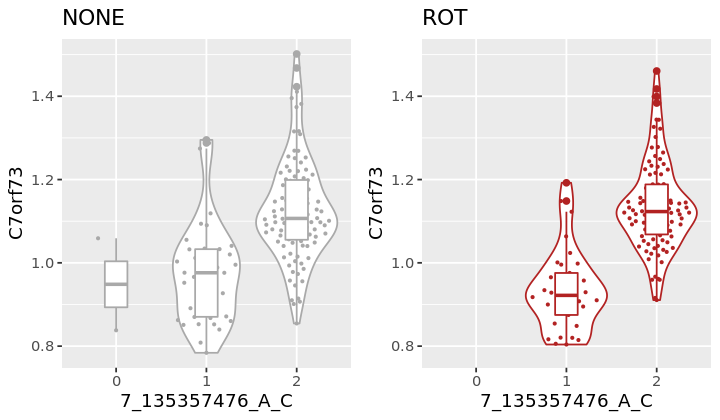

[1] 0.1880348 0.2753025
[1] "CCZ1B"


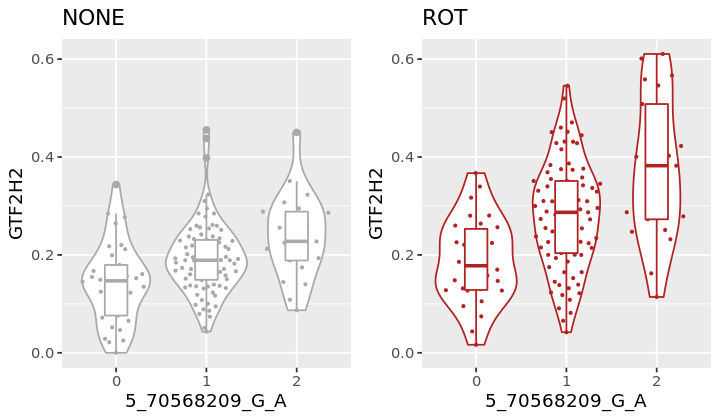

[1] 0.11435705 0.09584318
[1] "ZNF587"


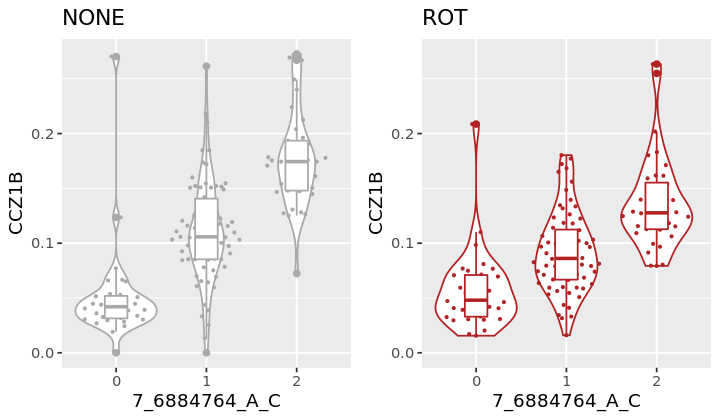

[1] 0.07659227 0.07012062
[1] "CCZ1B"


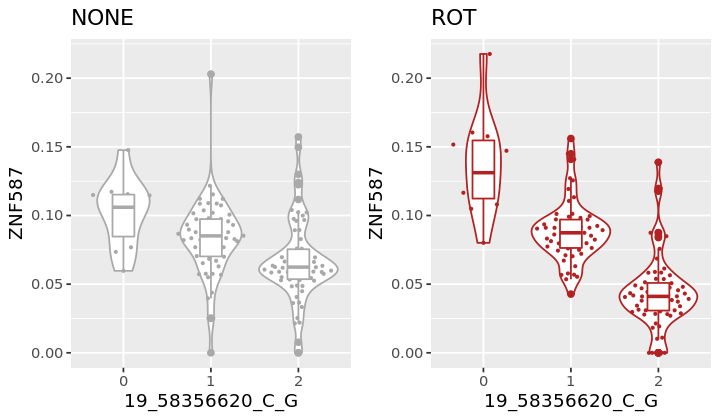

[1] 0.11435705 0.09584318
[1] "NSUN2"


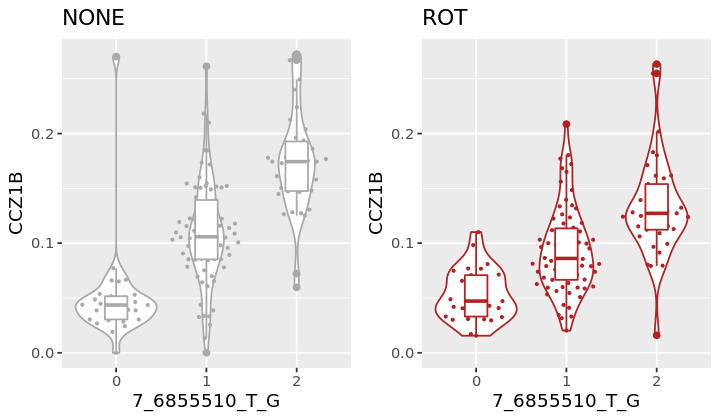

[1] 0.10529365 0.04681489
[1] "FAHD1"


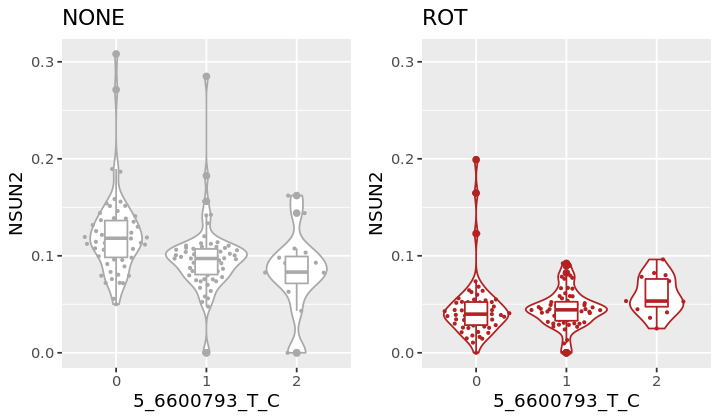

[1] 0.16368169 0.06722987
[1] "ZNF587"


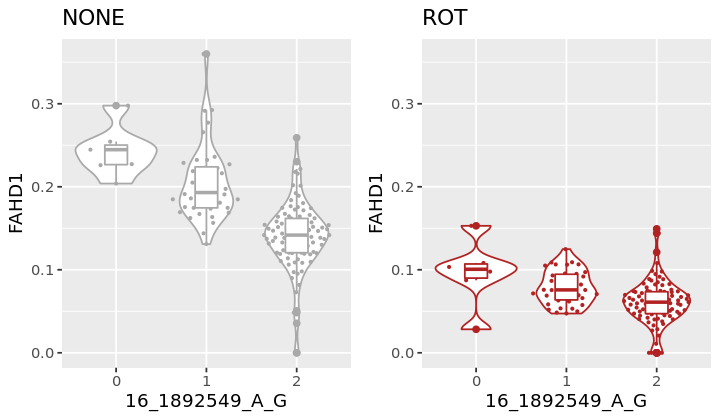

[1] 0.07659227 0.07012062
[1] "FAHD1"


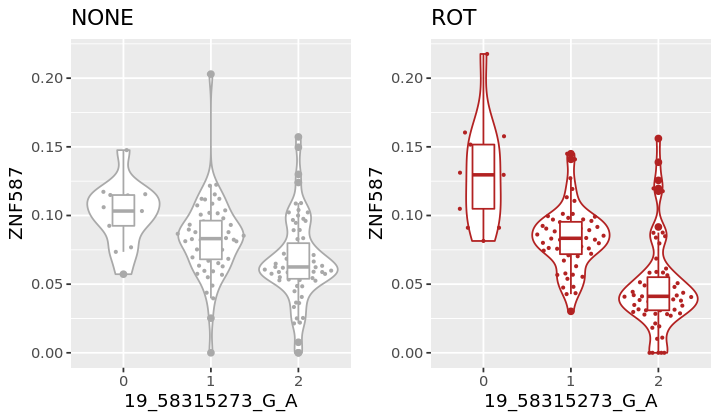

[1] 0.16368169 0.06722987
[1] "FAHD1"


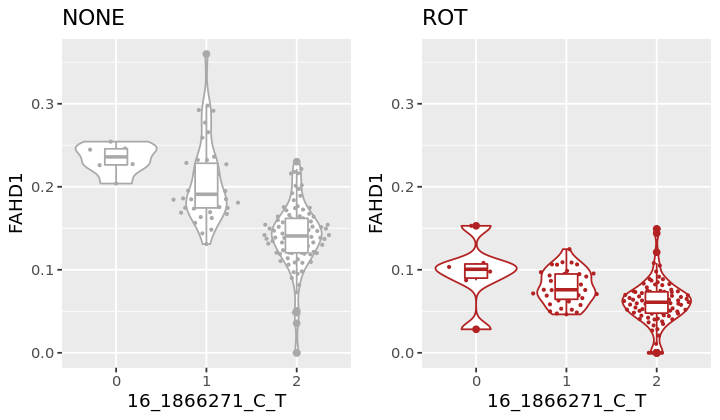

[1] 0.16368169 0.06722987
[1] "RASEF"


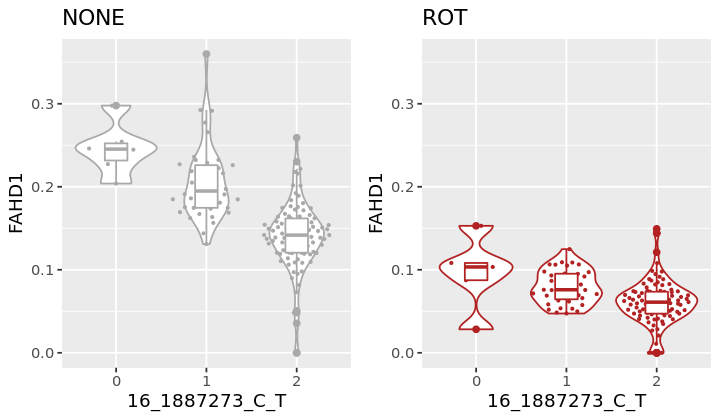

[1] 0.14947484 0.05303349
[1] "ZNF587"
[1] 0.07659227 0.07012062
[1] "RPS26"


Warning message:
“Removed 5 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 5 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 5 rows containing missing values (position_quasirandom).”

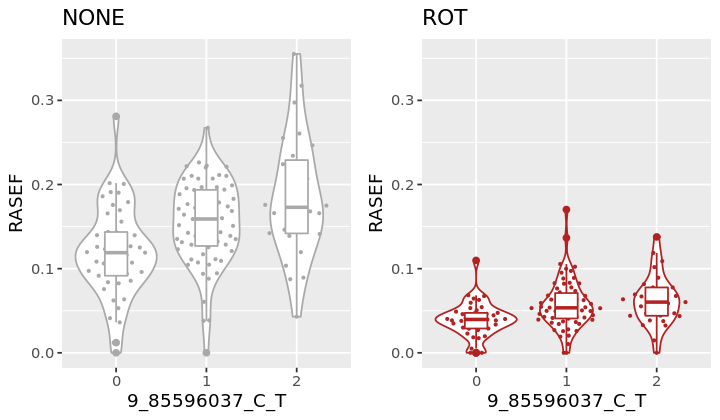

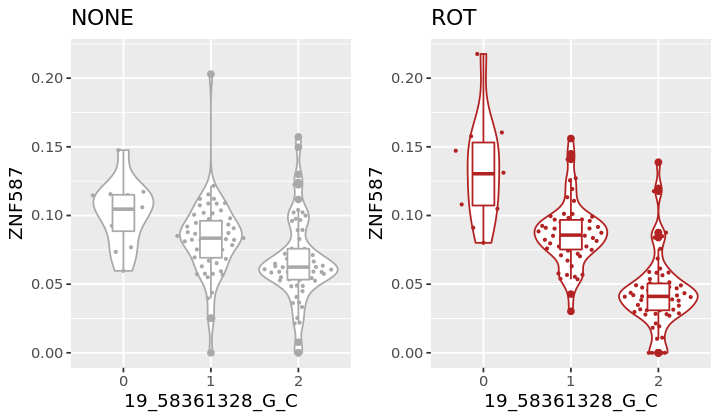

[1] 2.123279 1.992524
[1] "FEZ2"


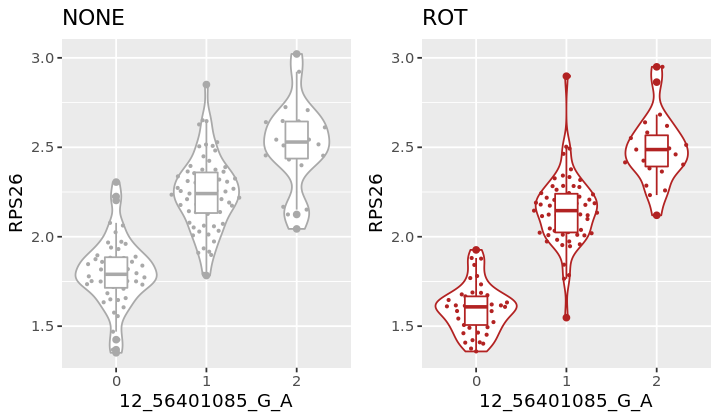

[1] 0.2204836 0.1600431
[1] "GSKIP"


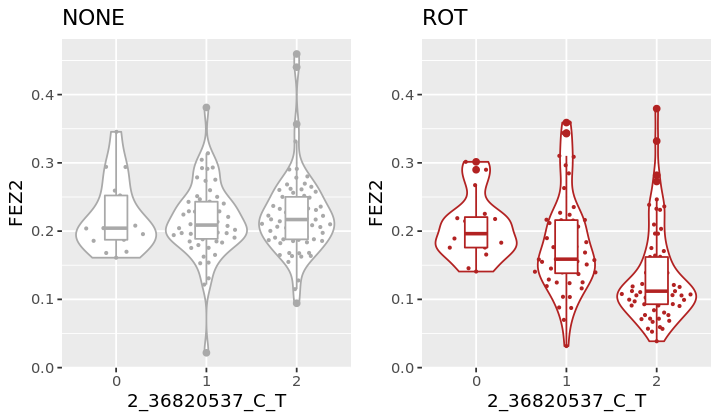

[1] 0.2679299 0.2930983
[1] "GSKIP"


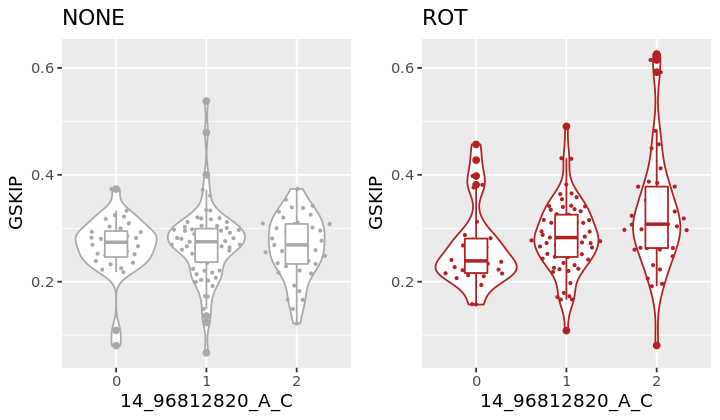

[1] 0.2679299 0.2930983
[1] "SPSB2"


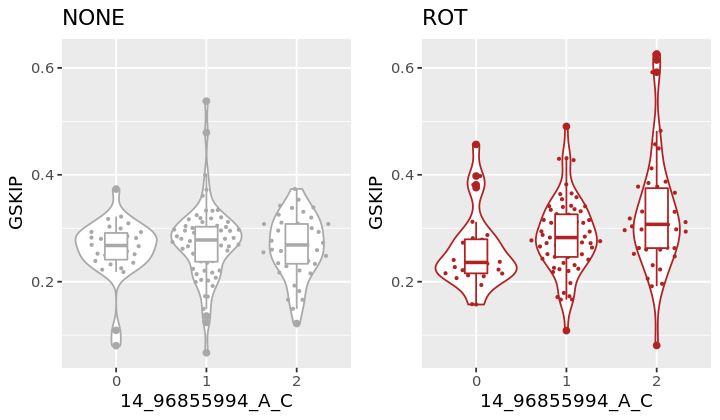

[1] 0.08603083 0.06193365
[1] "FAHD1"


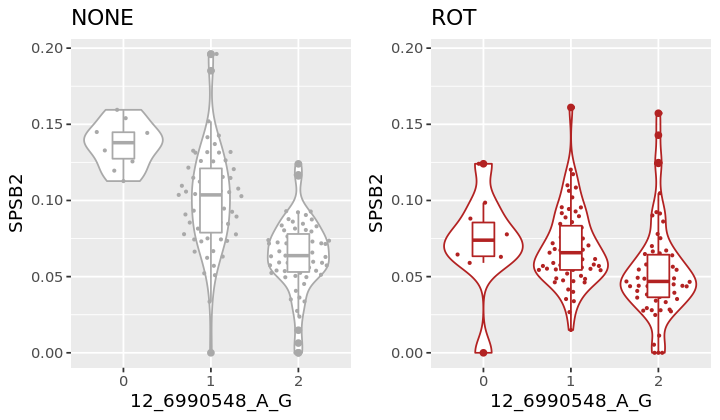

[1] 0.16368169 0.06722987
[1] "C5orf34"


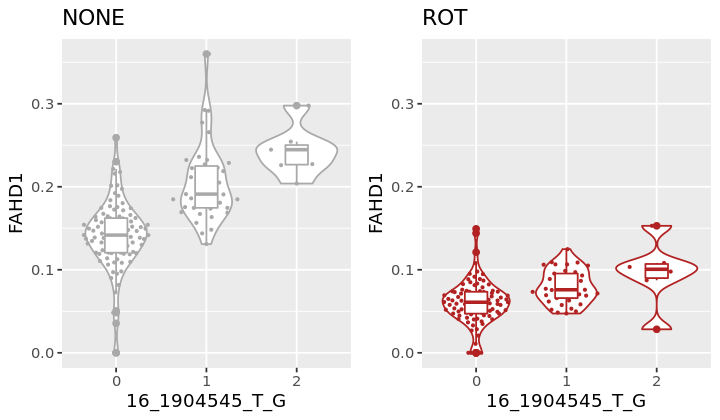

[1] 0.004558561 0.043638849
[1] "RASEF"
[1] 0.14947484 0.05303349
[1] "C7orf73"


Warning message:
“Removed 5 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 5 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 5 rows containing missing values (position_quasirandom).”

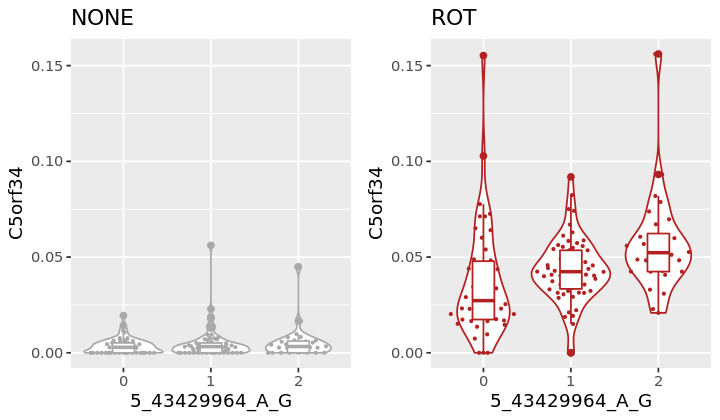

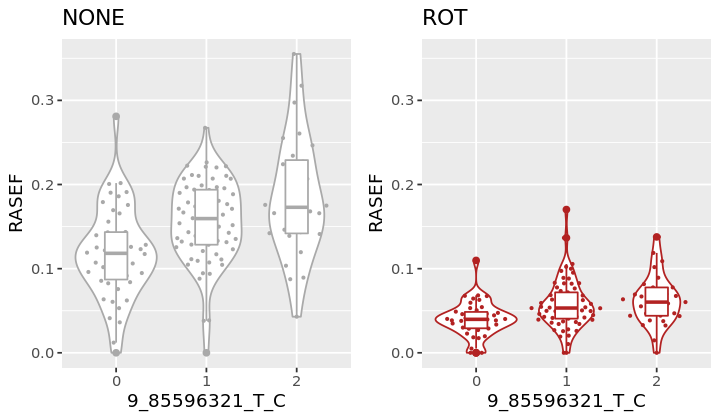

[1] 1.085026 1.070494
[1] "RMI2"


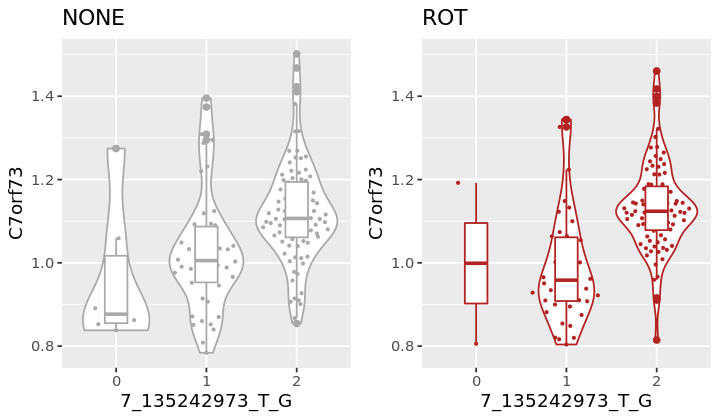

[1] 0.04168986 0.01844611
[1] "ZNF587"


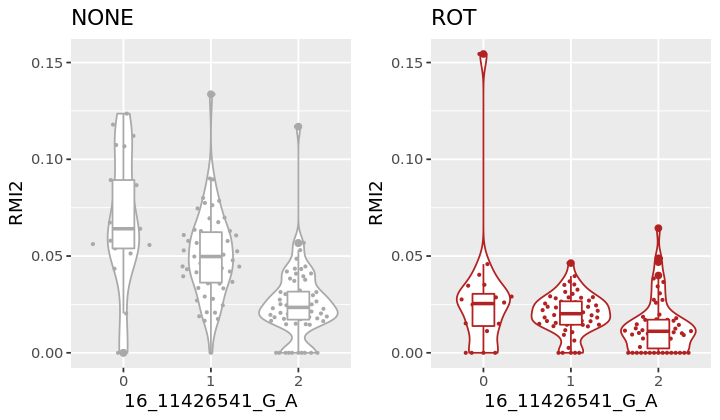

[1] 0.07659227 0.07012062
[1] "FAHD1"


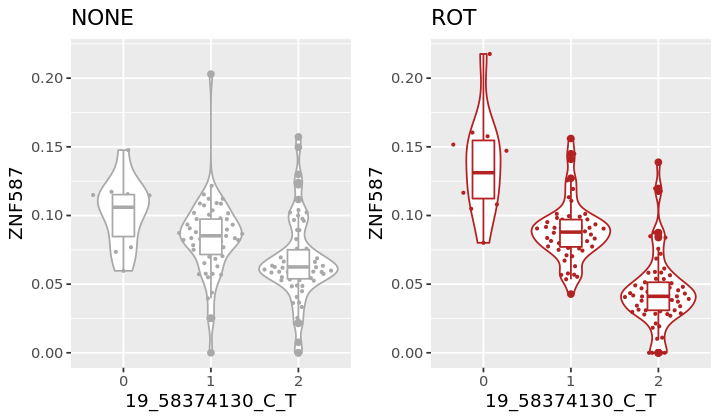

[1] 0.16368169 0.06722987
[1] "FAHD1"


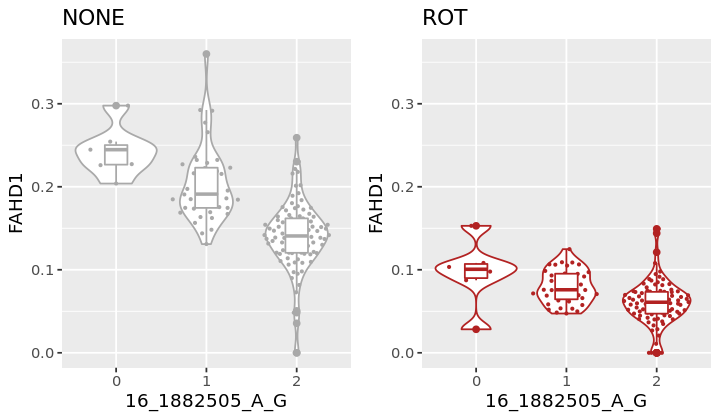

[1] 0.16368169 0.06722987
[1] "C5orf34"


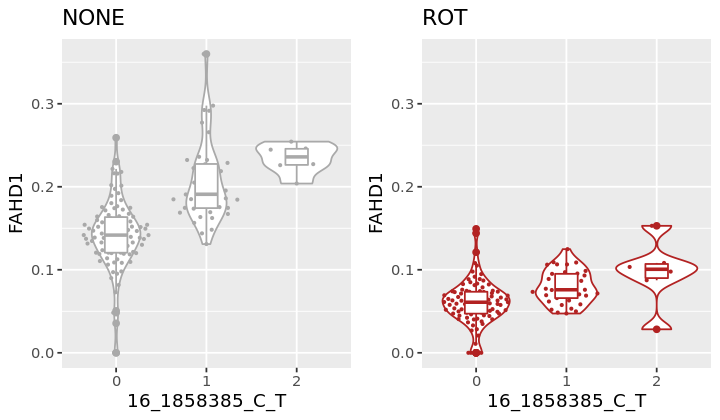

[1] 0.004558561 0.043638849
[1] "GSKIP"


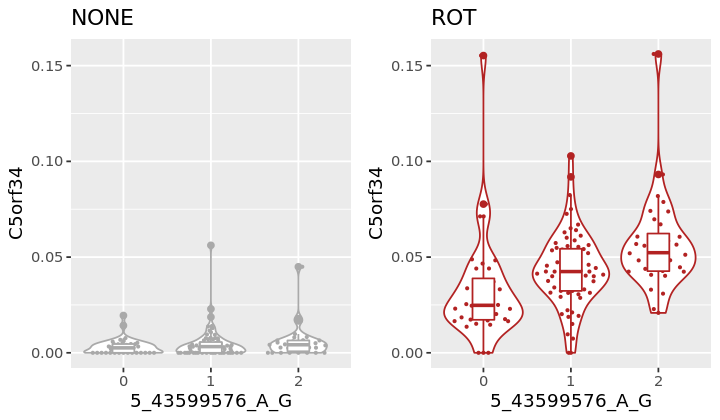

[1] 0.2679299 0.2930983
[1] "RMI2"


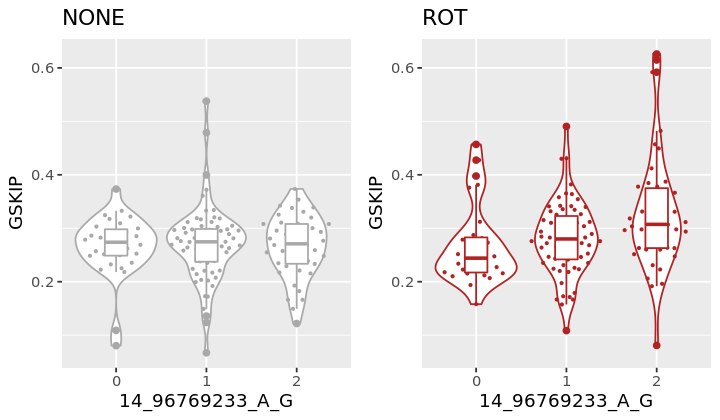

[1] 0.04168986 0.01844611
[1] "FAHD1"


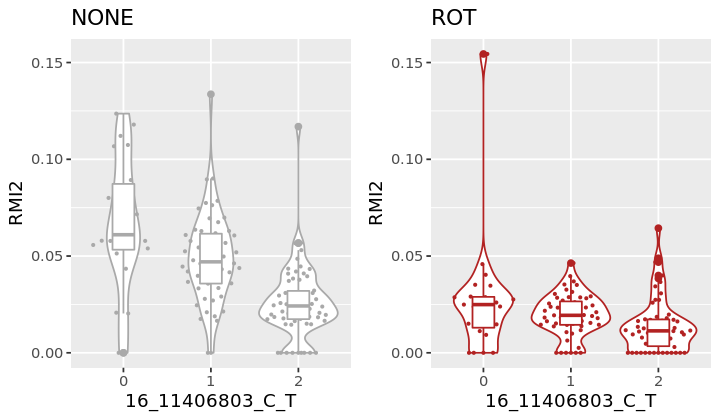

[1] 0.16368169 0.06722987
[1] "FAHD1"


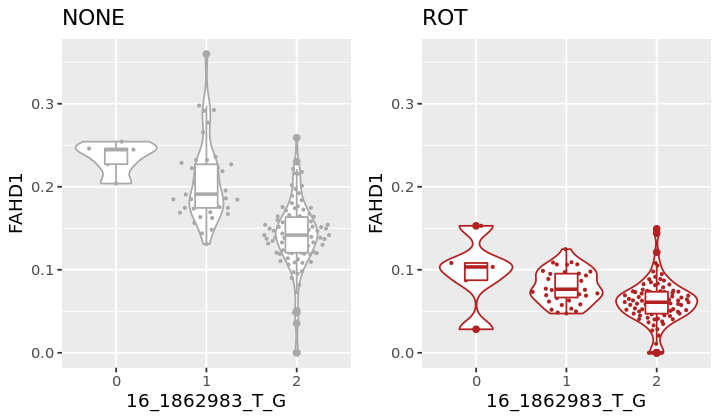

[1] 0.16368169 0.06722987
[1] "MAP3K8"


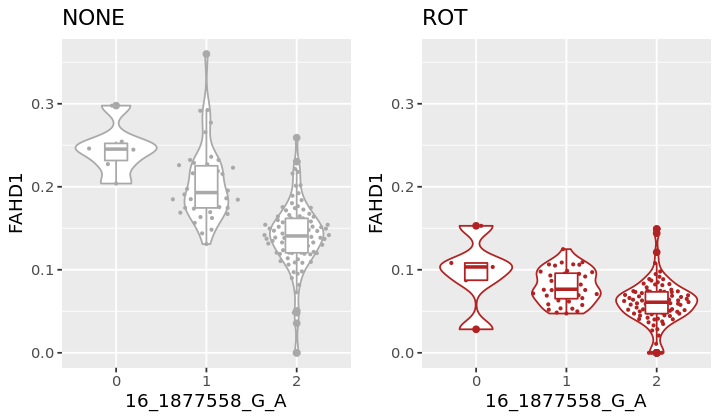

[1] 0.0513082 0.1269314
[1] "SPSB2"


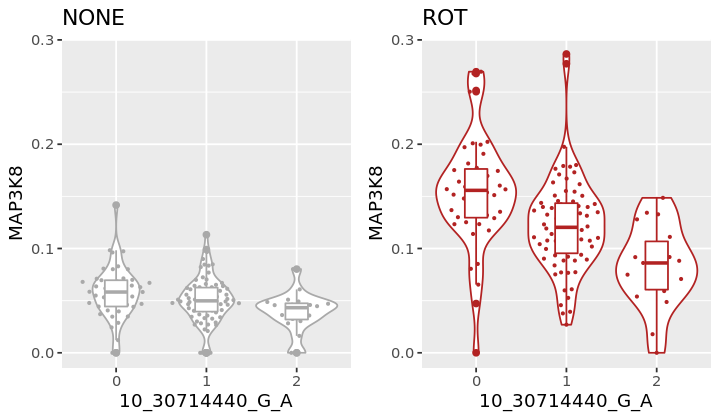

[1] 0.08603083 0.06193365
[1] "SPSB2"


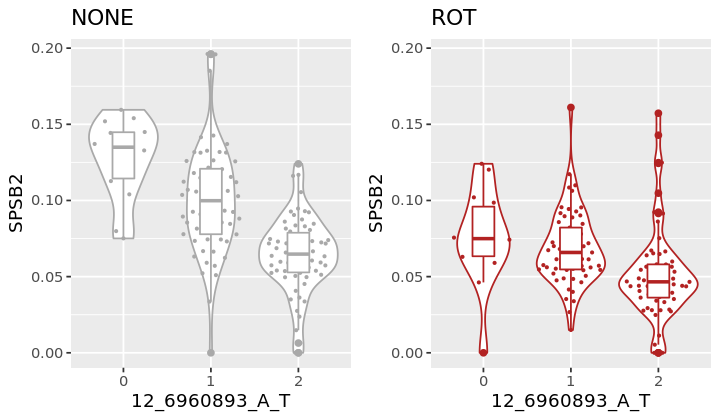

[1] 0.08603083 0.06193365
[1] "SPSB2"
[1] 0.08603083 0.06193365
[1] "WDR60"


Warning message:
“Removed 8 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 8 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 8 rows containing missing values (position_quasirandom).”

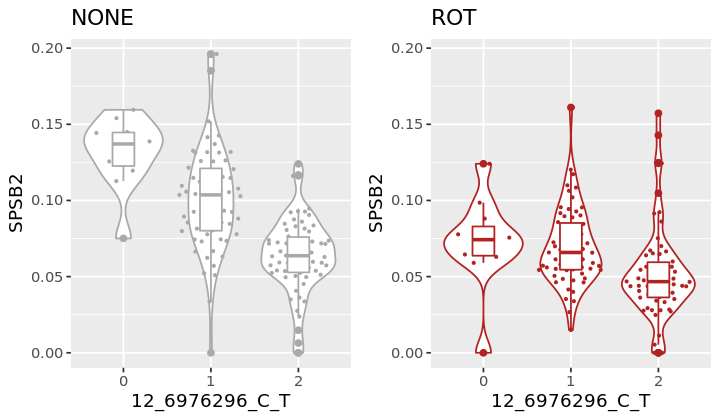

[1] 0.3378719 0.2149943
[1] "WDR60"


Warning message:
“Removed 8 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 8 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 8 rows containing missing values (position_quasirandom).”

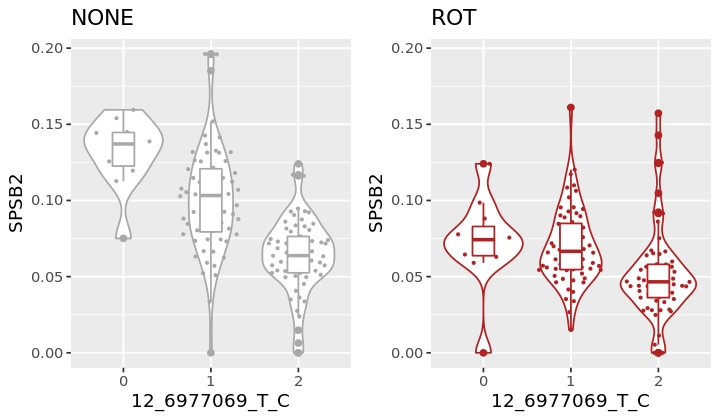

[1] 0.3378719 0.2149943
[1] "WDR60"


Warning message:
“Removed 8 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 8 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 8 rows containing missing values (position_quasirandom).”

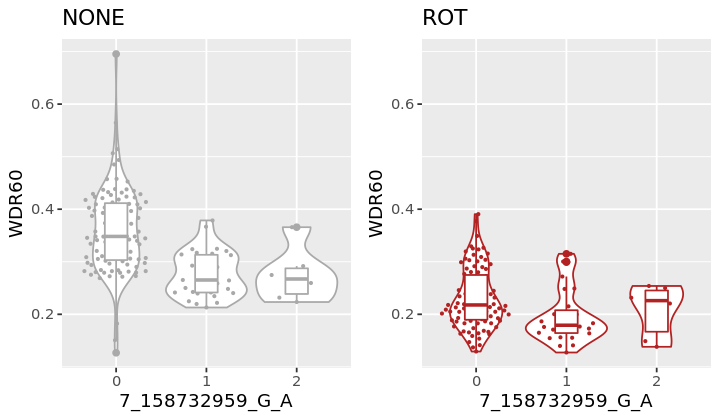

[1] 0.3378719 0.2149943
[1] "C7orf73"


Warning message:
“Removed 5 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 5 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 5 rows containing missing values (position_quasirandom).”

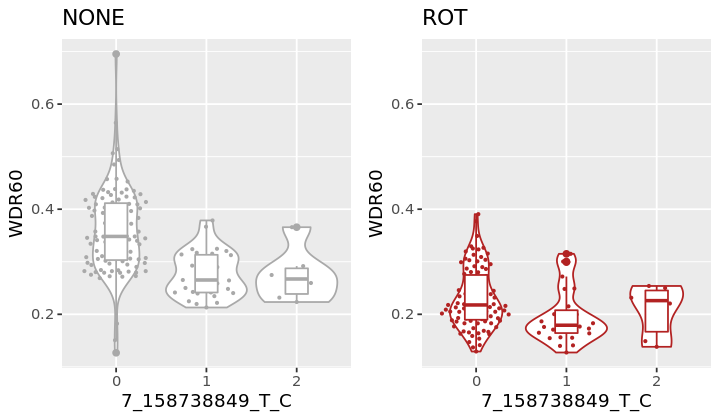

[1] 1.085026 1.070494
[1] "C7orf73"


Warning message:
“Removed 5 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 5 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 5 rows containing missing values (position_quasirandom).”

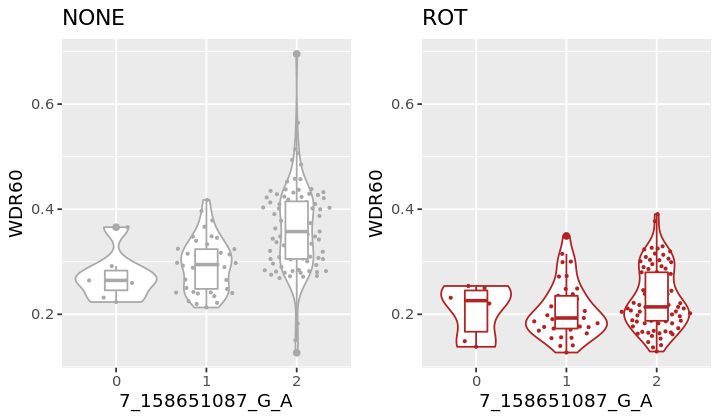

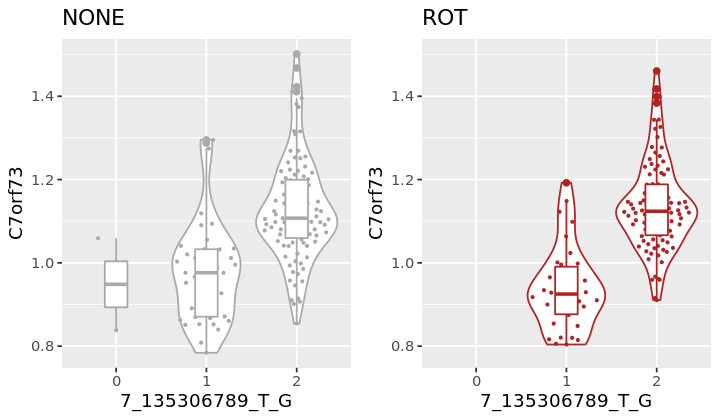

[1] 1.085026 1.070494
[1] "GSKIP"


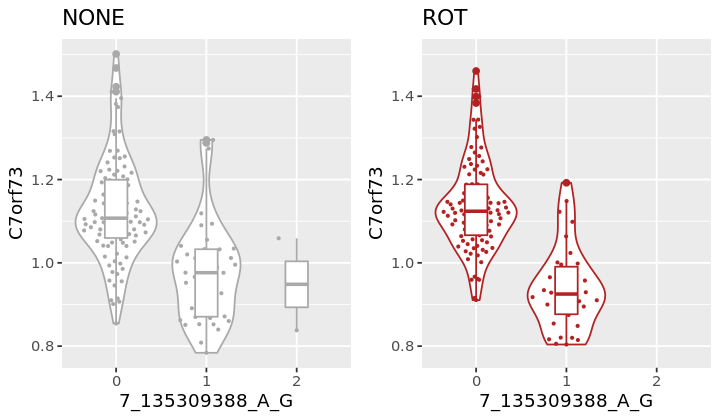

[1] 0.2679299 0.2930983
[1] "GSKIP"
[1] 0.2679299 0.2930983
[1] "ARPC2"


Warning message:
“Removed 57 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 57 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 57 rows containing missing values (position_quasirandom).”

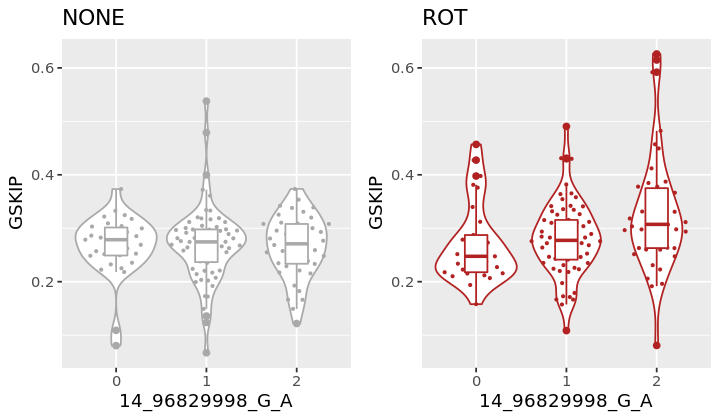

[1] 1.399485 1.143086
[1] "WDR60"


Warning message:
“Removed 8 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 8 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 8 rows containing missing values (position_quasirandom).”

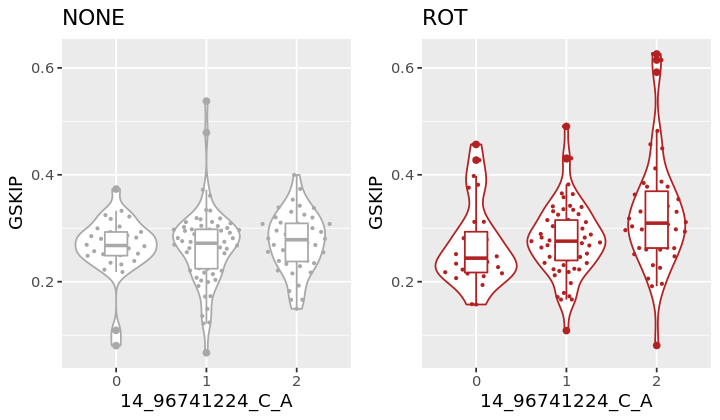

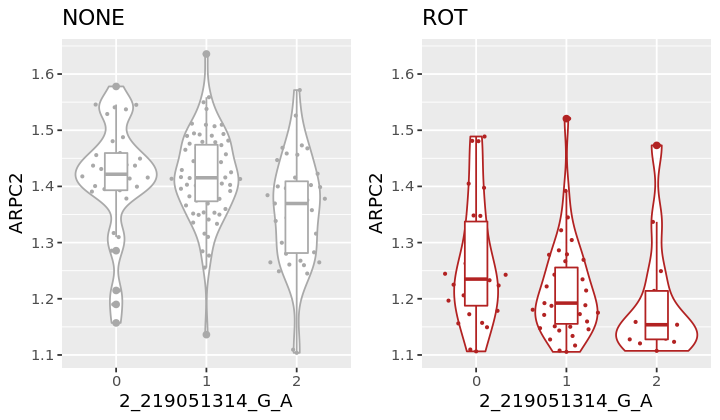

[1] 0.3378719 0.2149943
[1] "TAMM41"


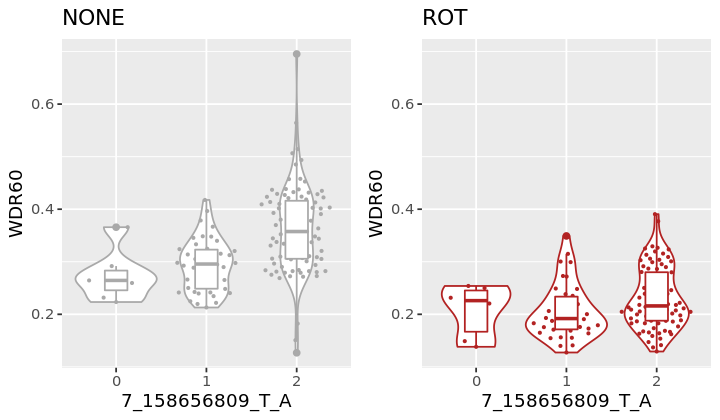

[1] 0.06310690 0.07058131
[1] "C5orf34"


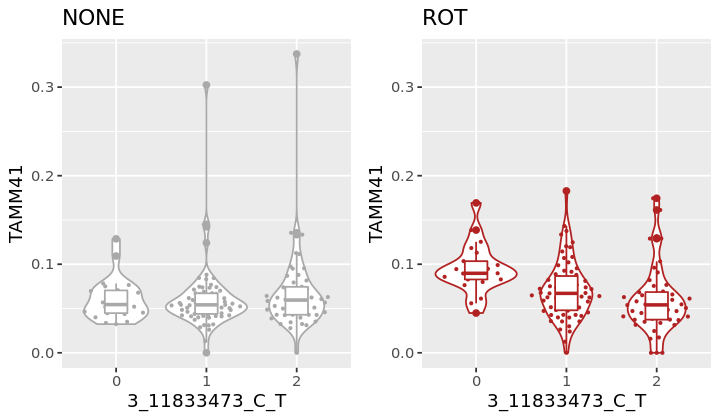

[1] 0.004558561 0.043638849
[1] "C5orf34"


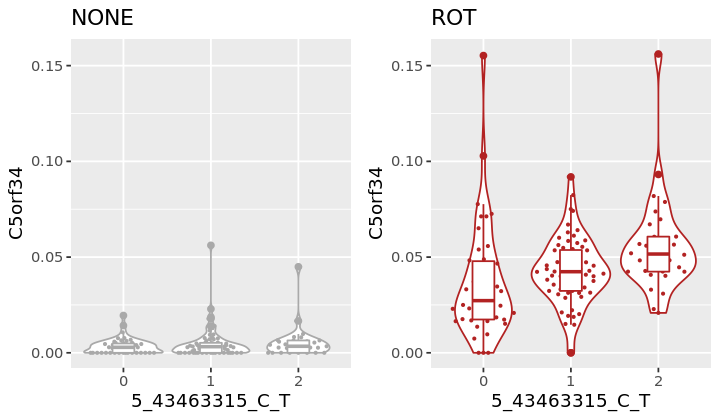

[1] 0.004558561 0.043638849
[1] "NIPAL1"


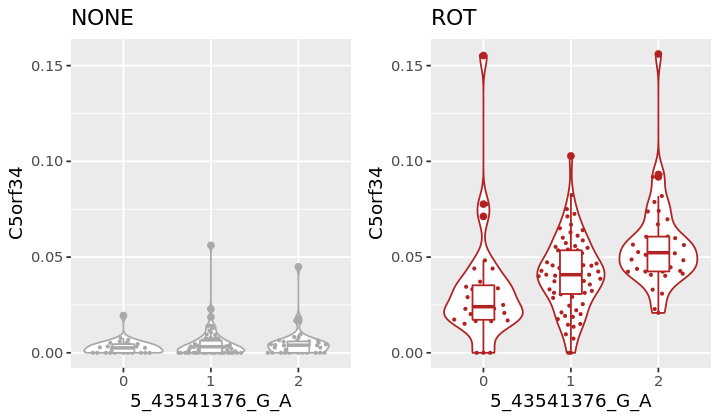

[1] 0.01995992 0.00749157
[1] "DNAJC16"


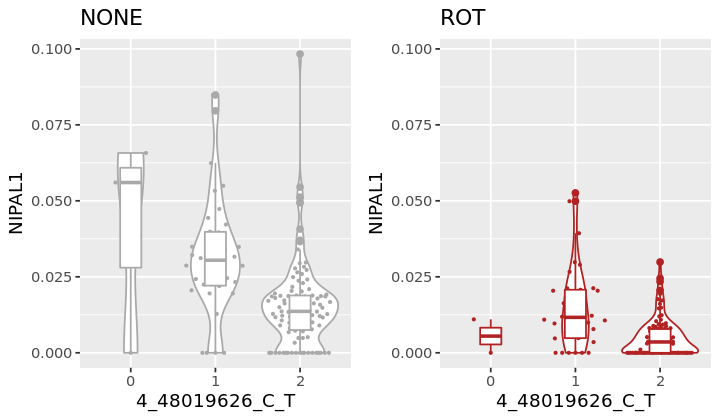

[1] 0.07593141 0.03659942
[1] "DNAJC16"


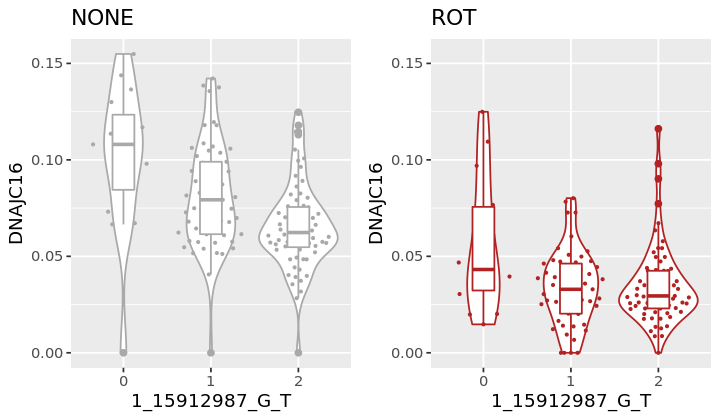

[1] 0.07593141 0.03659942
[1] "DNAJC16"


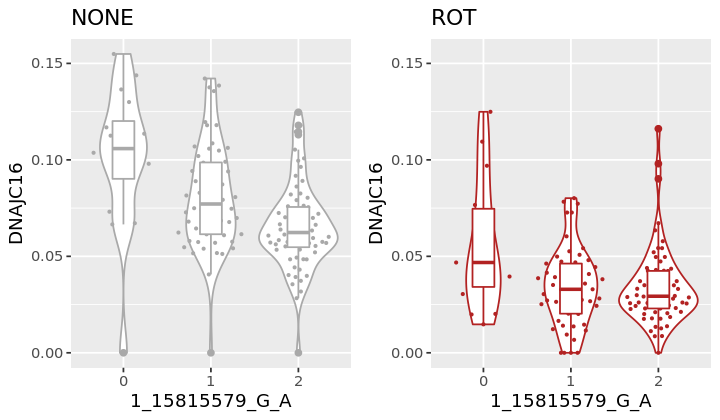

[1] 0.07593141 0.03659942
[1] "DNAJC16"
[1] 0.07593141 0.03659942
[1] "WDR60"


Warning message:
“Removed 8 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 8 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 8 rows containing missing values (position_quasirandom).”

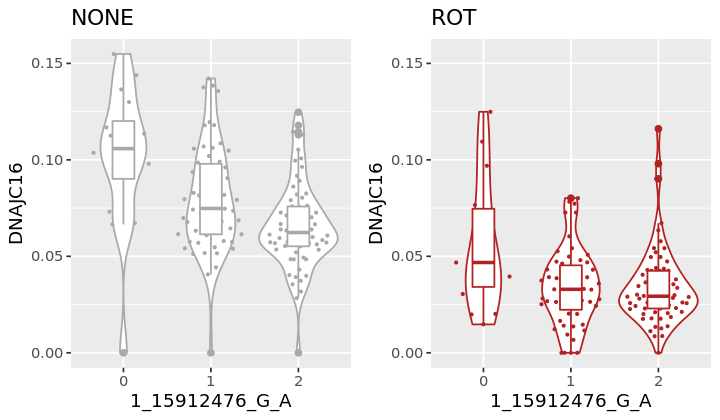

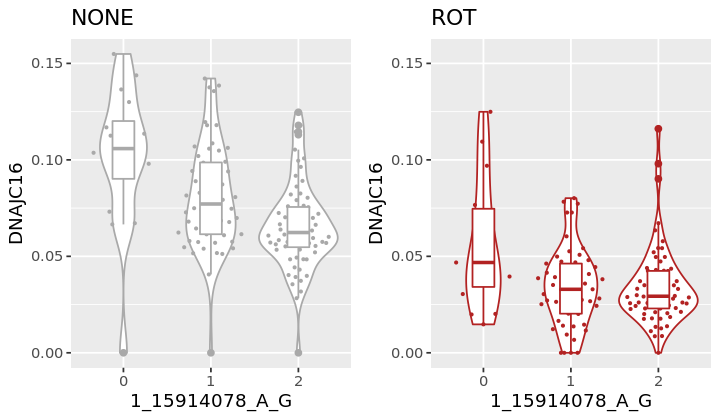

[1] 0.3378719 0.2149943
[1] "HHEX"


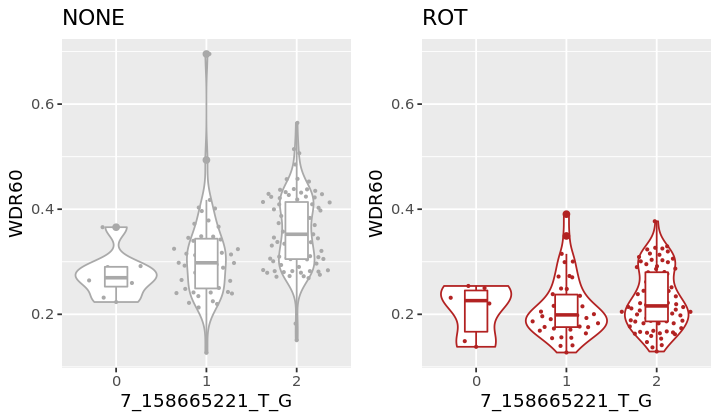

[1] 0.04916591 0.02561751
[1] "FAHD1"


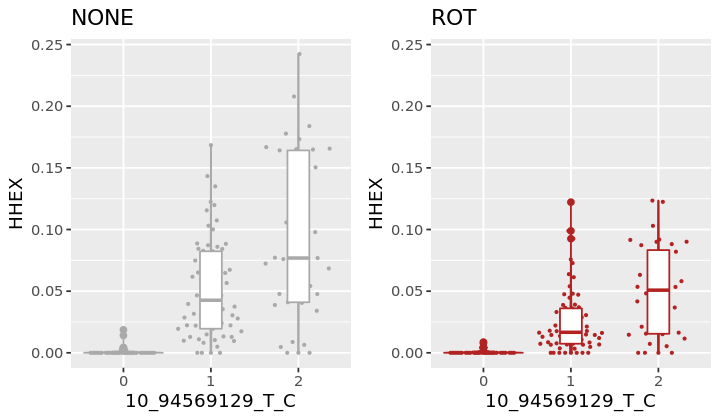

[1] 0.16368169 0.06722987
[1] "MAP3K8"


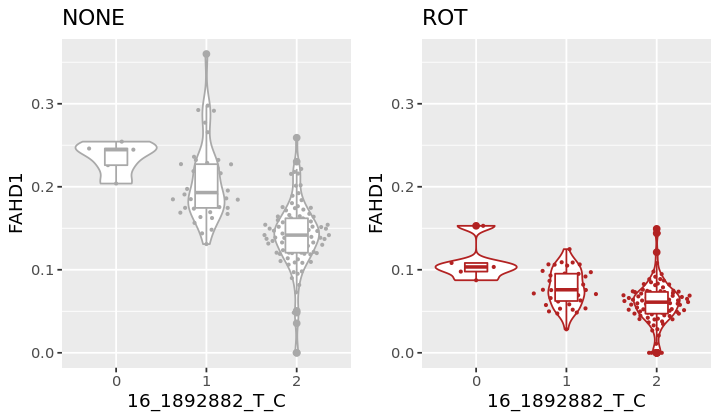

[1] 0.0513082 0.1269314
[1] "APIP"


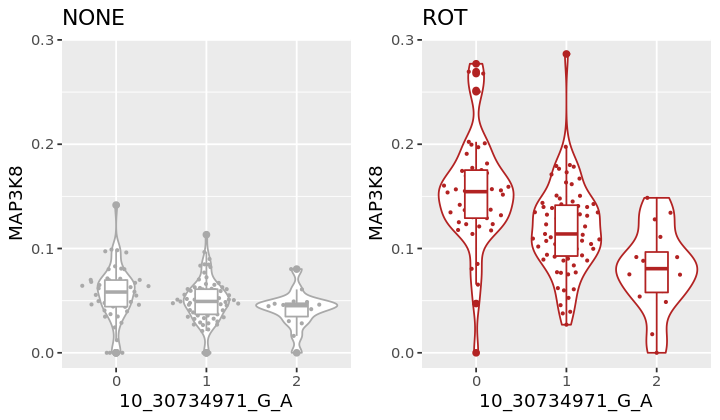

[1] 0.2321799 0.2084563
[1] "PMS1"


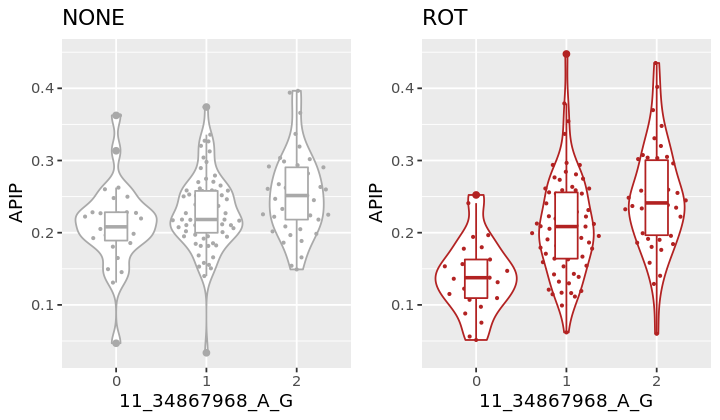

[1] 0.1004150 0.1003512
[1] "TAMM41"


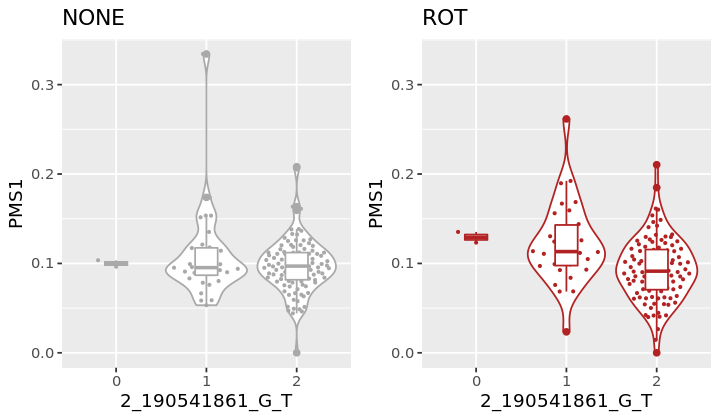

[1] 0.06310690 0.07058131
[1] "FEZ2"


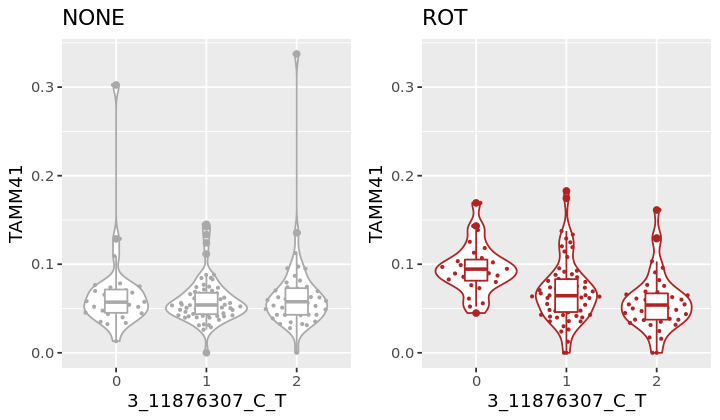

[1] 0.2204836 0.1600431
[1] "SUN1"


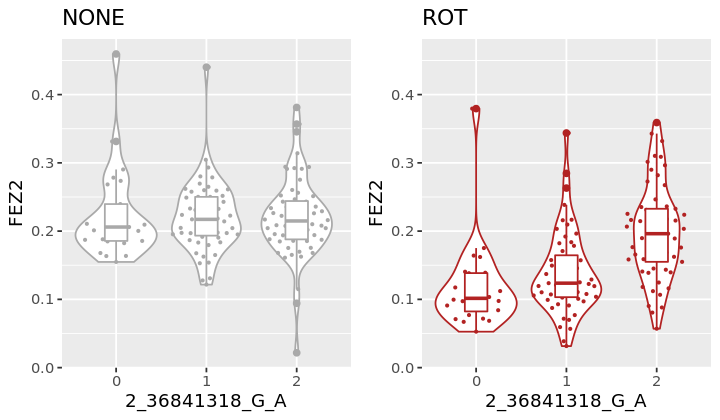

[1] 0.2107086 0.2593133
[1] "SUN1"
[1] 0.2107086 0.2593133
[1] "C17orf89"


Warning message:
“Removed 6 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 6 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 6 rows containing missing values (position_quasirandom).”

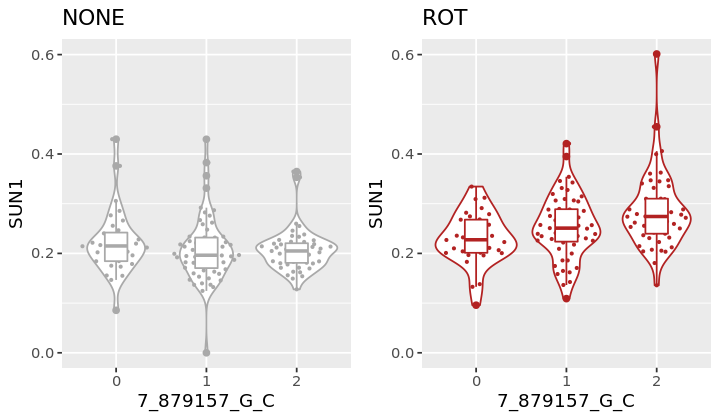

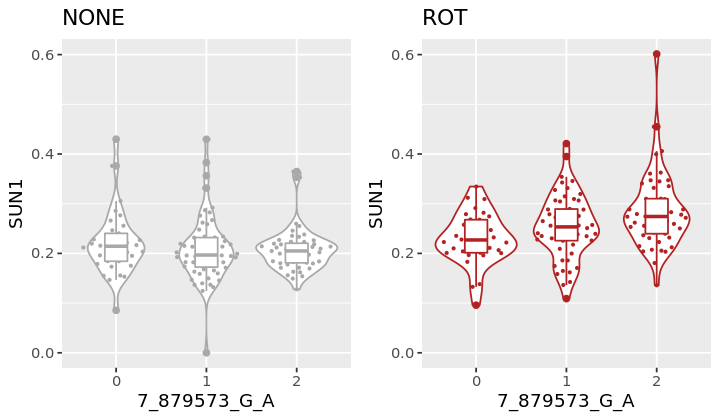

[1] 0.6610688 0.5322442
[1] "THNSL2"


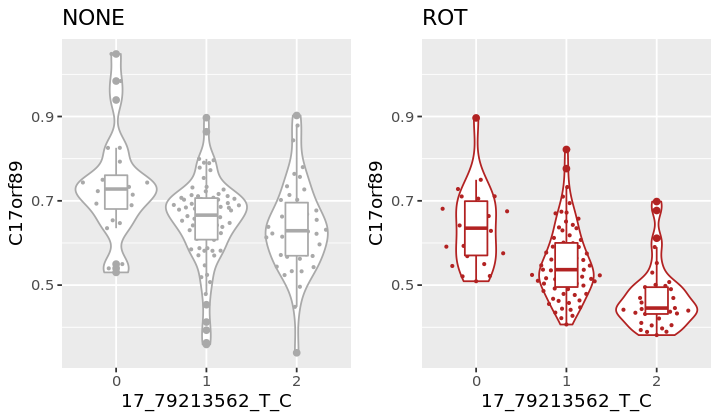

[1] 0.11562449 0.08240604
[1] "THNSL2"


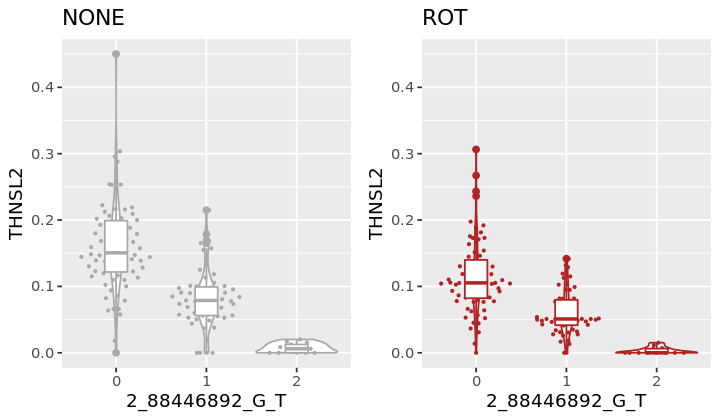

[1] 0.11562449 0.08240604
[1] "PMS1"


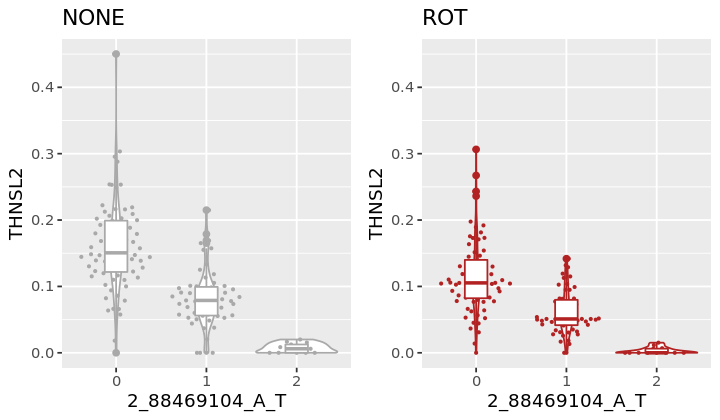

[1] 0.1004150 0.1003512
[1] "VRK3"


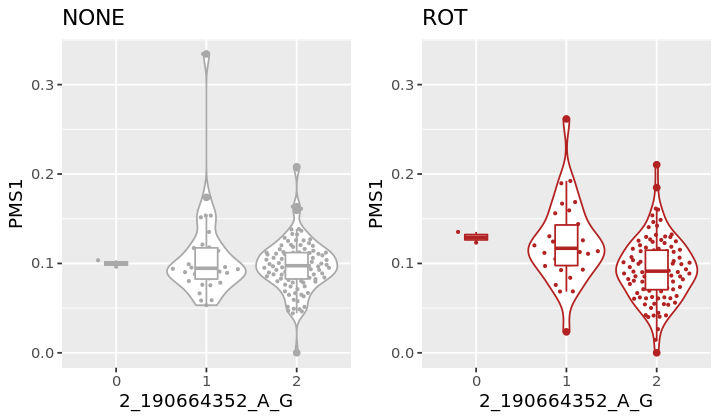

[1] 0.2444846 0.1544875
[1] "VRK3"


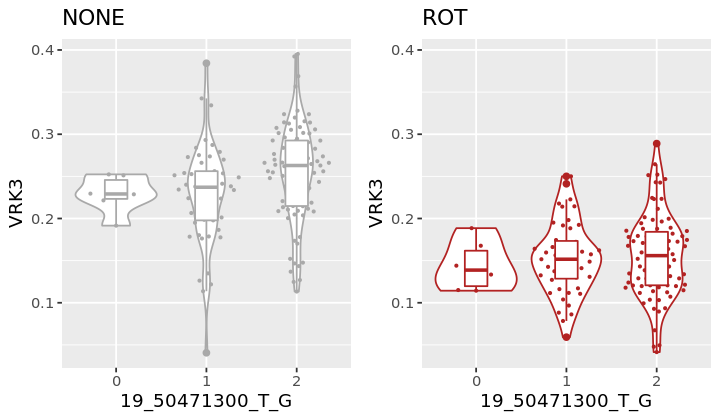

[1] 0.2444846 0.1544875
[1] "APIP"


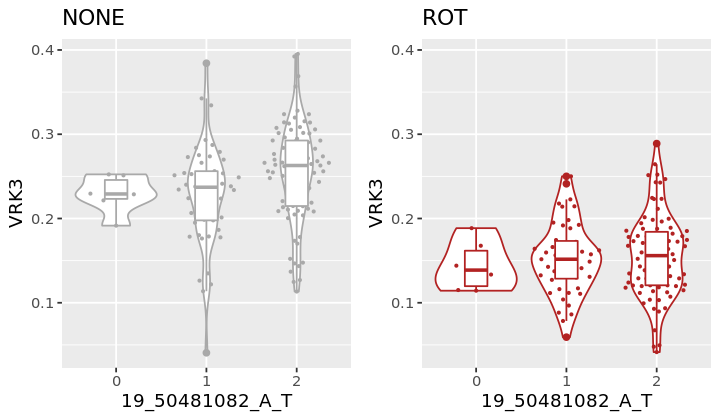

[1] 0.2321799 0.2084563
[1] "TNKS2"
[1] 0.1817069 0.1502947
[1] "CCDC66"


Warning message:
“Removed 5 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 5 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 5 rows containing missing values (position_quasirandom).”

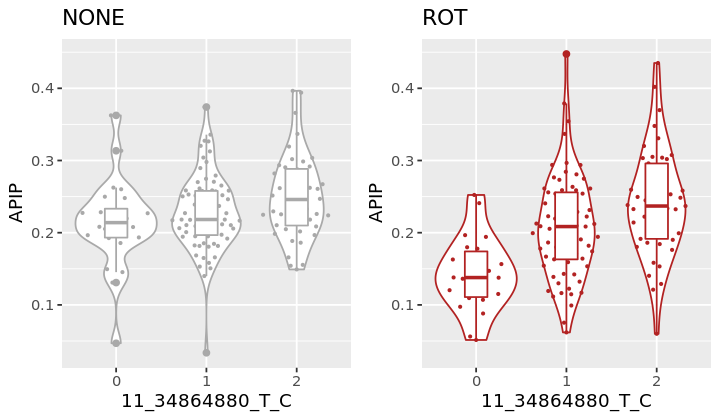

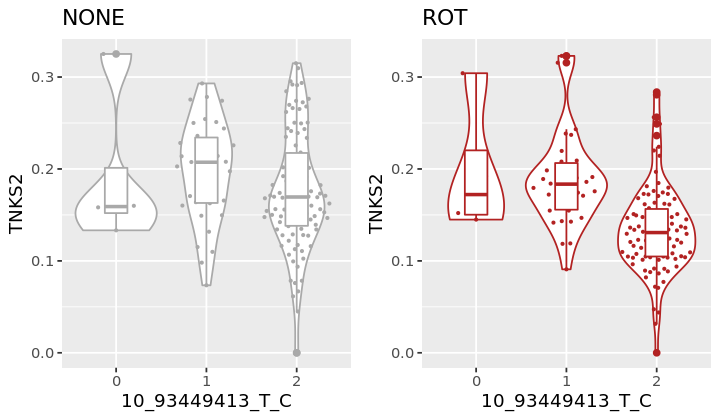

[1] 0.1914828 0.1061843
[1] "STX2"


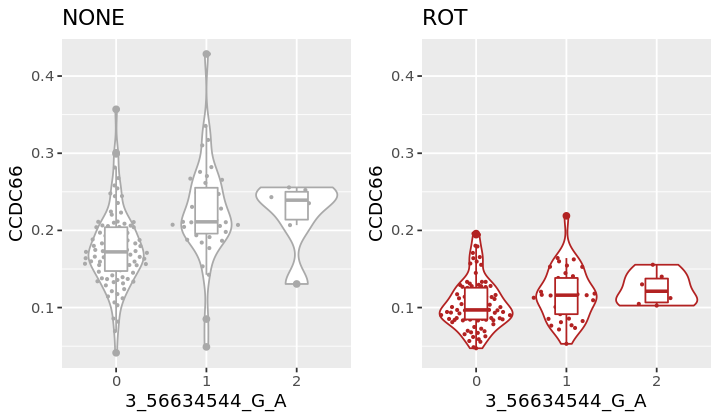

[1] 0.07297628 0.02552992
[1] "STX2"


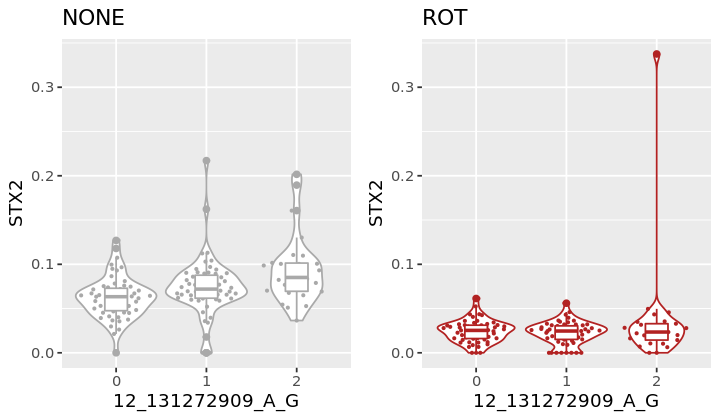

[1] 0.07297628 0.02552992
[1] "POR"


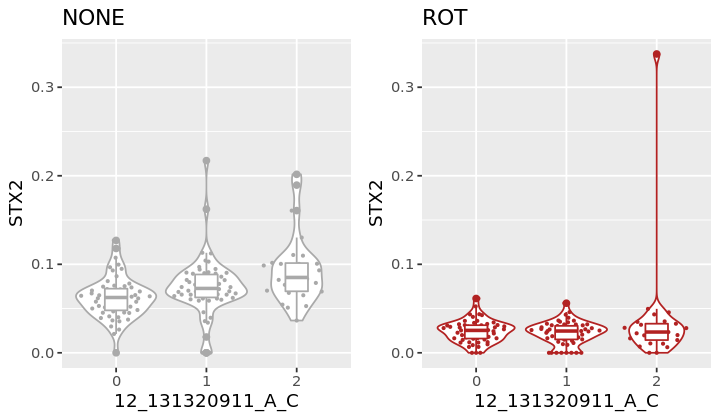

[1] 0.5418337 0.6722126
[1] "SLC22A15"


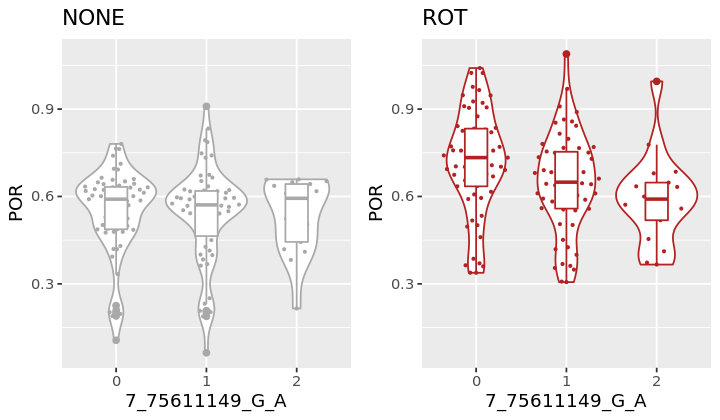

[1] 0.01298984 0.02304905
[1] "PPIE"


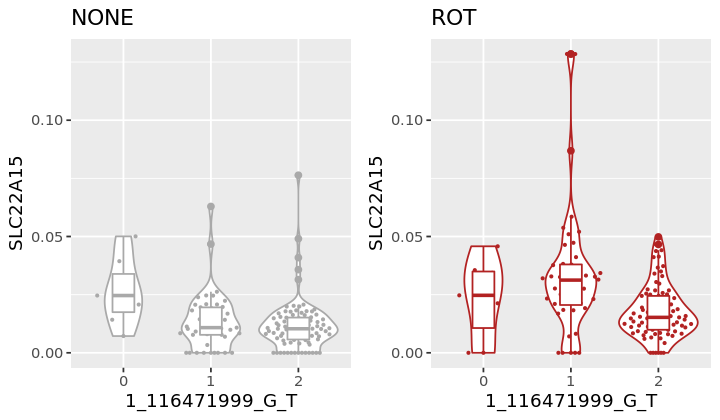

[1] 0.3459132 0.3843705
[1] "PHYH"


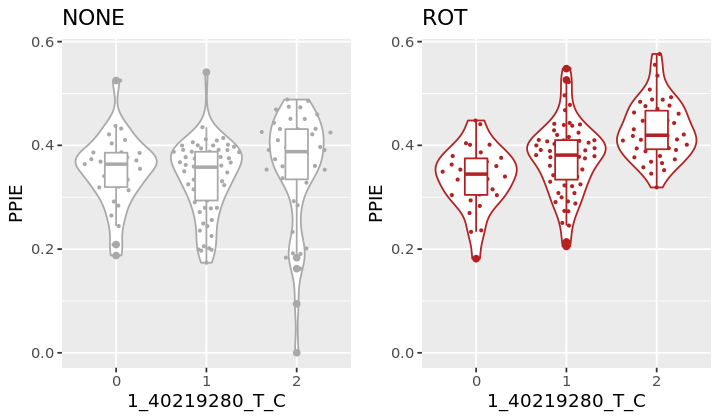

[1] 0.4317273 0.5822606
[1] "TNKS2"


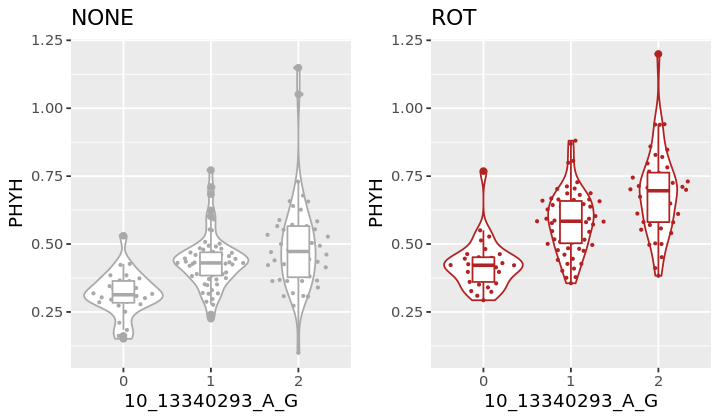

[1] 0.1817069 0.1502947
[1] "TNKS2"


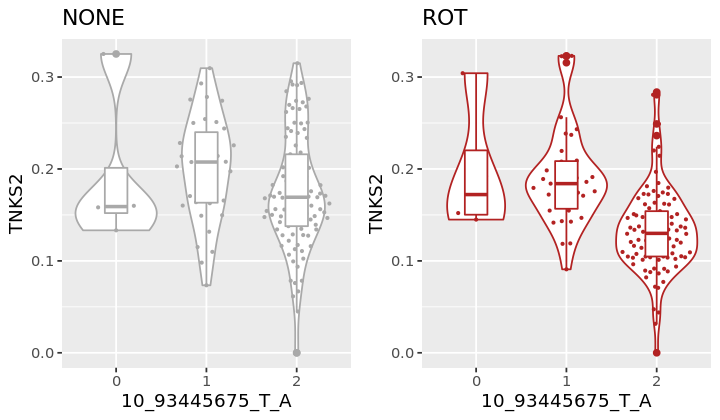

[1] 0.1817069 0.1502947
[1] "RMI2"


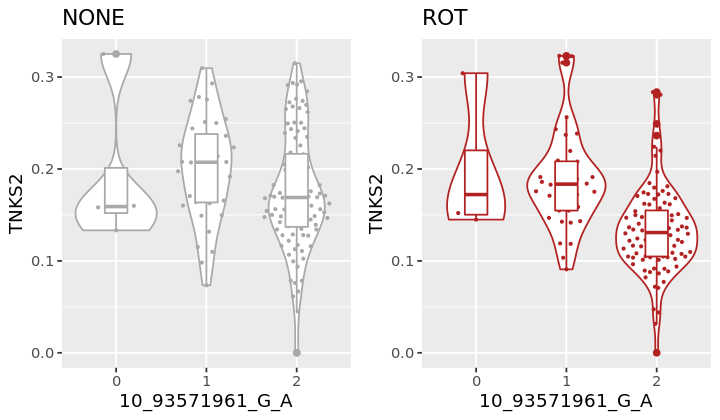

[1] 0.04168986 0.01844611
[1] "RMI2"


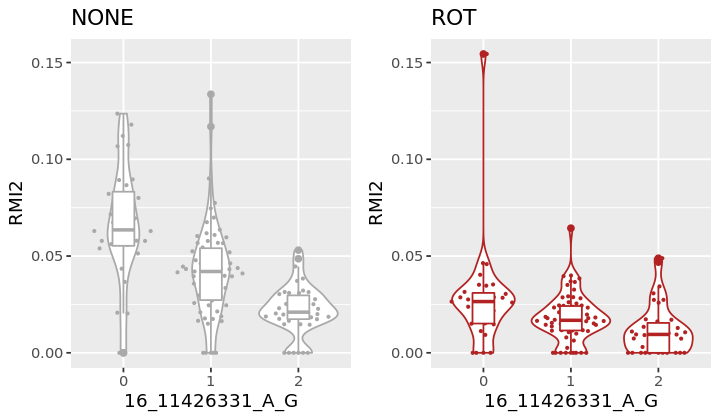

[1] 0.04168986 0.01844611
[1] "PMS1"


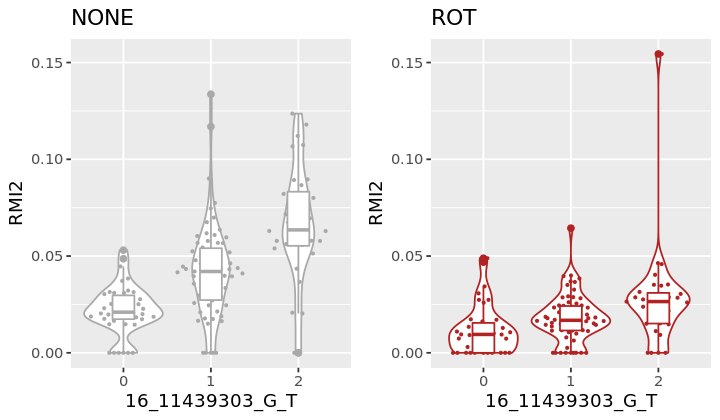

[1] 0.1004150 0.1003512
[1] "PMS1"


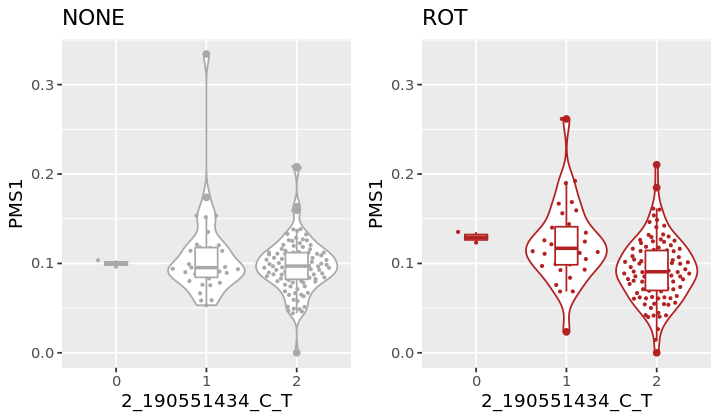

[1] 0.1004150 0.1003512
[1] "PMS1"


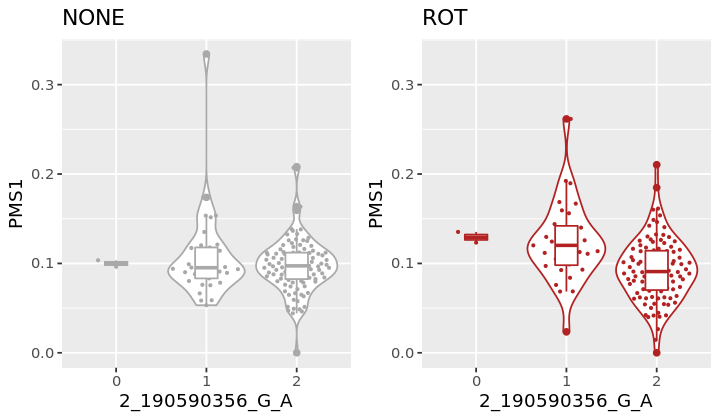

[1] 0.1004150 0.1003512
[1] "PPIE"


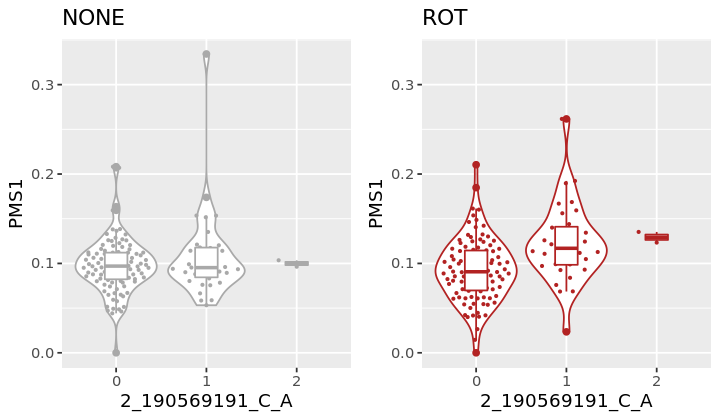

[1] 0.3459132 0.3843705
[1] "SQSTM1"
[1] 0.7215254 0.6971222
[1] "ARPC2"


Warning message:
“Removed 57 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 57 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 57 rows containing missing values (position_quasirandom).”

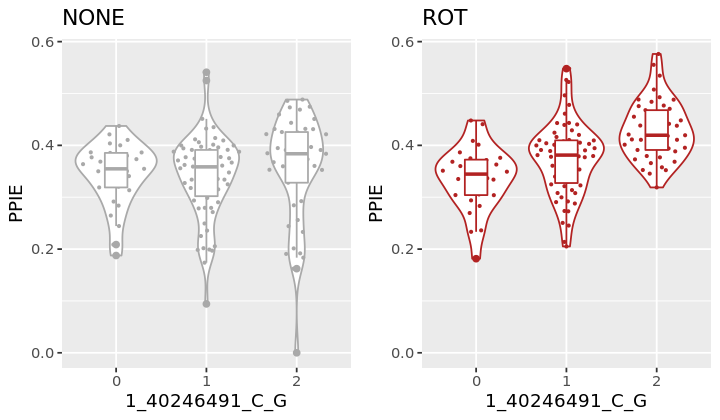

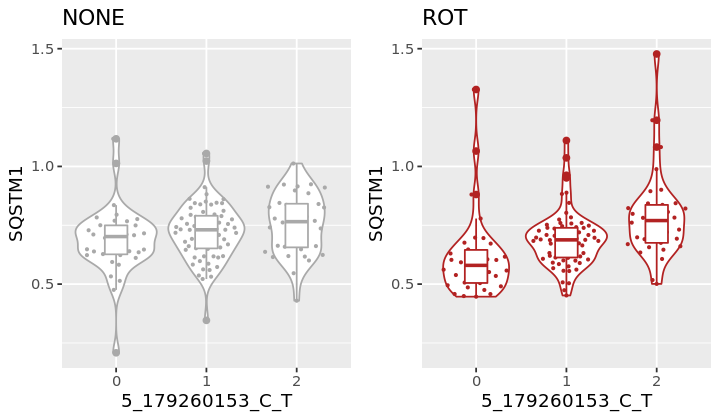

[1] 1.399485 1.143086
[1] "FEZ2"


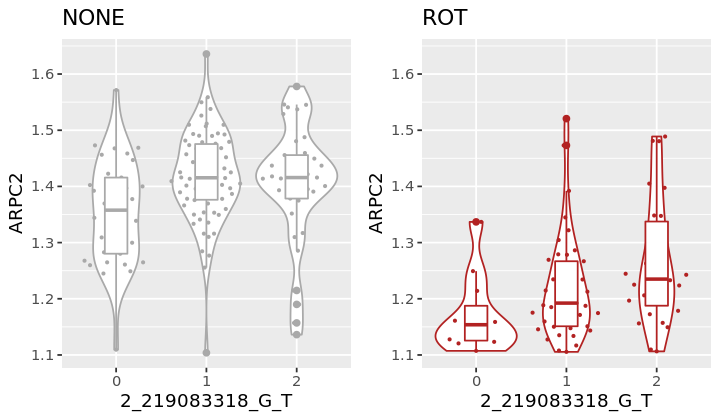

[1] 0.2204836 0.1600431
[1] "PHYH"


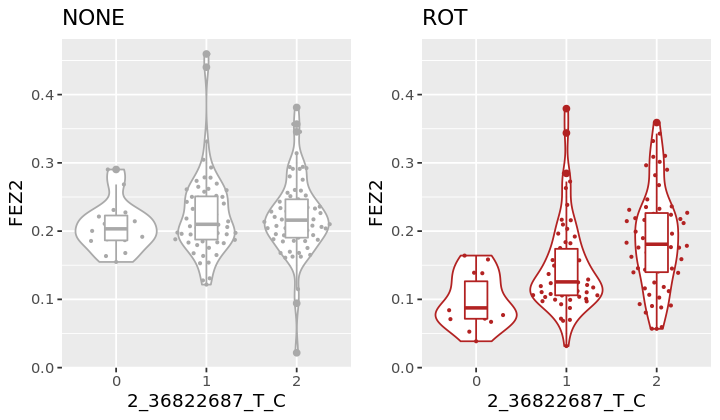

[1] 0.4317273 0.5822606
[1] "C21orf119"


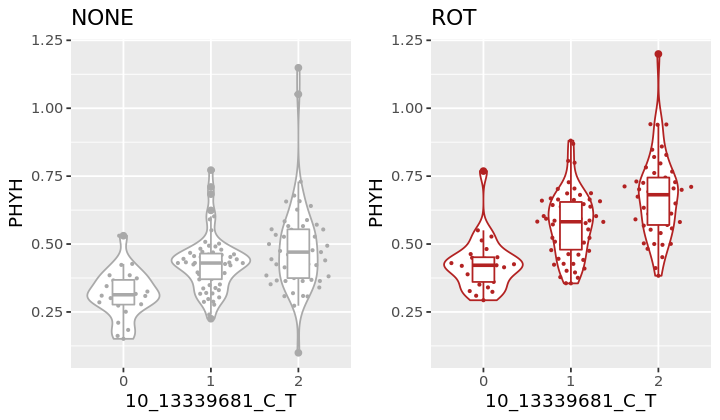

[1] 0.07885970 0.09383458
[1] "MGRN1"


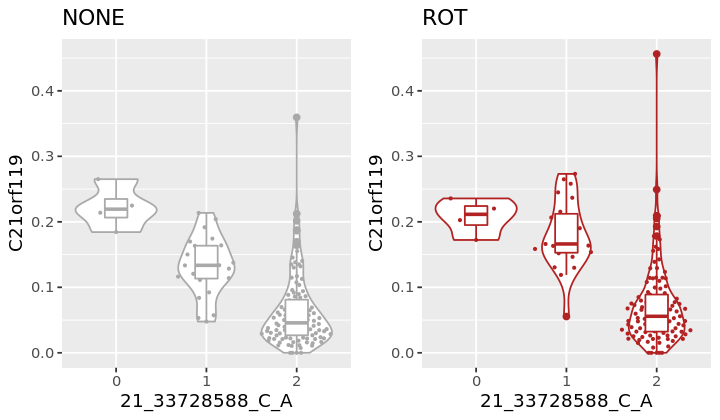

[1] 0.1058403 0.0873094
[1] "SMC2"


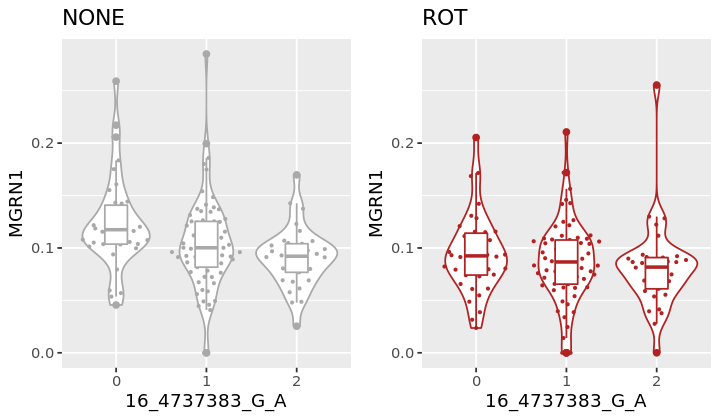

[1] 0.1440887 0.1234225
[1] "ZFR2"


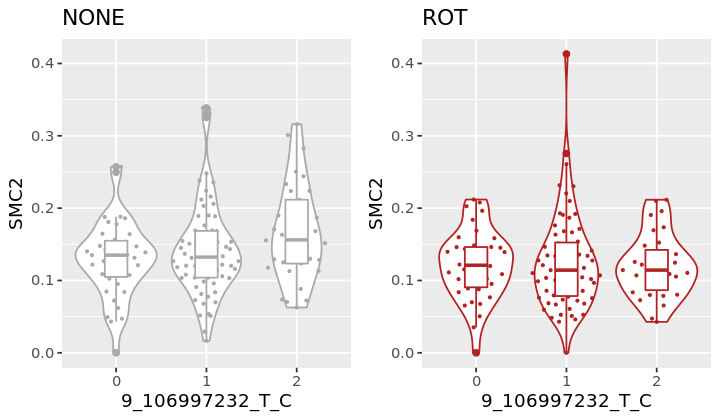

[1] 0.14164586 0.06493985
[1] "RMI2"


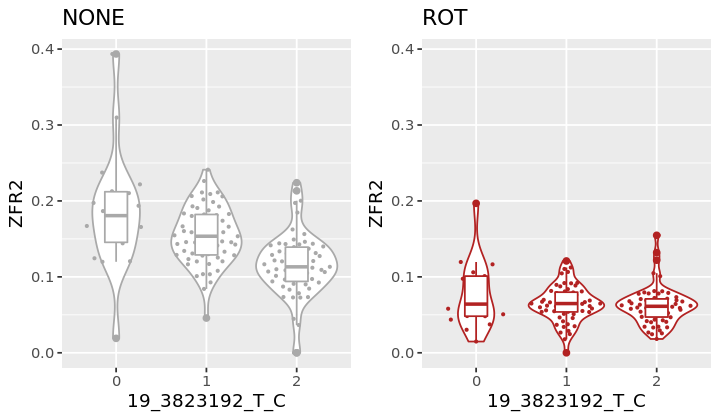

[1] 0.04168986 0.01844611
[1] "CA8"


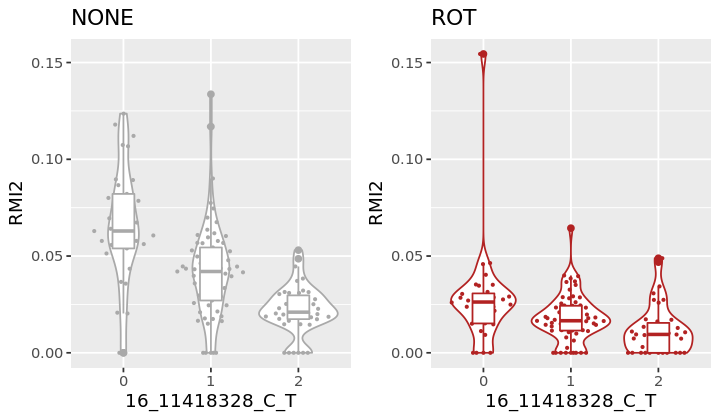

[1] 0.09418114 0.04629303
[1] "GSKIP"


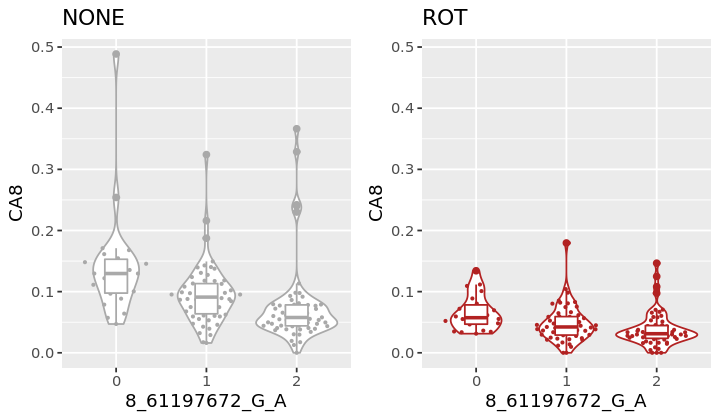

[1] 0.2679299 0.2930983
[1] "HSPB8"


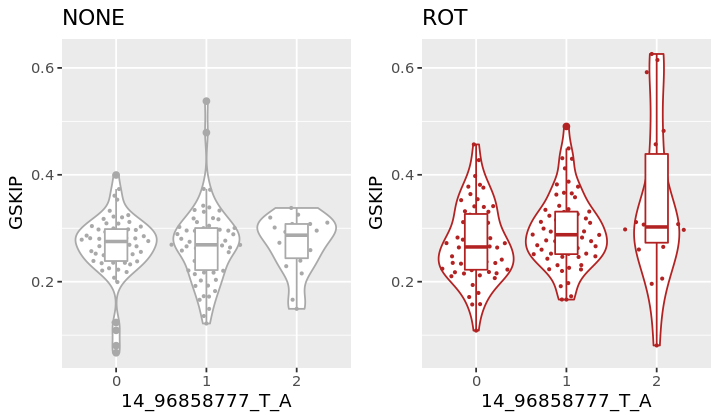

[1] 0.1124022 0.2756566
[1] "ZFR2"


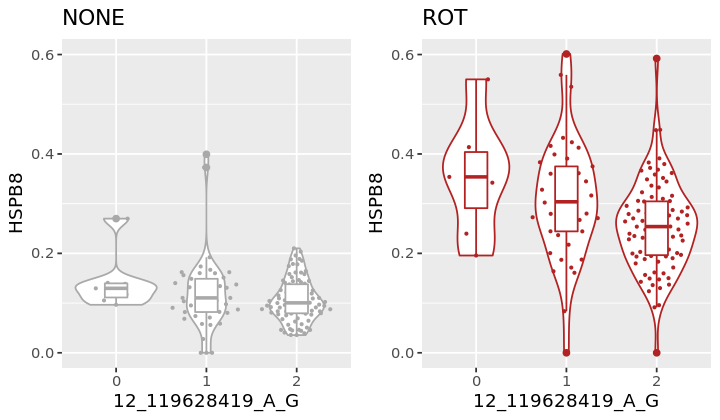

[1] 0.14164586 0.06493985
[1] "STX2"


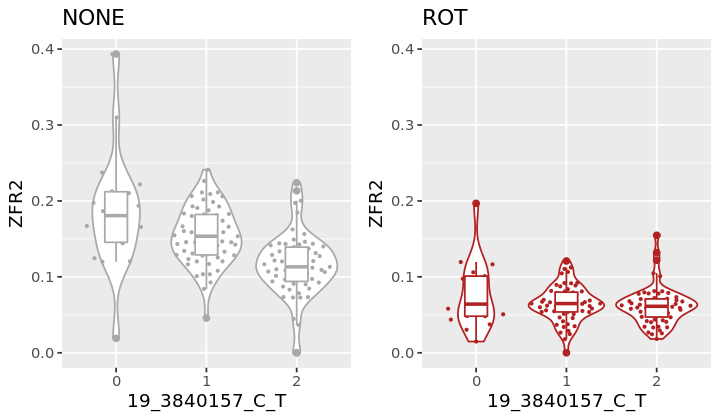

[1] 0.07297628 0.02552992
[1] "SLC22A15"


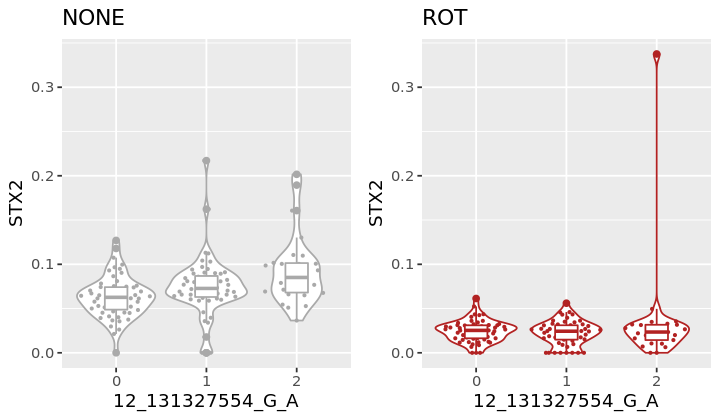

[1] 0.01298984 0.02304905
[1] "CA8"
[1] 0.09418114 0.04629303
[1] "CECR1"


Warning message:
“Removed 4 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 4 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 4 rows containing missing values (position_quasirandom).”

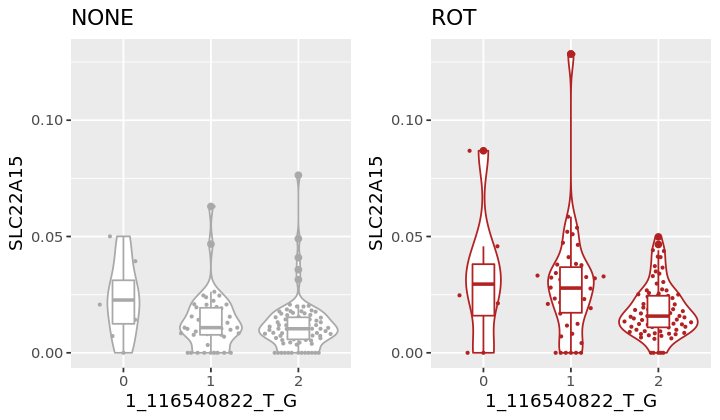

[1] 0.2288475 0.2429566
[1] "CECR1"


Warning message:
“Removed 4 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 4 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 4 rows containing missing values (position_quasirandom).”

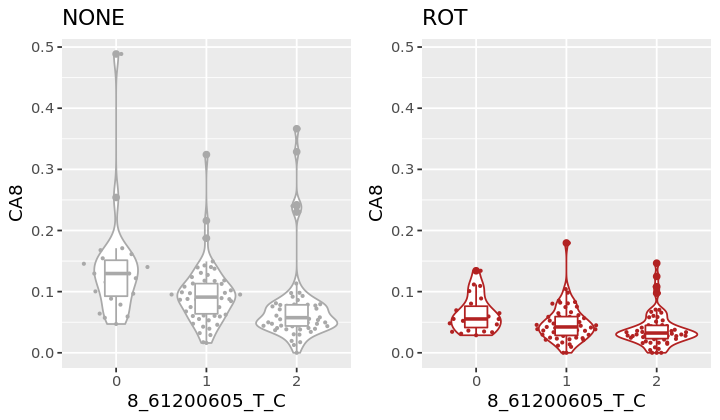

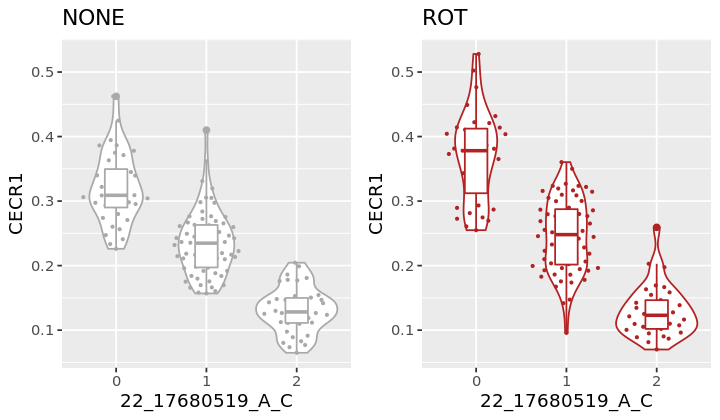

[1] 0.2288475 0.2429566
[1] "CA8"


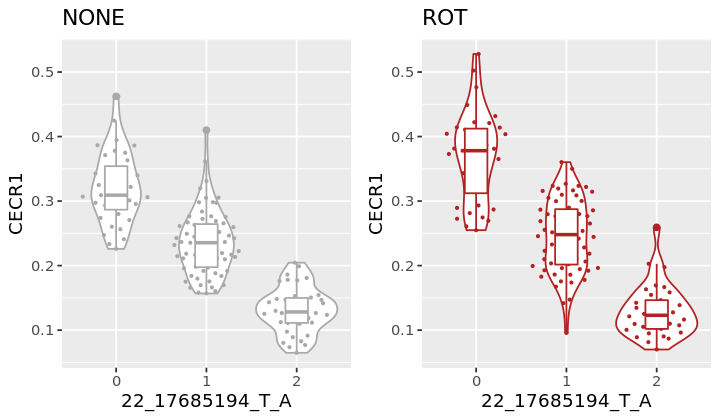

[1] 0.09418114 0.04629303
[1] "THNSL2"


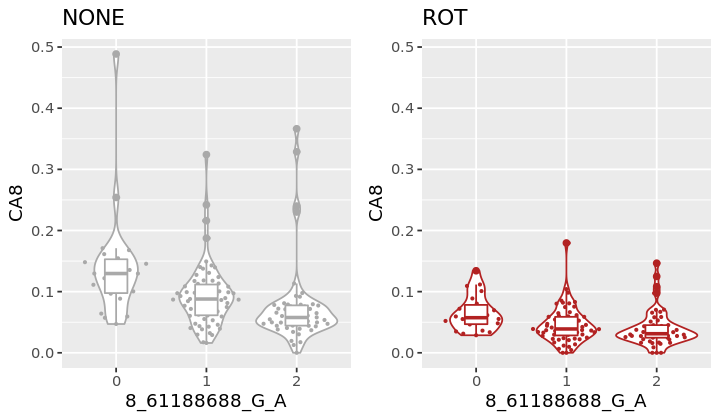

[1] 0.11562449 0.08240604
[1] "NBPF3"


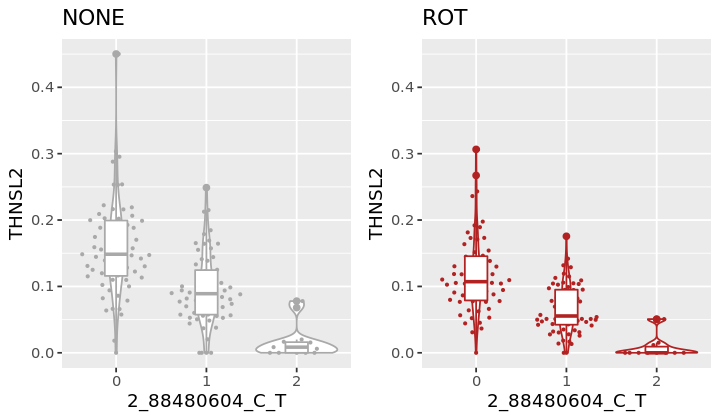

[1] 0.017087194 0.009261458
[1] "CAPG"


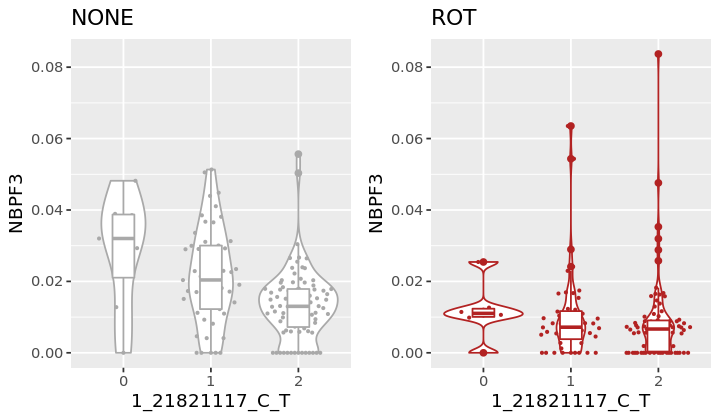

[1] 0.08710369 0.16071179
[1] "CAPG"


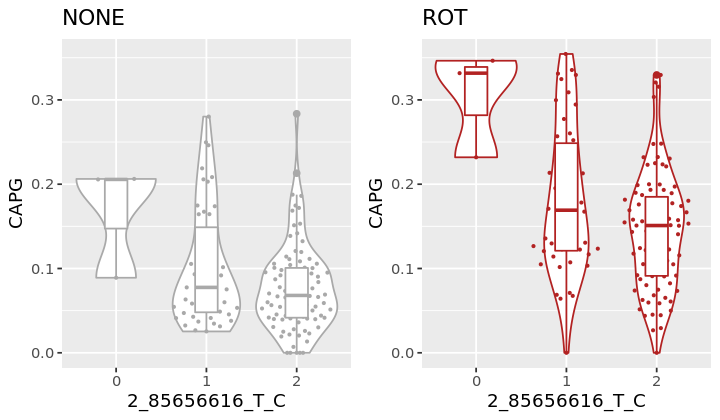

[1] 0.08710369 0.16071179
[1] "C21orf119"


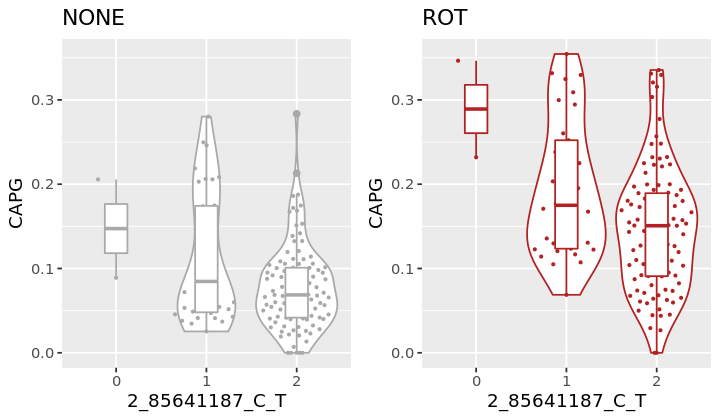

[1] 0.07885970 0.09383458
[1] "ASNS"


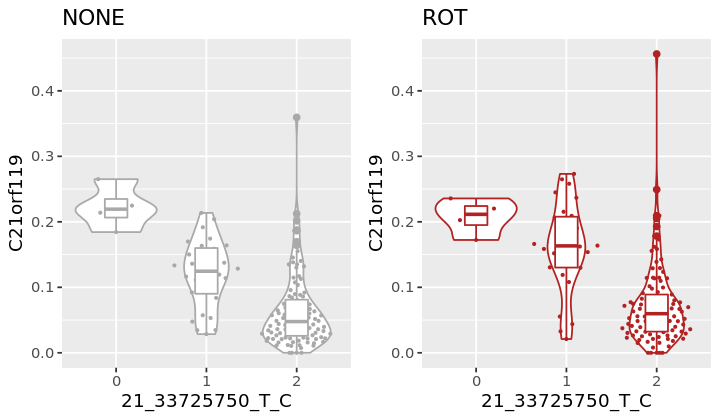

[1] 0.3947230 0.5906694
[1] "REEP3"


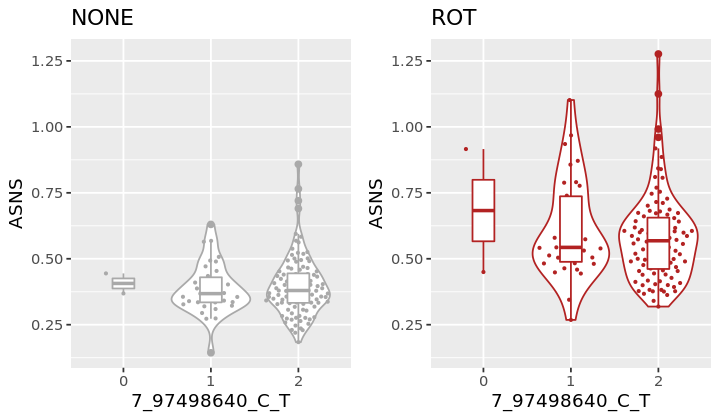

[1] 0.3581995 0.2948326
[1] "TMEM97"


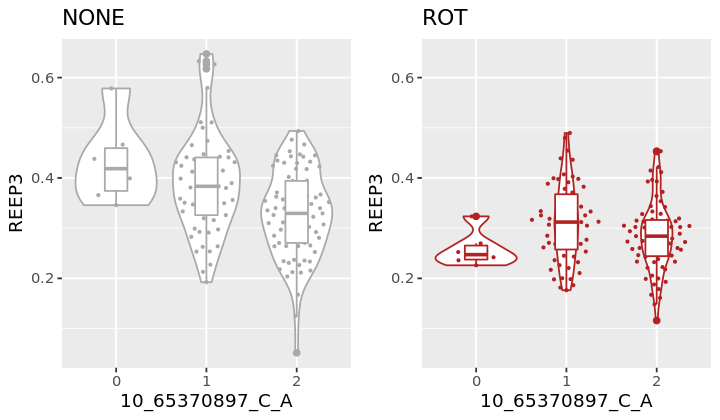

[1] 0.2019207 0.2742642
[1] "ZFR2"
[1] 0.14164586 0.06493985
[1] "SHISA5"


Warning message:
“Removed 2 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 2 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 2 rows containing missing values (position_quasirandom).”

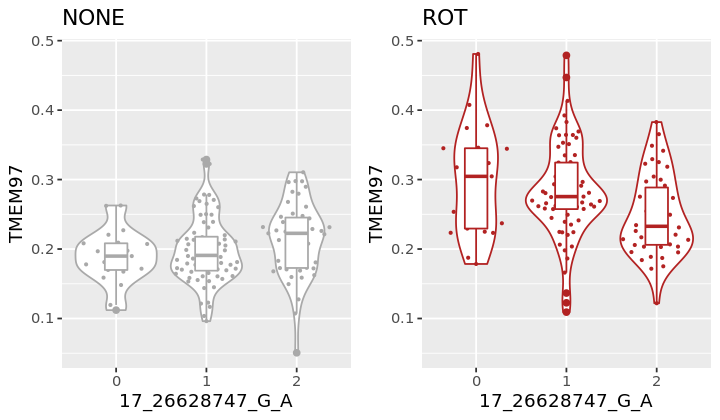

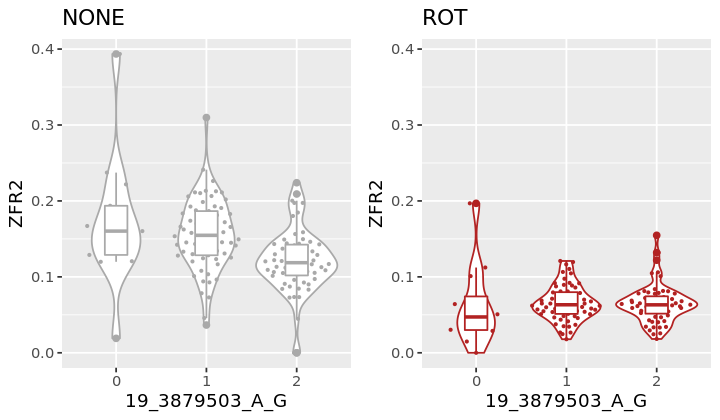

[1] 0.6450508 0.6400210
[1] "C11orf54"


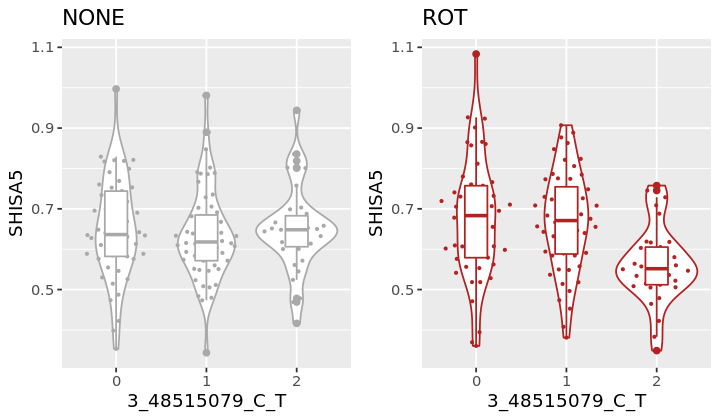

[1] 0.10750404 0.06790319
[1] "NIPAL1"


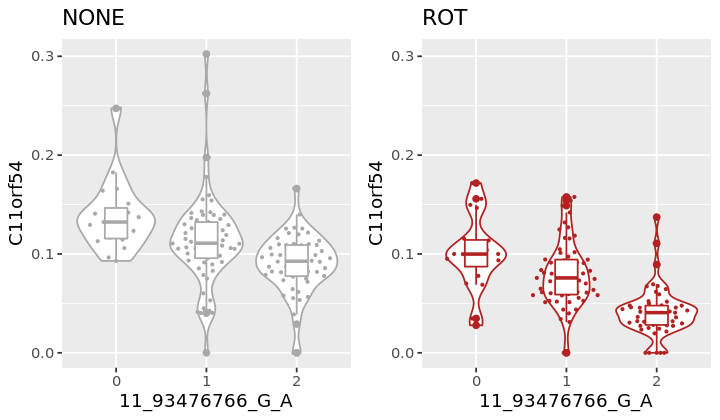

[1] 0.01995992 0.00749157
[1] "TMEM159"
[1] 0.1329468 0.2292640
[1] "LEPROT"


Warning message:
“Removed 6 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 6 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 6 rows containing missing values (position_quasirandom).”

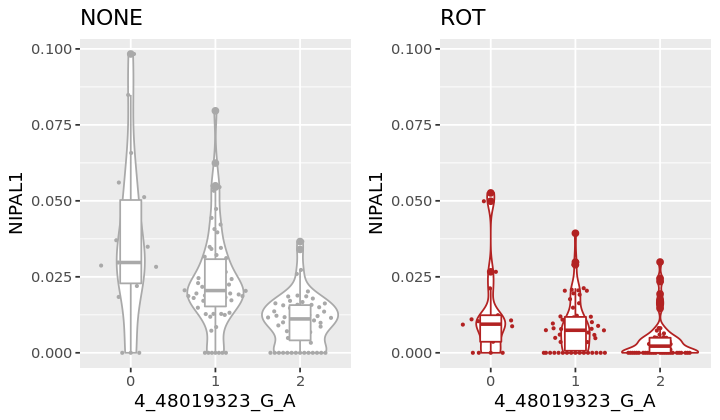

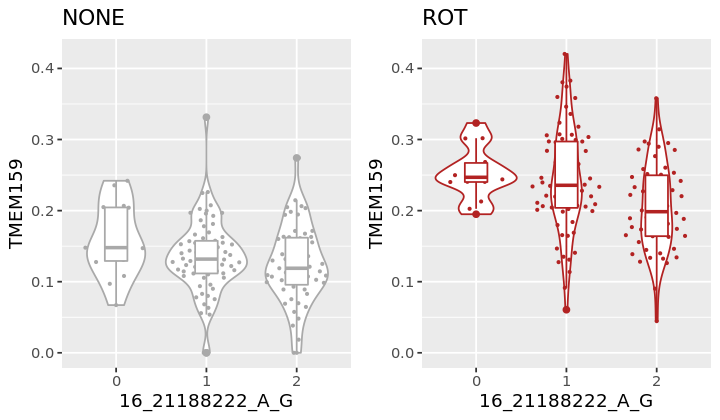

[1] 0.7152772 0.5379324
[1] "HSPB8"
[1] 0.1124022 0.2756566
[1] "RBM23"


Warning message:
“Removed 2 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 2 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 2 rows containing missing values (position_quasirandom).”

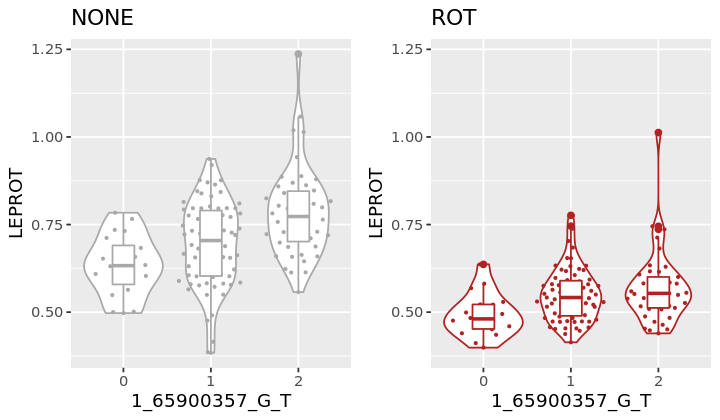

[1] 0.3073602 0.2090265
[1] "MPHOSPH6"


Warning message:
“Removed 39 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 39 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 39 rows containing missing values (position_quasirandom).”

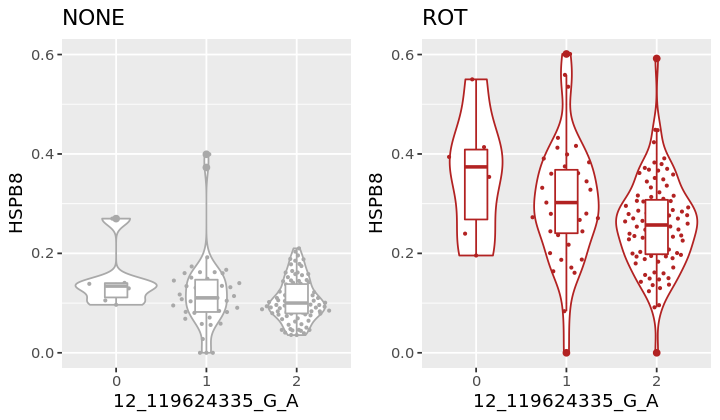

[1] 0.2442251 0.1254642
[1] "CCDC88A"


Warning message:
“Removed 5 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 5 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 5 rows containing missing values (position_quasirandom).”

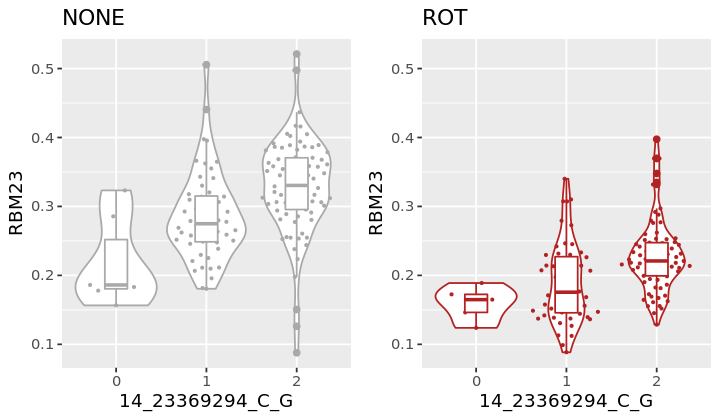

[1] 0.3188808 0.2139364
[1] "CCDC88A"


Warning message:
“Removed 5 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 5 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 5 rows containing missing values (position_quasirandom).”

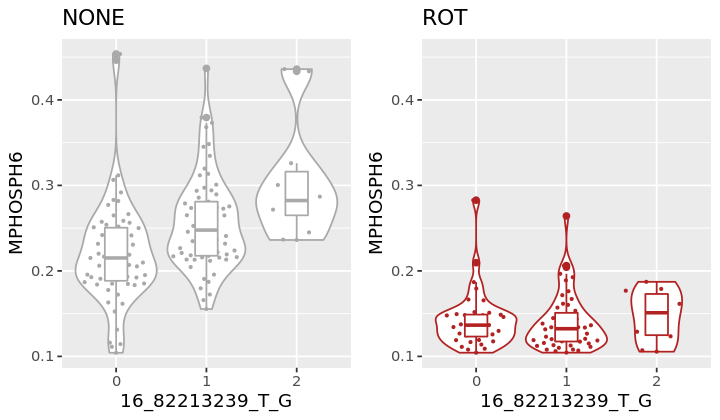

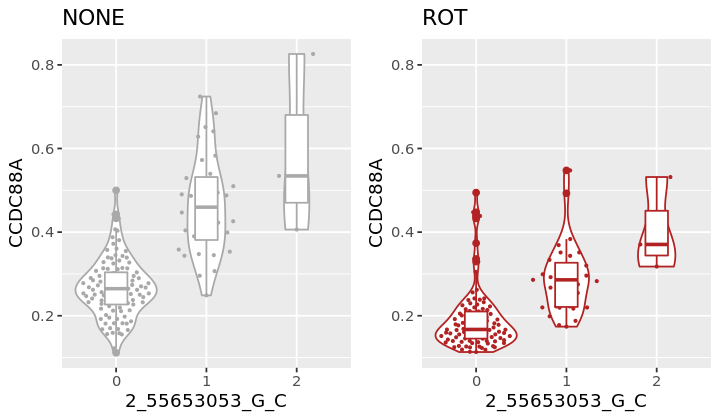

[1] 0.3188808 0.2139364
[1] "SQSTM1"
[1] 0.7215254 0.6971222
[1] "PDCD5"


Warning message:
“Removed 72 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 72 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 72 rows containing missing values (position_quasirandom).”

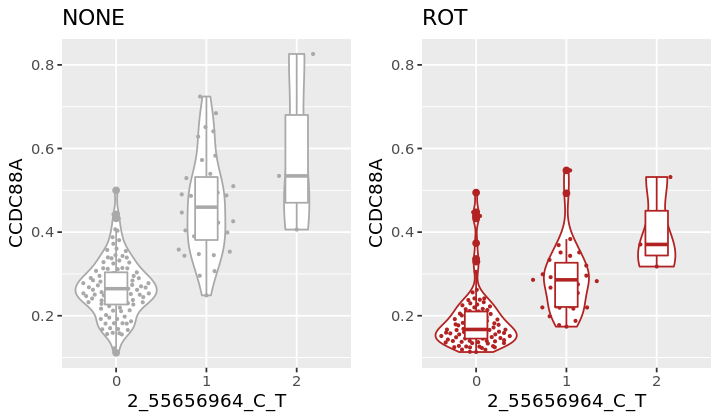

[1] 0.7560725 0.4592406
[1] "RGS3"


Warning message:
“Removed 1 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 1 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 1 rows containing missing values (position_quasirandom).”

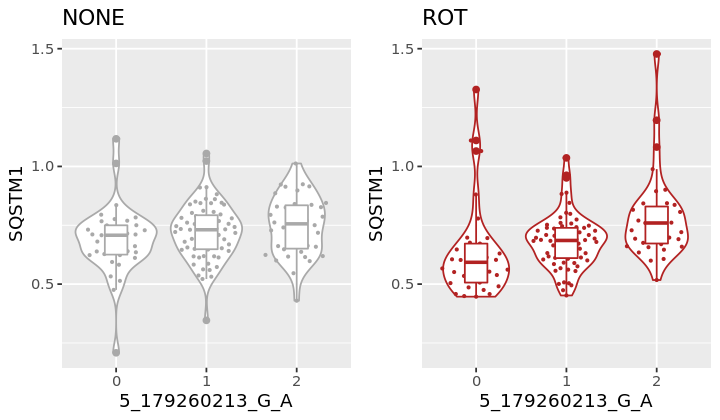

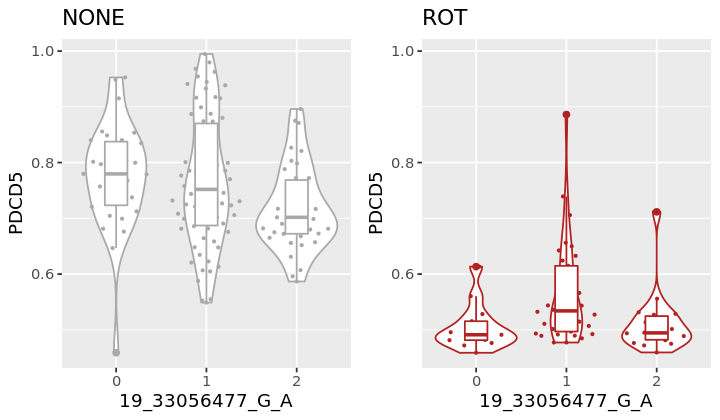

[1] 0.2003100 0.3585368
[1] "MGRN1"
[1] 0.1058403 0.0873094
[1] "RPL10A"


Warning message:
“Removed 1 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 1 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 1 rows containing missing values (position_quasirandom).”

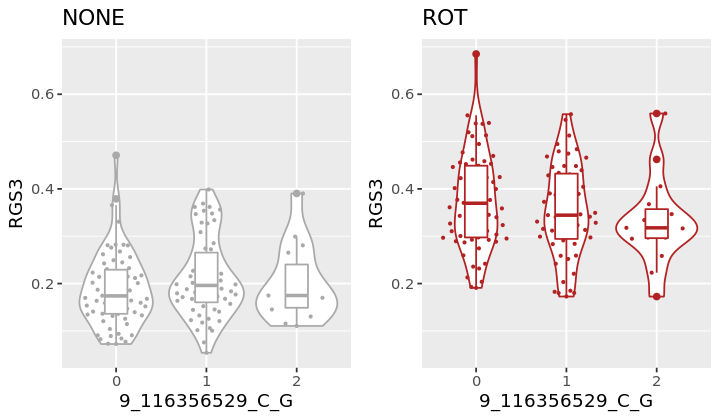

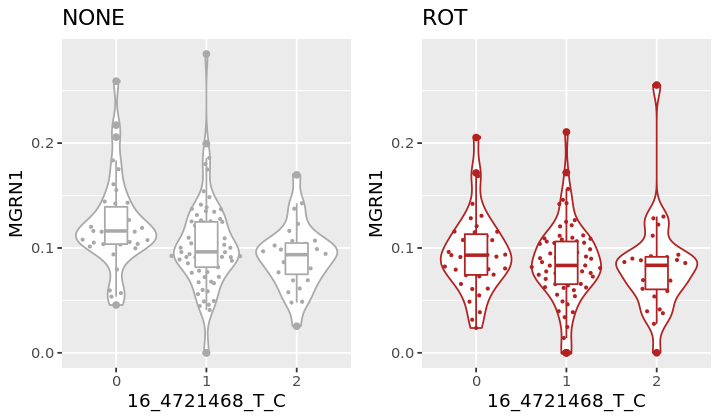

[1] 2.529713 2.512218
[1] "NBPF3"


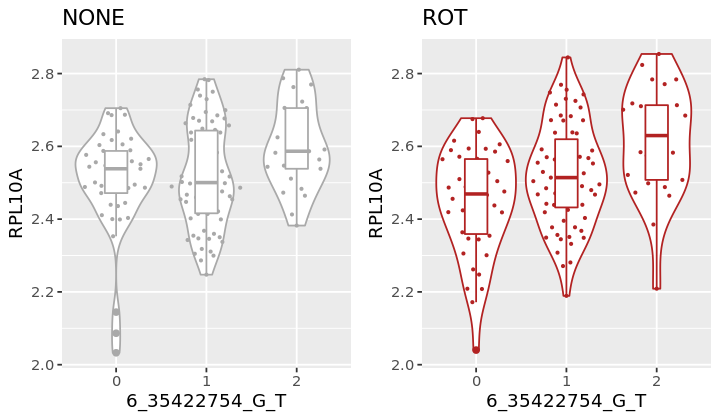

[1] 0.017087194 0.009261458
[1] "C11orf54"
[1] 0.10750404 0.06790319
[1] "ARPC2"


Warning message:
“Removed 57 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 57 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 57 rows containing missing values (position_quasirandom).”

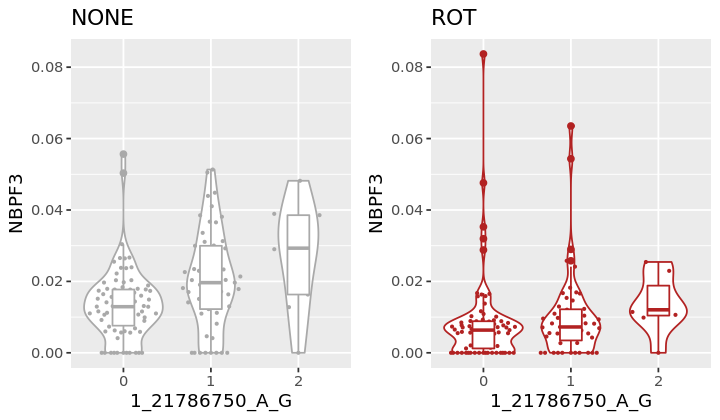

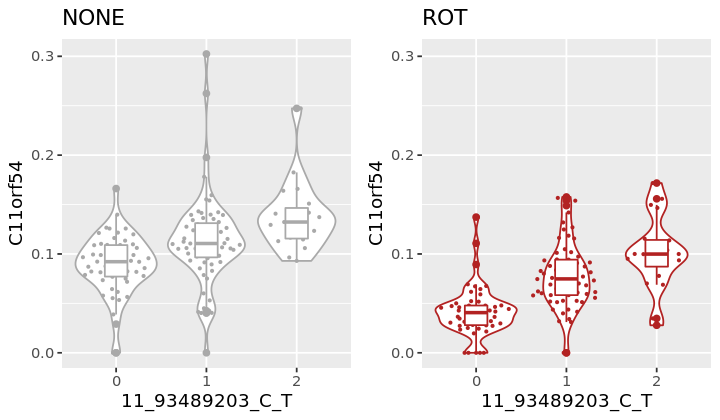

[1] 1.399485 1.143086
[1] "MAP3K8"
[1] 0.0513082 0.1269314
[1] "LEPROT"


Warning message:
“Removed 6 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 6 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 6 rows containing missing values (position_quasirandom).”

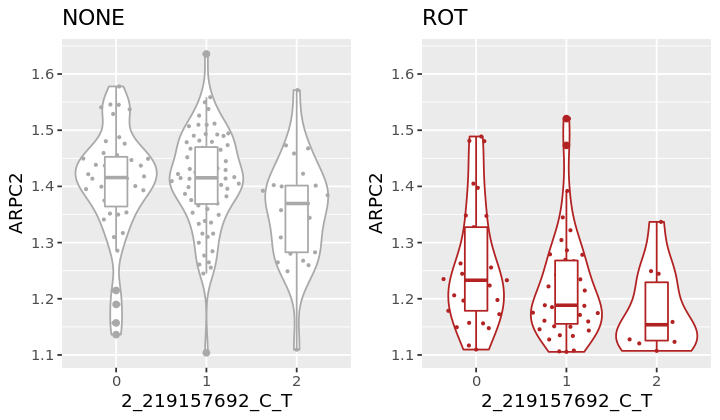

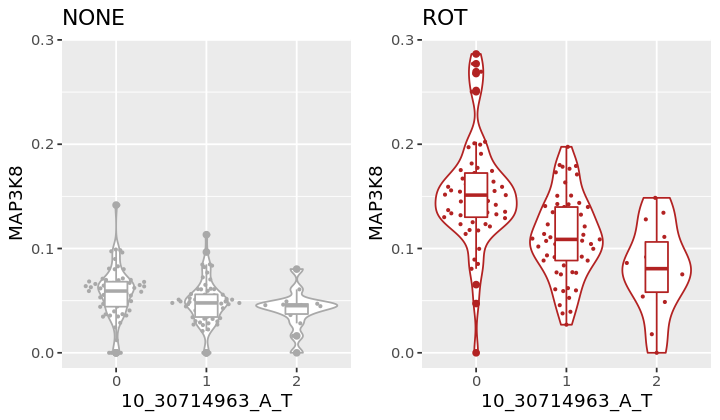

[1] 0.7152772 0.5379324
[1] "SMYD3"


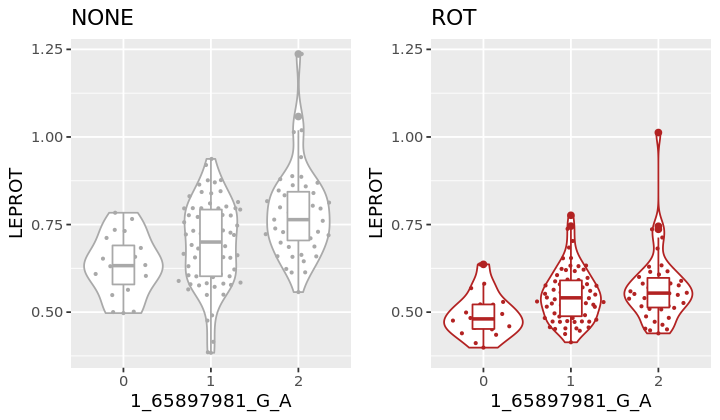

[1] 0.4490619 0.3469027
[1] "C11orf54"


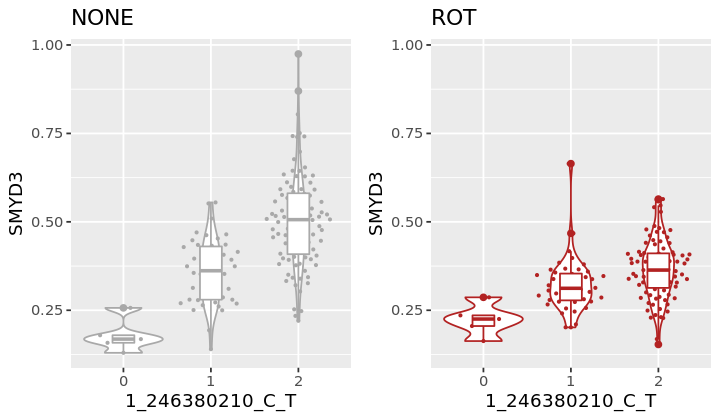

[1] 0.10750404 0.06790319
[1] "PIK3R3"


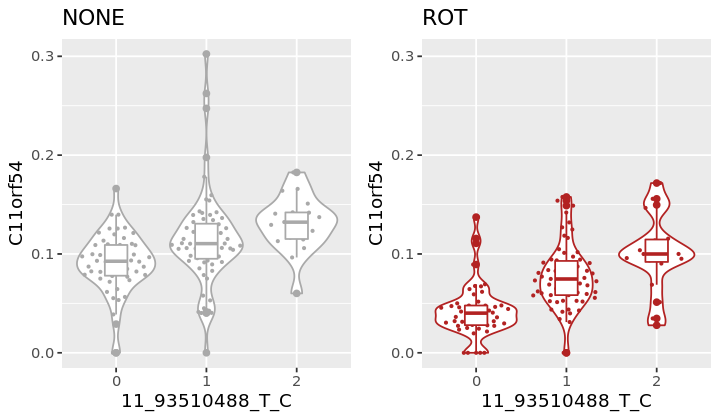

[1] 0.19369025 0.07268841
[1] "SMYD3"


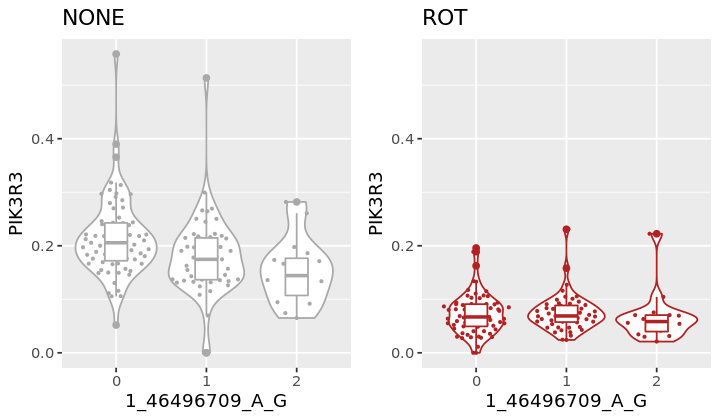

[1] 0.4490619 0.3469027
[1] "C11orf54"


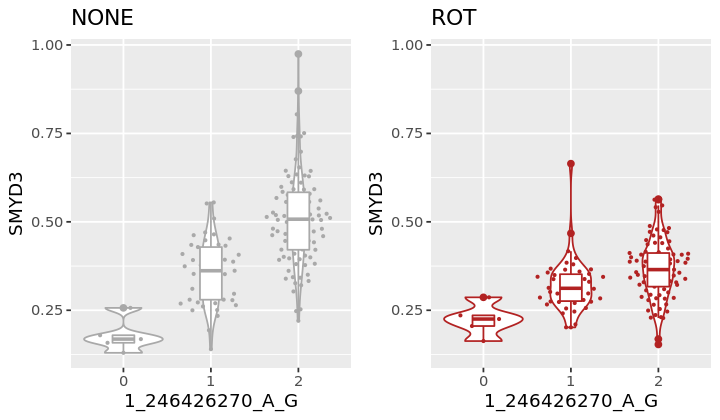

[1] 0.10750404 0.06790319
[1] "C11orf54"
[1] 0.10750404 0.06790319
[1] "RPL10A"


Warning message:
“Removed 1 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 1 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 1 rows containing missing values (position_quasirandom).”

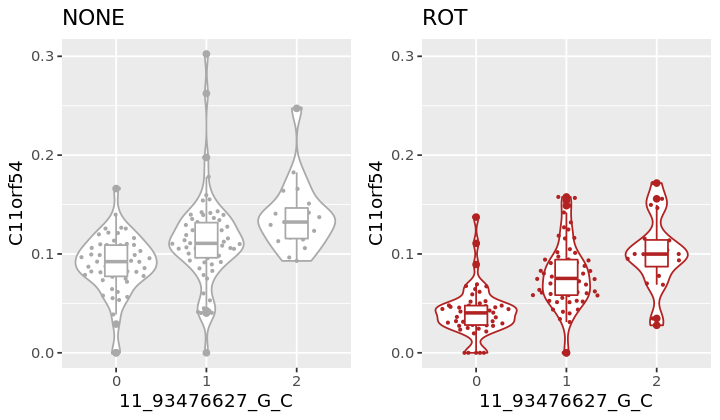

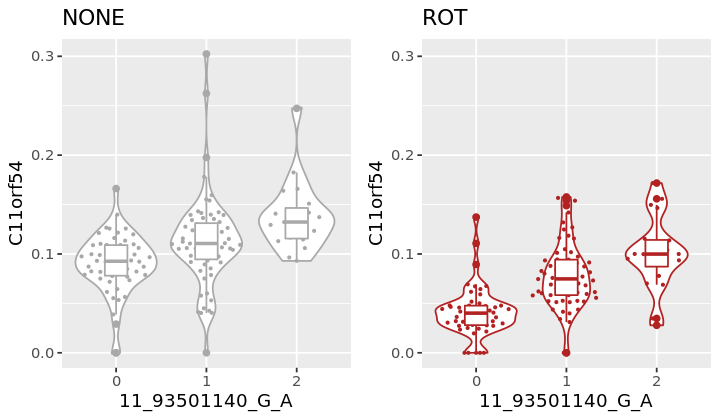

[1] 2.529713 2.512218
[1] "RMI2"


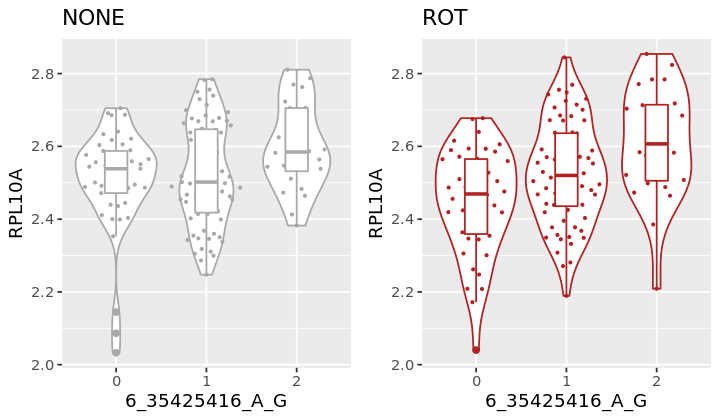

[1] 0.04168986 0.01844611
[1] "SLC22A15"
[1] 0.01298984 0.02304905
[1] "NME1"


Warning message:
“Removed 1 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 1 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 1 rows containing missing values (position_quasirandom).”

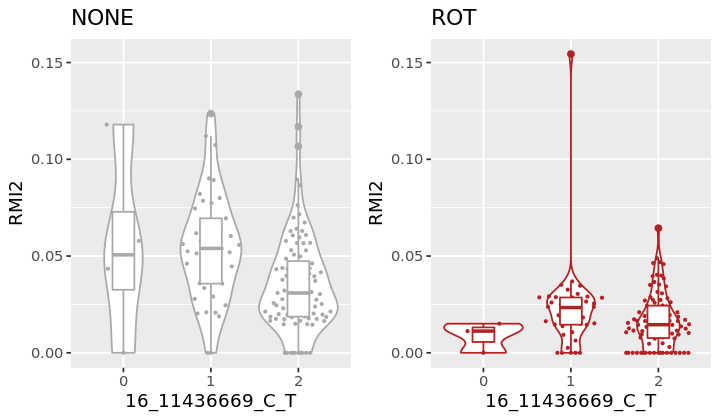

[1] 0.6597507 0.6734153
[1] "NME1"


Warning message:
“Removed 1 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 1 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 1 rows containing missing values (position_quasirandom).”

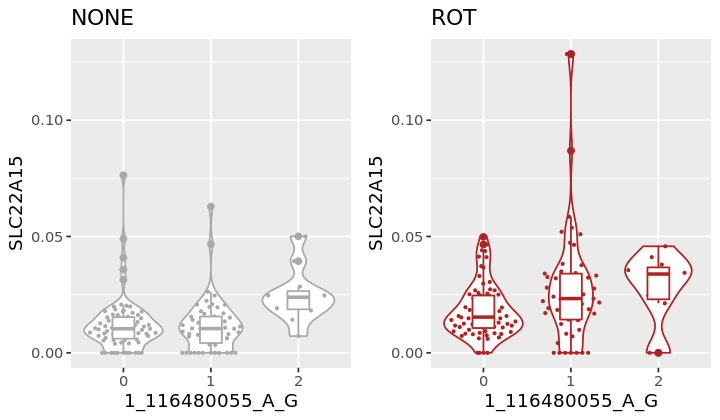

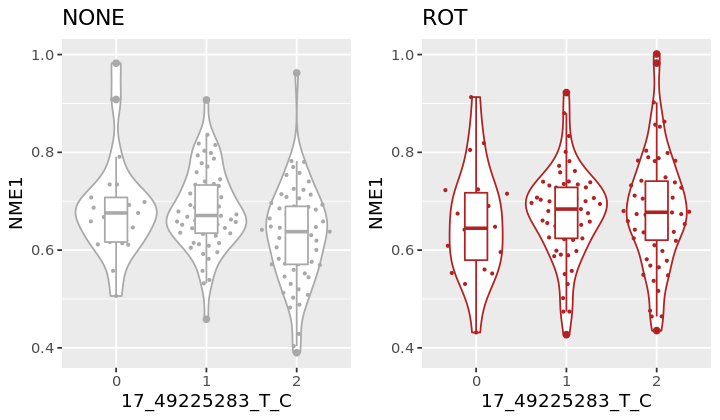

[1] 0.6597507 0.6734153
[1] "SUN1"
[1] 0.2107086 0.2593133
[1] "LEPROT"


Warning message:
“Removed 6 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 6 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 6 rows containing missing values (position_quasirandom).”

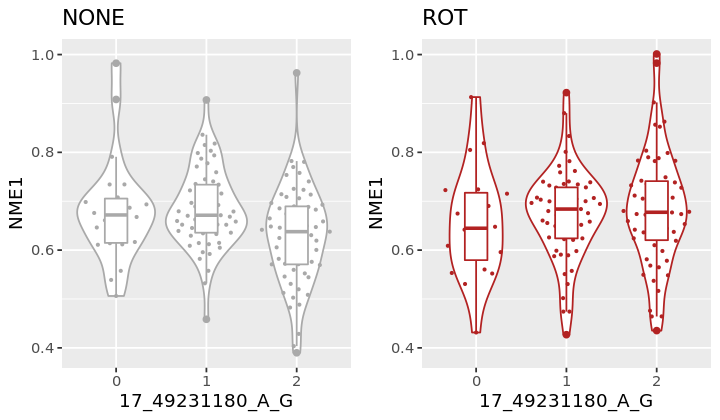

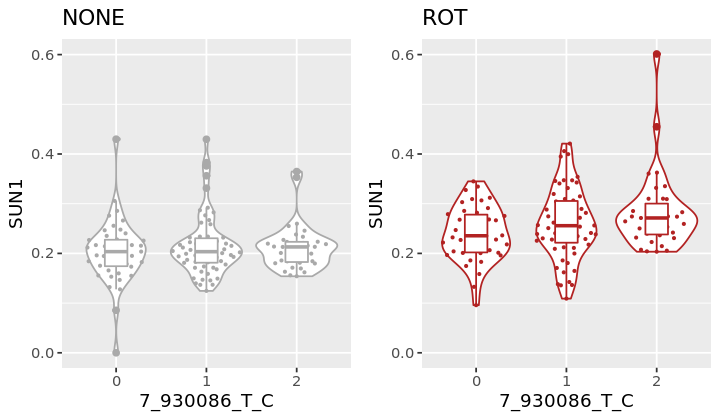

[1] 0.7152772 0.5379324
[1] "DHFR"


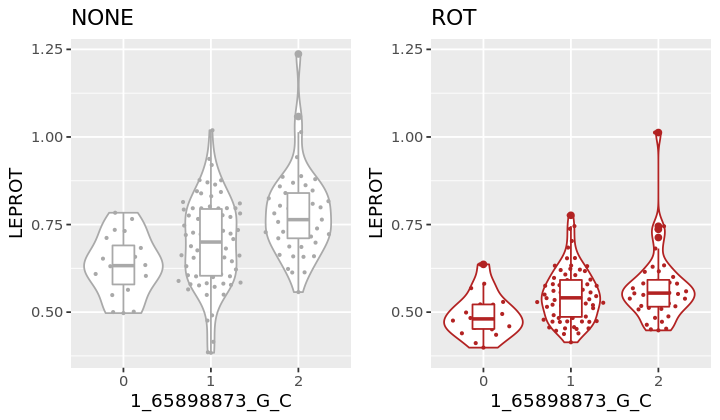

[1] 0.07575584 0.02312845
[1] "C11orf54"


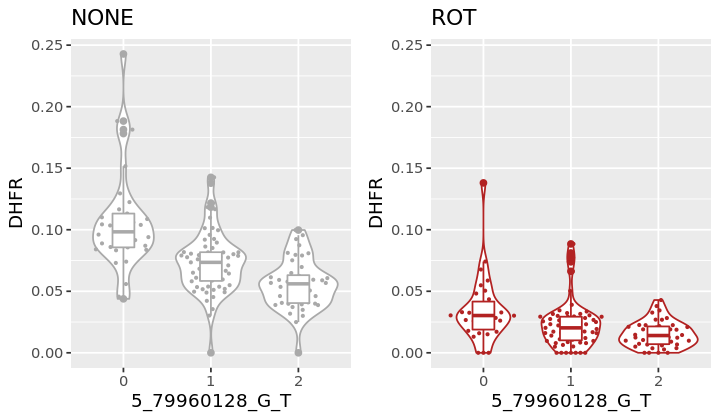

[1] 0.10750404 0.06790319
[1] "REEP3"


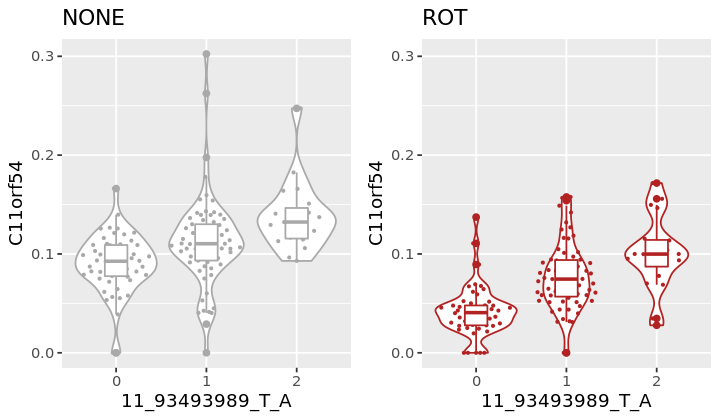

[1] 0.3581995 0.2948326
[1] "CCDC163P"


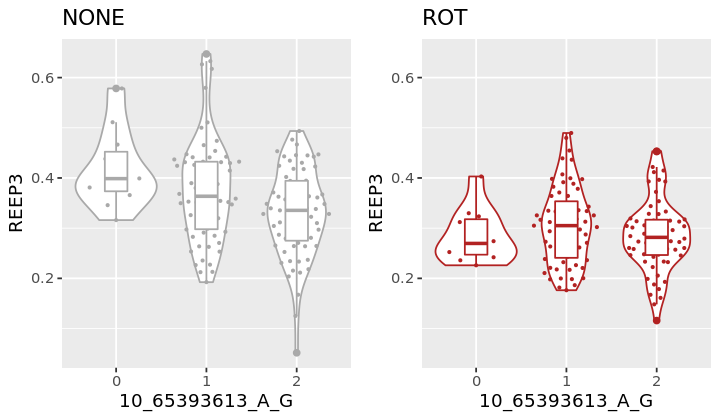

[1] 0.02361113 0.03486300
[1] "CCDC163P"


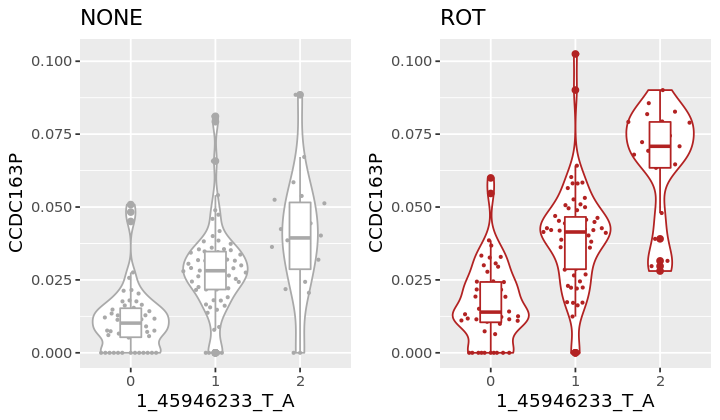

[1] 0.02361113 0.03486300
[1] "CCDC163P"


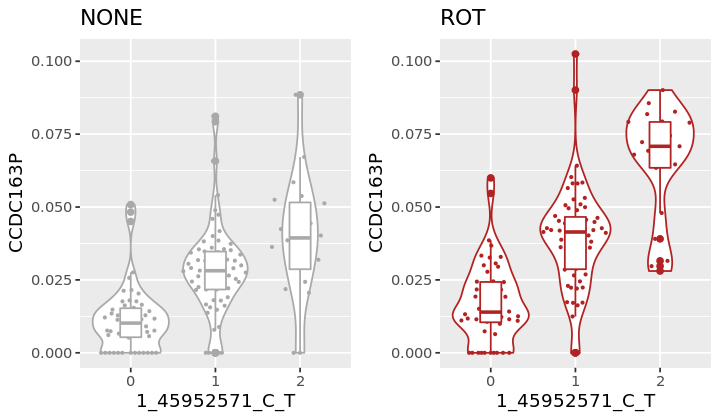

[1] 0.02361113 0.03486300
[1] "CCDC163P"


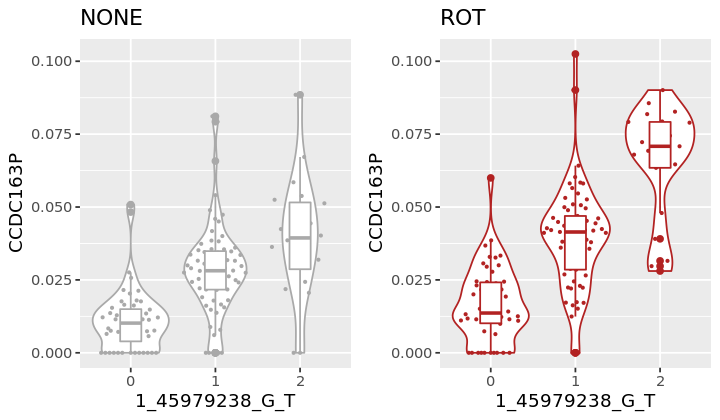

[1] 0.02361113 0.03486300
[1] "SQSTM1"


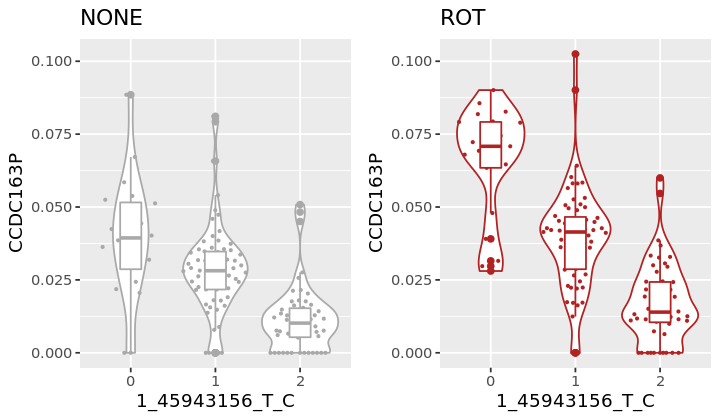

[1] 0.7215254 0.6971222
[1] "VAMP5"


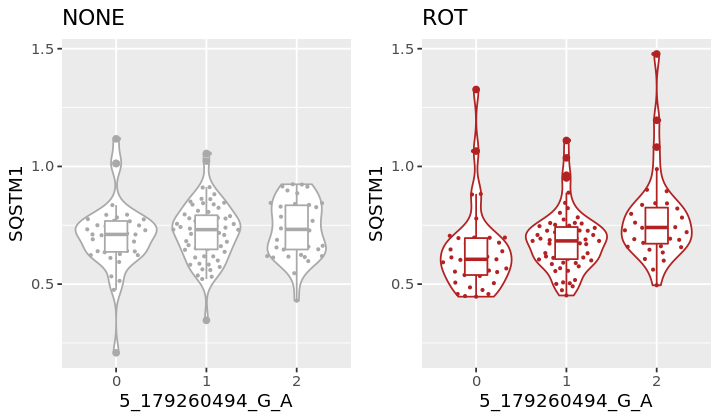

[1] 0.08052811 0.10270492
[1] "CCDC163P"


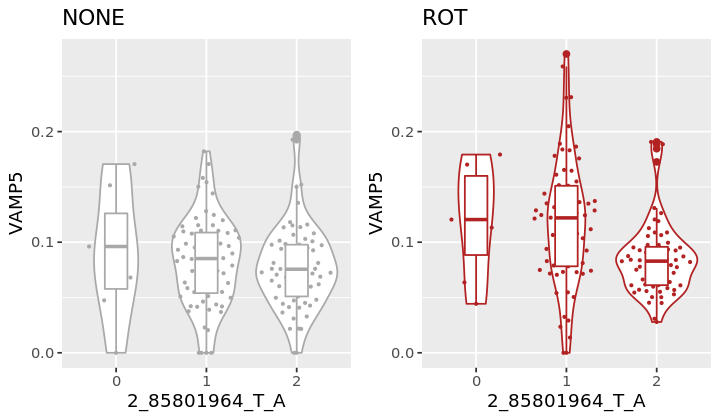

[1] 0.02361113 0.03486300
[1] "SCRN3"
[1] 0.2228124 0.1751323
[1] "ATP5SL"


Warning message:
“Removed 4 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 4 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 4 rows containing missing values (position_quasirandom).”

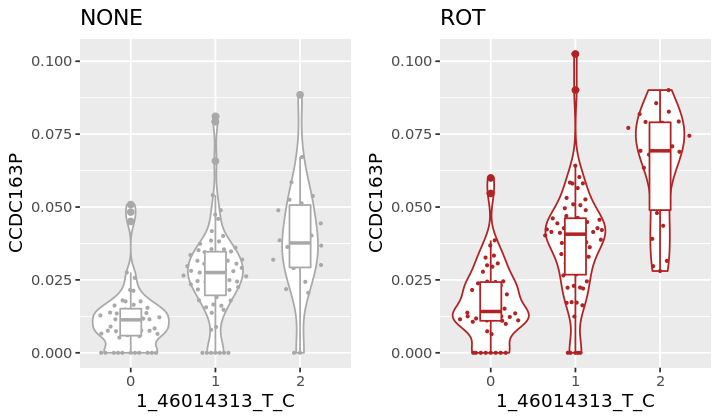

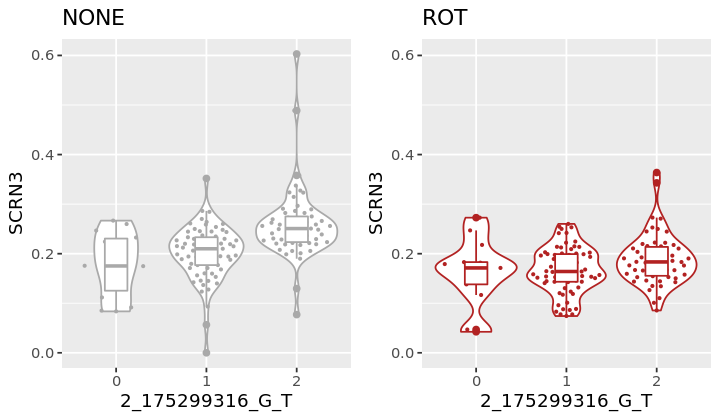

[1] 0.3322041 0.3568863
[1] "POR"


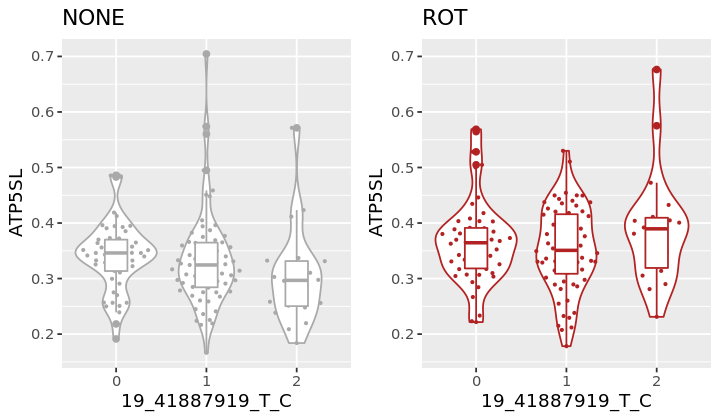

[1] 0.5418337 0.6722126
[1] "SMC2"


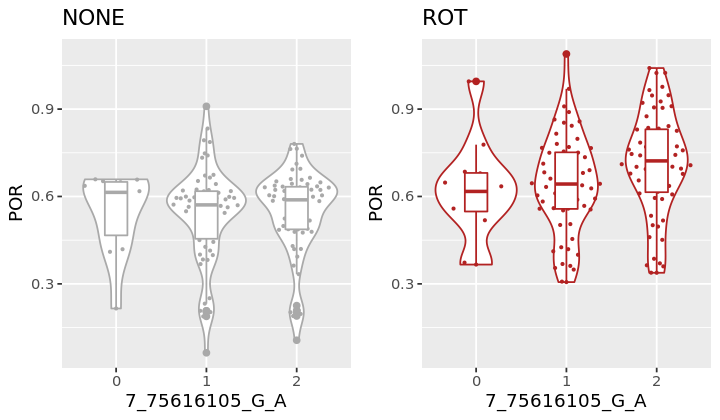

[1] 0.1440887 0.1234225
[1] "SQSTM1"
[1] 0.7215254 0.6971222
[1] "PDCD5"


Warning message:
“Removed 72 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 72 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 72 rows containing missing values (position_quasirandom).”

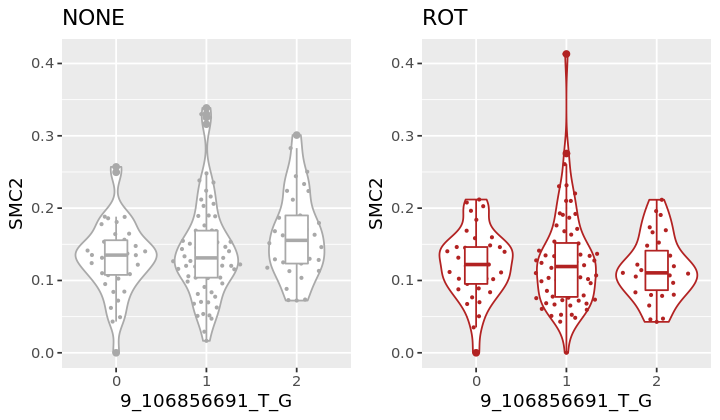

[1] 0.7560725 0.4592406
[1] "PDCD5"


Warning message:
“Removed 72 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 72 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 72 rows containing missing values (position_quasirandom).”

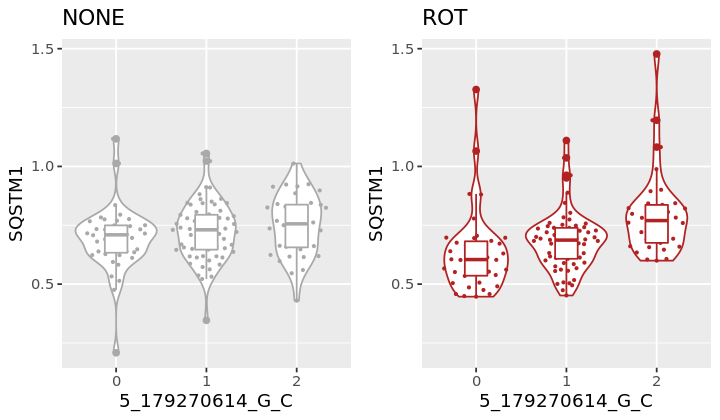

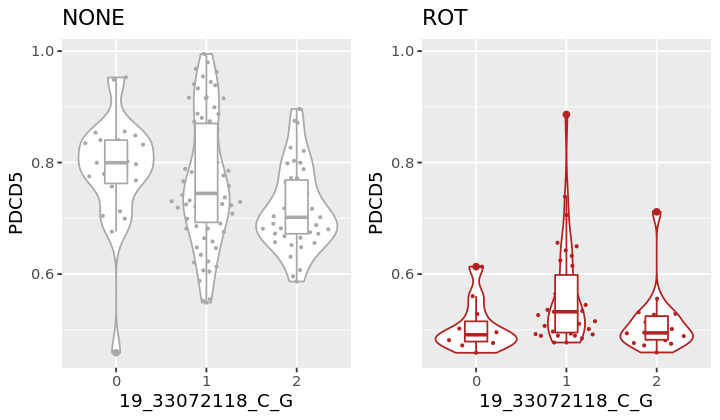

[1] 0.7560725 0.4592406
[1] "TSPAN15"
[1] 0.2475905 0.2023389
[1] "RPA3-AS1"


ERROR: Error in `[.data.frame`(e_noROT, , c("donor_id", gene_name)): undefined columns selected


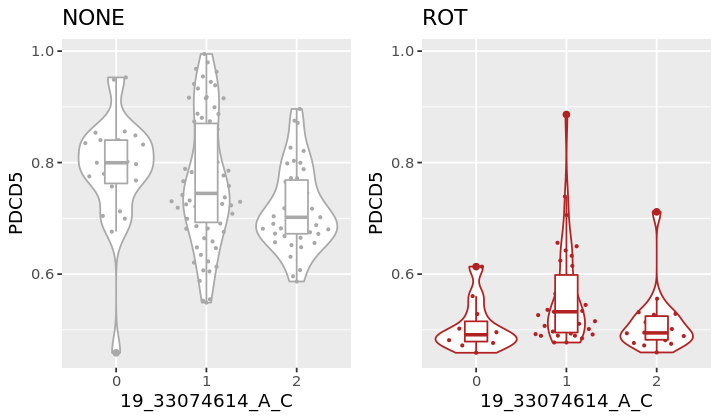

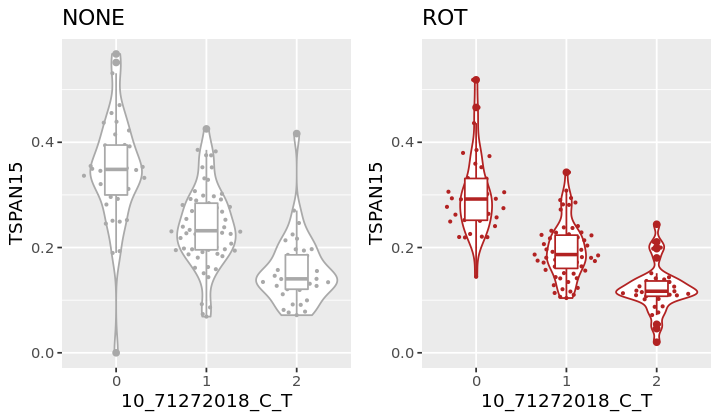

In [12]:
for (i in 1:length(snps)){
#     print(i)
    snp = as.character(snps[i])
#     print(snp)
    gene = as.character(res[res$snp_id == snp,"feature_id"])
#     print(gene)
    gene_name = as.character(annos[annos$feature_id == as.character(gene),"hgnc_symbol"])
    print(gene_name)
    g = data.frame(donor_id = colnames(genos), snp = t(genos[snp,]))
    g$donor_id = as.character(g$donor_id)
    colnames(g)[2] = "dosages"
#     print(head(g,2))
    e1 = e_noROT[,c("donor_id",gene_name)]
    e1$donor_id = as.character(e1$donor_id)
    df1 = inner_join(e1,g,by = "donor_id")
    colnames(df1)[2] = "gene"
    df1$genotypes <- round(df1$dosages)
#     print(head(df1,2))
    e2 = e_ROT[,c("donor_id",gene_name)]
    e2$donor_id = as.character(e2$donor_id)
    df2 = inner_join(e2,g,by = "donor_id")
    colnames(df2)[2] = "gene"
    df2$genotypes <- round(df2$dosages)
#     print(head(df2,2))   
    m = min(min(df1$gene),min(df1$gene))
    M = max(max(df1$gene),max(df2$gene))
    p1 = ggplot(df1, aes(x = as.factor(genotypes), y = gene)) +  geom_violin(col = col_NONE) + 
                xlab(snp) + ylab(gene_name) +  geom_quasirandom(size = 0.5, col = col_NONE) + 
                geom_boxplot(width = 0.25, col = col_NONE) + ylim(c(m,M)) + ggtitle("NONE")
    p2 = ggplot(df2, aes(x = as.factor(genotypes), y = gene))  + geom_violin(col = col_ROT) + 
                xlab(snp) + ylab(gene_name) + geom_quasirandom(size = 0.5, col = col_ROT) + 
                geom_boxplot(width = 0.25, col = col_ROT) + ylim(c(m,M)) +  ggtitle("ROT")
    options(repr.plot.width=6, repr.plot.height=3.5)
    print(cowplot::plot_grid(p1, p2, align = "h", ncol = 2))   
    print(c(mean(df1$gene),mean(df2$gene)))
}

In [ ]:
####### alternative visualisation

In [38]:
e = "/nfs/leia/research/stegle/dseaton/hipsci/singlecell_neuroseq/data/data_processed/pool1_17_D52/qtl_analysis/eqtl_discovery/celltype_Sert/treatment_interaction_test_ncellfilter_top_qtl_results_all/phenotypes.tsv"
cov = "/nfs/leia/research/stegle/dseaton/hipsci/singlecell_neuroseq/data/data_processed/pool1_17_D52/qtl_analysis/eqtl_discovery/celltype_Sert/treatment_interaction_test_ncellfilter_top_qtl_results_all/covariates.tsv"

In [39]:
e = read.csv(e,sep='\t')
cov = read.csv(cov,sep='\t')

In [40]:
head(e,2)
rownames(e) <- e$ensembl_gene_id
e$ensembl_gene_id <- c()
head(e,2)
head(cov,2)

ensembl_gene_id,HPSI0114i.kolf_2_NONE,HPSI0114i.kolf_2_ROT,HPSI0114i.lexy_2_NONE,HPSI0114i.lexy_2_ROT,HPSI0114i.rozh_4_NONE,HPSI0114i.rozh_4_ROT,HPSI0114i.wegi_1_NONE,HPSI0114i.wegi_1_ROT,HPSI0114i.zapk_2_NONE,⋯,HPSI1113i.qolg_1_ROT,HPSI1113i.qorq_1_NONE,HPSI1113i.qorq_1_ROT,HPSI1113i.vuud_2_NONE,HPSI1113i.vuud_2_ROT,HPSI1114i.kuul_1_NONE,HPSI1114i.kuul_1_ROT,HPSI1114i.ualf_6_NONE,HPSI1213i.hehd_1_NONE,HPSI1213i.hehd_1_ROT
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000261657,0.24080430,0.253425717,0.23249476,0.22801267,0.27634394,0.282673955,0.25087345,0.221492663,0.25081968,⋯,0.243570328,0.24587753,0.23427549,0.23678924,0.23490462,0.20764405,0.20412076,0.22446597,0.27917138,0.313499749
ENSG00000227640,0.05560838,0.007755129,0.07386319,0.01284033,0.05317663,0.006427986,0.03599095,0.009516524,0.08494574,⋯,0.004195279,0.09355291,0.01910956,0.07077724,0.01743835,0.03396126,0.00848035,0.03405179,0.05878258,0.005590654


,HPSI0114i.kolf_2_NONE,HPSI0114i.kolf_2_ROT,HPSI0114i.lexy_2_NONE,HPSI0114i.lexy_2_ROT,HPSI0114i.rozh_4_NONE,HPSI0114i.rozh_4_ROT,HPSI0114i.wegi_1_NONE,HPSI0114i.wegi_1_ROT,HPSI0114i.zapk_2_NONE,HPSI0115i.aion_2_NONE,⋯,HPSI1113i.qolg_1_ROT,HPSI1113i.qorq_1_NONE,HPSI1113i.qorq_1_ROT,HPSI1113i.vuud_2_NONE,HPSI1113i.vuud_2_ROT,HPSI1114i.kuul_1_NONE,HPSI1114i.kuul_1_ROT,HPSI1114i.ualf_6_NONE,HPSI1213i.hehd_1_NONE,HPSI1213i.hehd_1_ROT
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000261657,0.24080430,0.253425717,0.23249476,0.22801267,0.27634394,0.282673955,0.25087345,0.221492663,0.25081968,0.34446546,⋯,0.243570328,0.24587753,0.23427549,0.23678924,0.23490462,0.20764405,0.20412076,0.22446597,0.27917138,0.313499749
ENSG00000227640,0.05560838,0.007755129,0.07386319,0.01284033,0.05317663,0.006427986,0.03599095,0.009516524,0.08494574,0.07084543,⋯,0.004195279,0.09355291,0.01910956,0.07077724,0.01743835,0.03396126,0.00848035,0.03405179,0.05878258,0.005590654


index,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,treatment
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
HPSI0114i-kolf_2_NONE,-3.839851,1.746356,-2.180264,-2.781103,1.399476,-0.07246269,0.3135336,-1.713904,-0.8791394,0
HPSI0114i-kolf_2_ROT,-3.057911,1.799321,-1.607426,-2.563553,2.155190,0.54759142,-0.1510388,-2.251553,-0.7089659,1


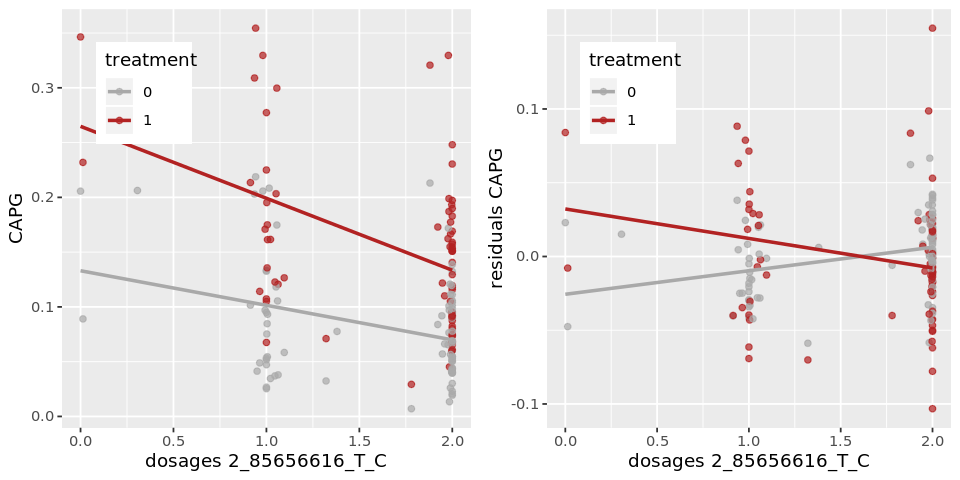

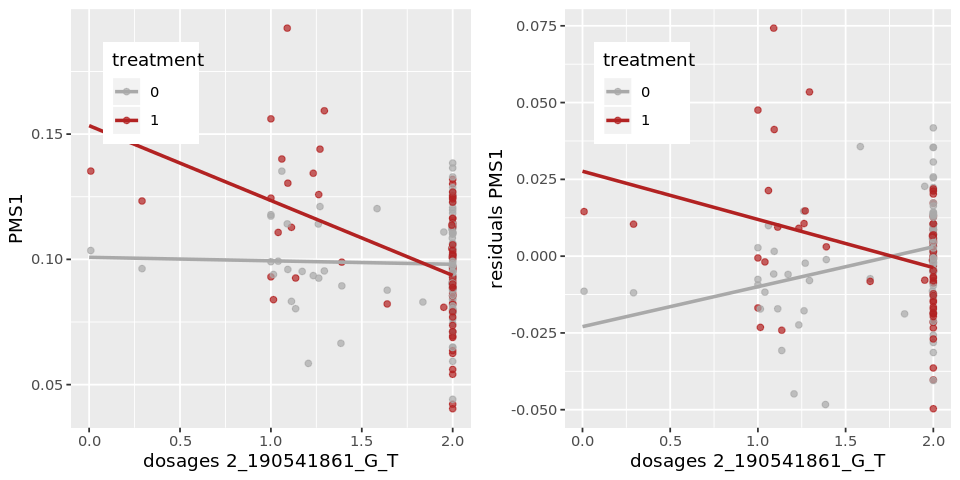

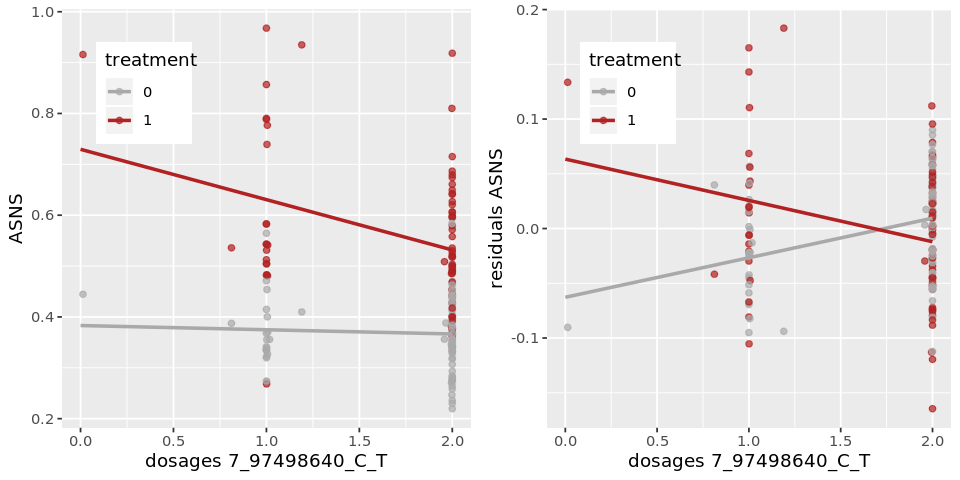

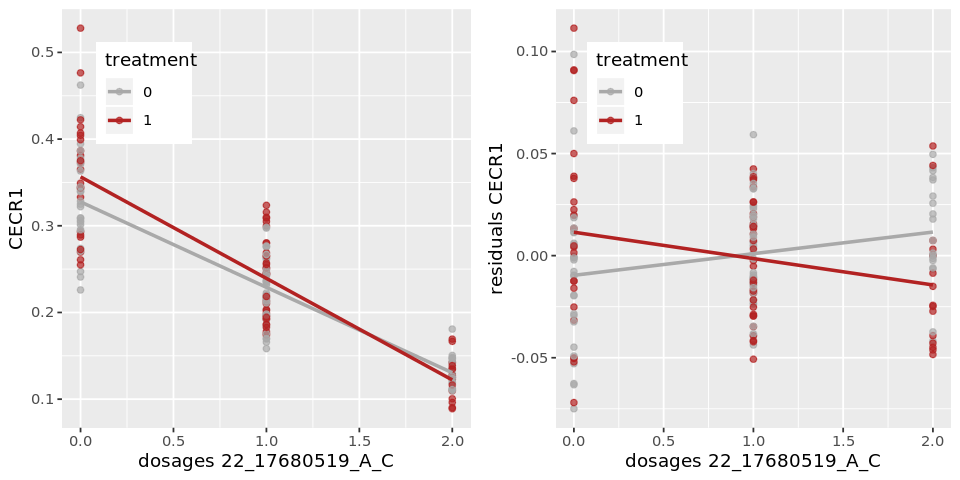

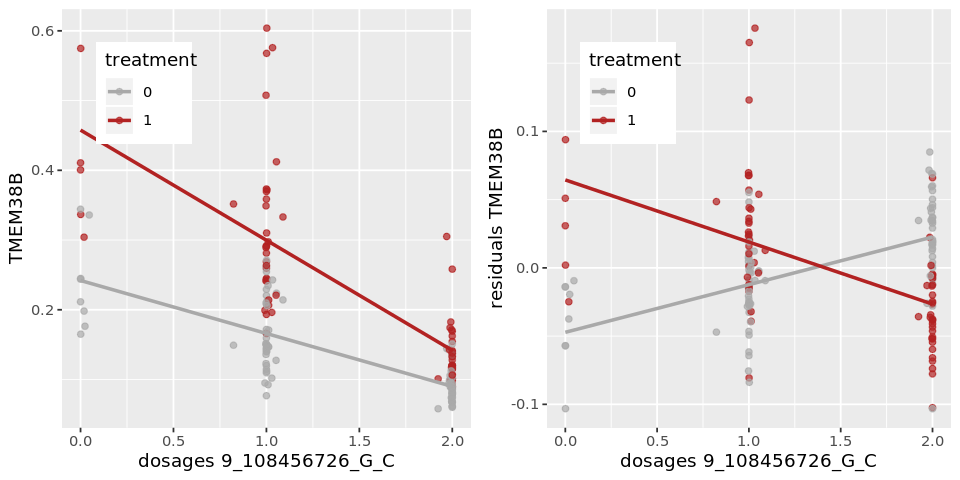

...

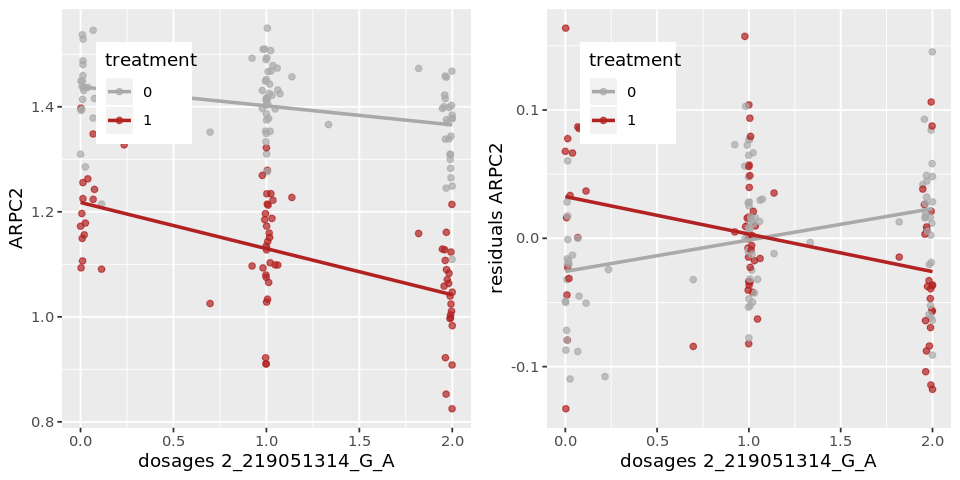

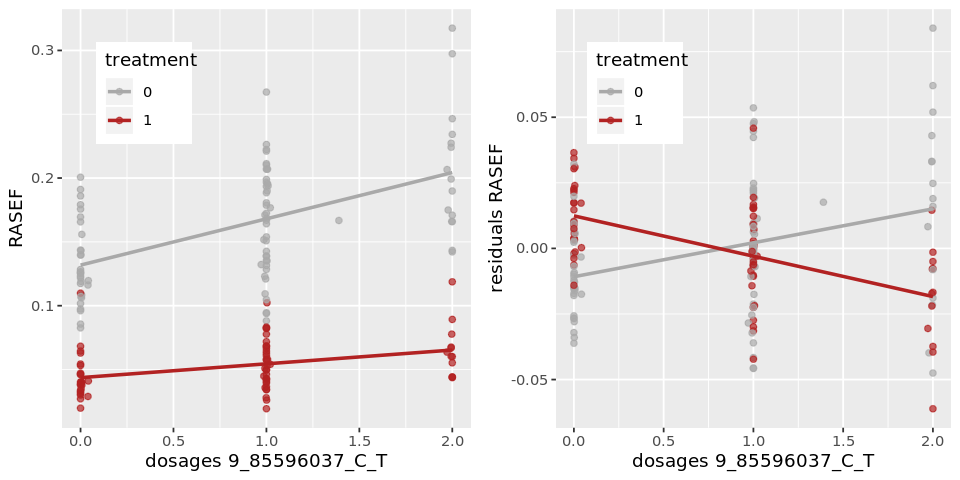

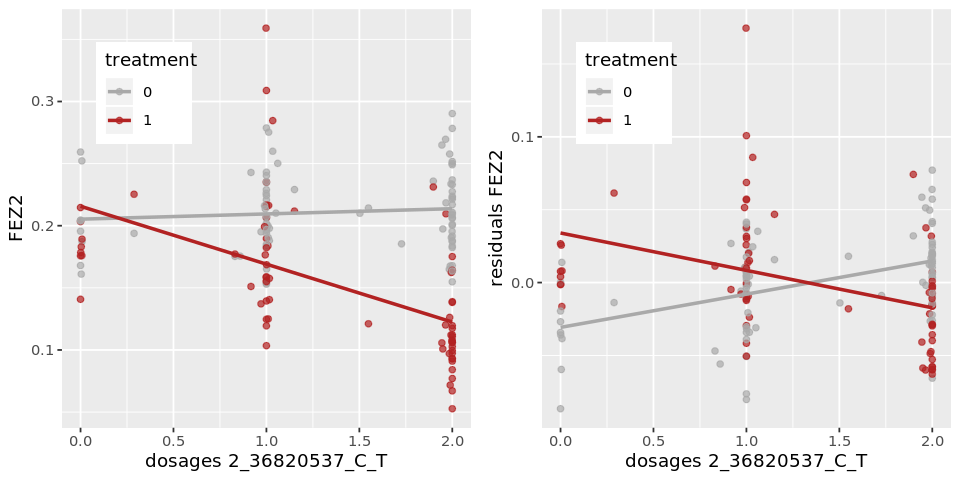

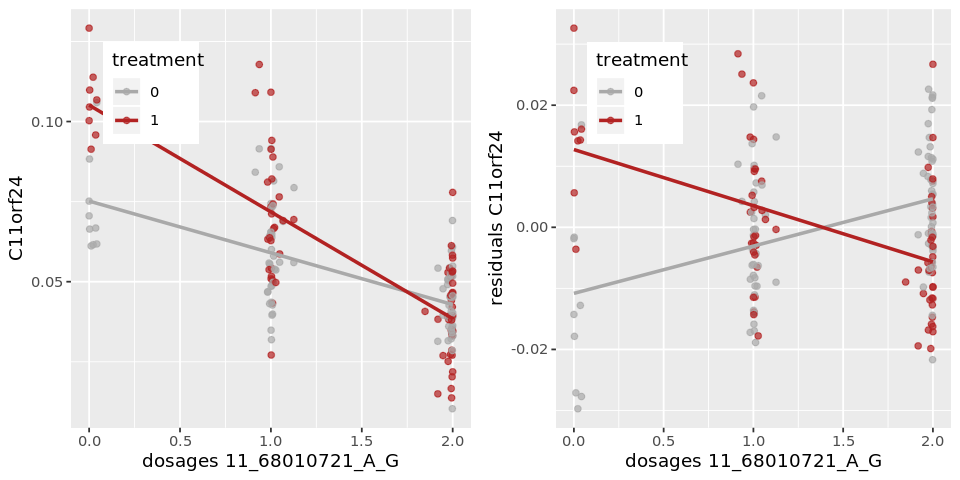

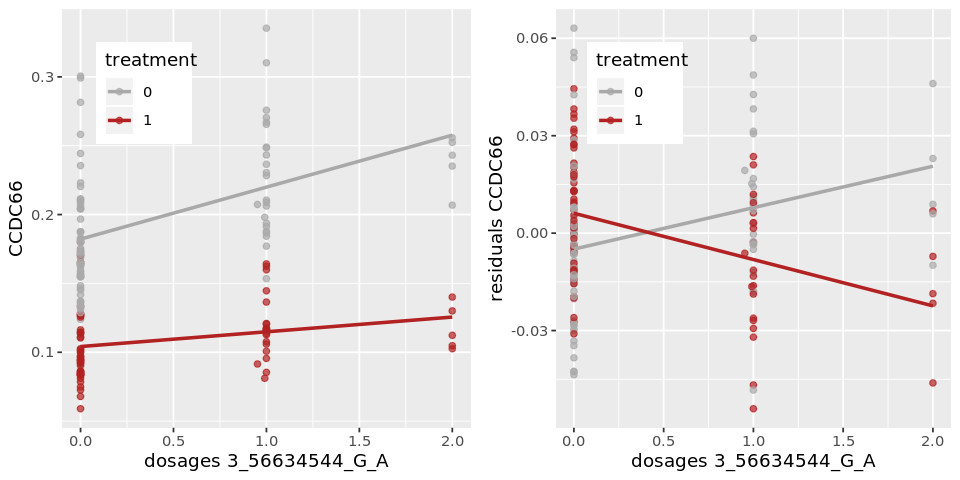

Warning message in `==.default`(annos$feature_id, as.character(gene)):
“longer object length is not a multiple of shorter object length”Warning message in is.na(e1) | is.na(e2):
“longer object length is not a multiple of shorter object length”Warning message in rownames(e) == gene:
“longer object length is not a multiple of shorter object length”

ERROR: `by` can't contain join column `index` which is missing from LHS

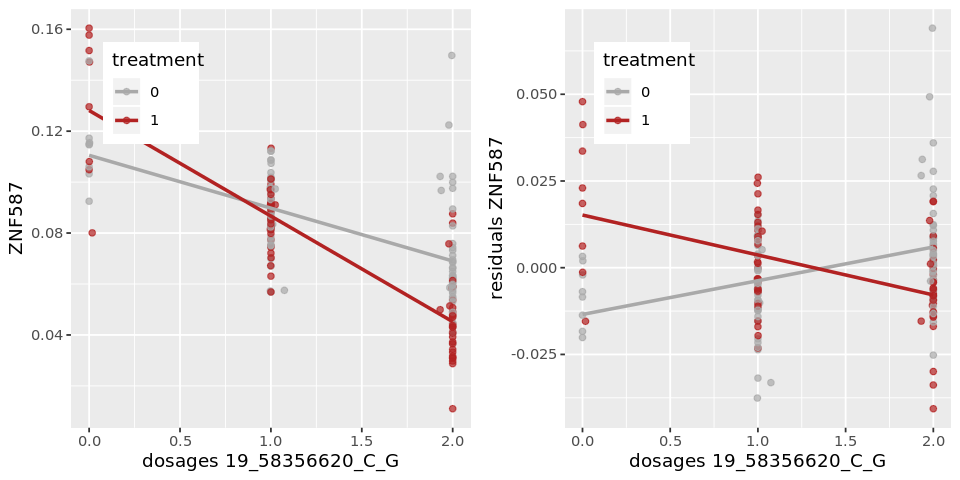

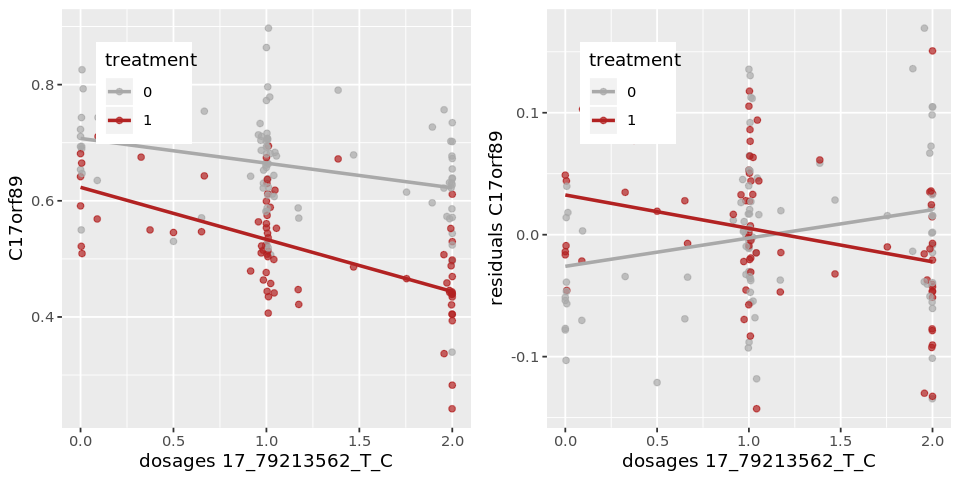

In [45]:
for (i in 1:length(snps_positive)){
#     print(i)
    snp = as.character(snps_positive[i])
#     print(snp)
    gene = as.character(res[res$snp_id == snp,"feature_id"])
    gene_name = as.character(annos[annos$feature_id == as.character(gene),"hgnc_symbol"])
    df_e = data.frame(gene = t(e[rownames(e) == gene,]), index = gsub("\\.","-",colnames(e)))
    colnames(df_e)[1] = "gene"
#     head(df_e)
    df_e2 = inner_join(df_e,as.data.frame(cov),by = "index")
#     head(df_e2,2)
    #### get residuals (more accurately what we test)
#     mylm = lm(formula = gene ~ PC2+PC3+PC4+PC5+PC6+PC7+PC8+PC9+PC10+treatment, data = df_e2)
#     df_e2$res = mylm$residuals
    df_e2$donor_id = gsub("_NONE","",df_e2$index)
    df_e2$donor_id = gsub("_ROT","",df_e2$donor_id)
#     head(df_e2,2)
#     print(gene)

    g = data.frame(donor_id = colnames(genos), snp = t(genos[snp,]))
    g$donor_id = as.character(g$donor_id)
    colnames(g)[2] = "dosages"
#     print(head(g,2))
    df0 = inner_join(df_e2,g,by = "donor_id") 
    df0$genotypes <- round(df0$dosages)
    df0$treatment = as.factor(df0$treatment)
    mylm = lm(formula = gene ~ genotypes+PC2+PC3+PC4+PC5+PC6+PC7+PC8+PC9+PC10+treatment, data = df0)
    df0$res = mylm$residuals
    p1 = ggplot(df0, aes(x = dosages, y = gene, col = treatment)) +  geom_point(alpha = 0.7) + 
        xlab(paste0("dosages ",snp)) + ylab(gene_name) + scale_color_manual(values=c(col_NONE, col_ROT)) +
        geom_smooth(method = lm,  se = FALSE, fullrange = TRUE) + theme(legend.position = c(0.2, 0.8)) + xlim(c(0,2))
    p2 = ggplot(df0, aes(x = dosages, y = res, col = treatment)) +  geom_point(alpha = 0.7) + xlim(c(0,2)) +
        xlab(paste0("dosages ",snp)) + ylab(paste0("residuals ",gene_name)) + scale_color_manual(values=c(col_NONE, col_ROT)) +
        geom_smooth(method = lm,  se = FALSE, fullrange = TRUE) + theme(legend.position = c(0.2, 0.8))
    
    options(repr.plot.width=8, repr.plot.height=4)
    print(cowplot::plot_grid(p1, p2, align = "h", ncol = 2))   
}

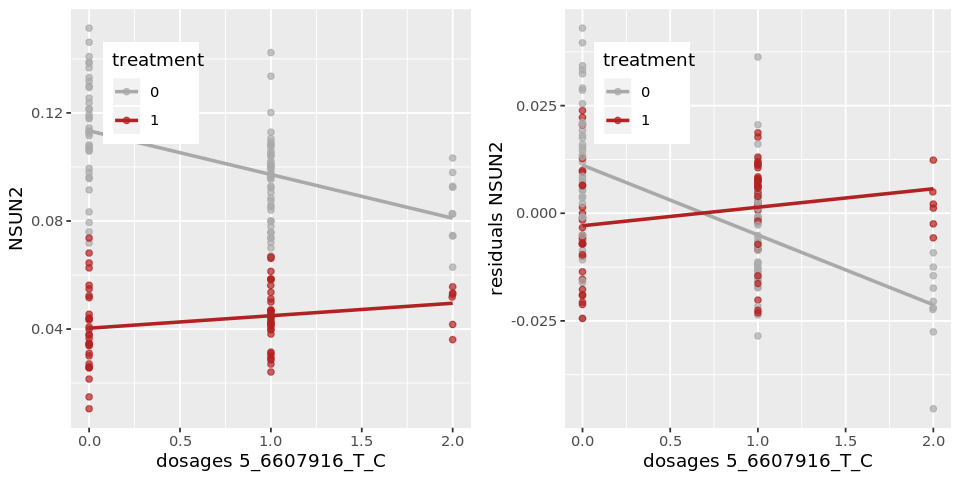

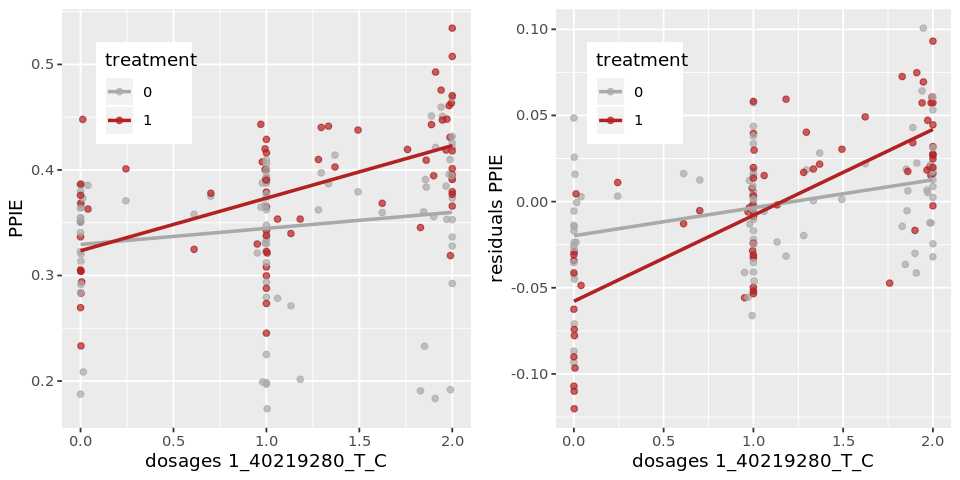

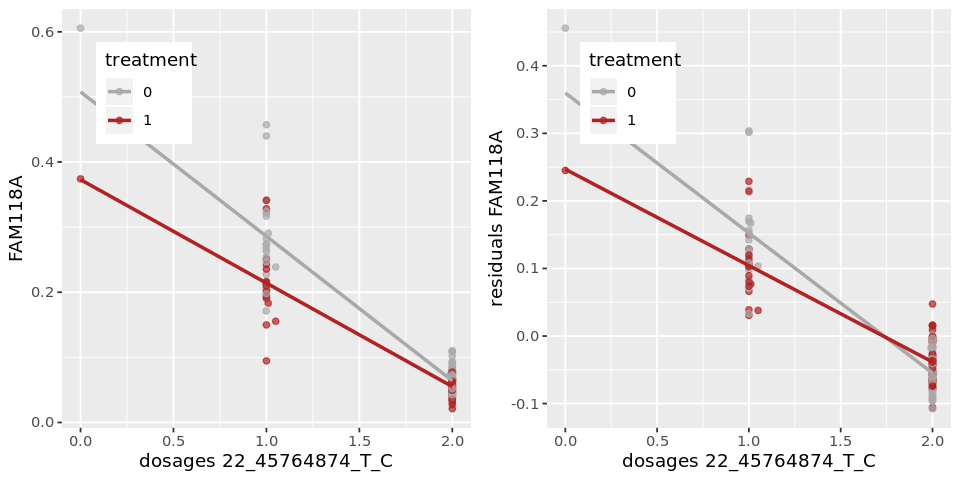

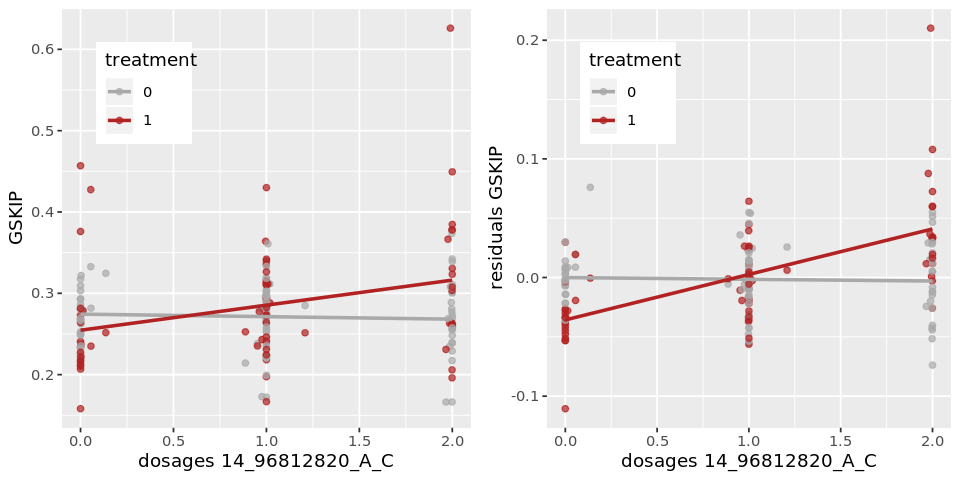

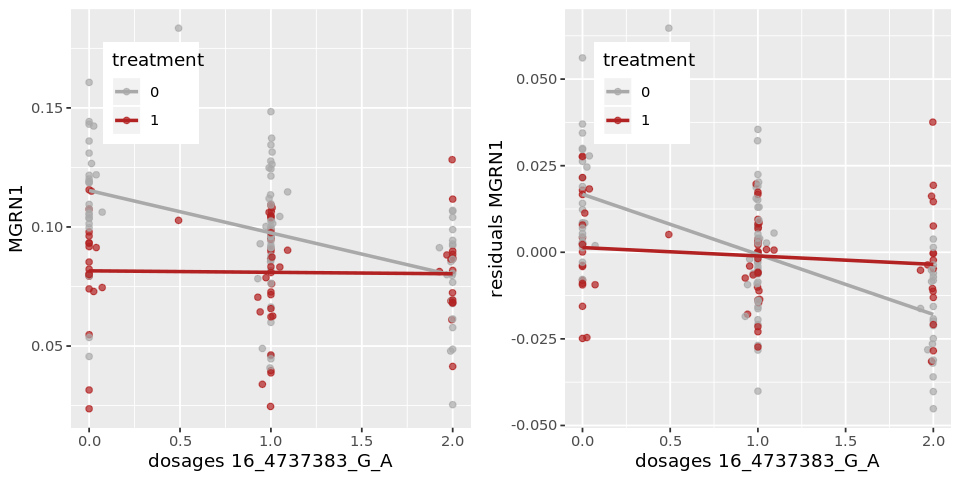

...

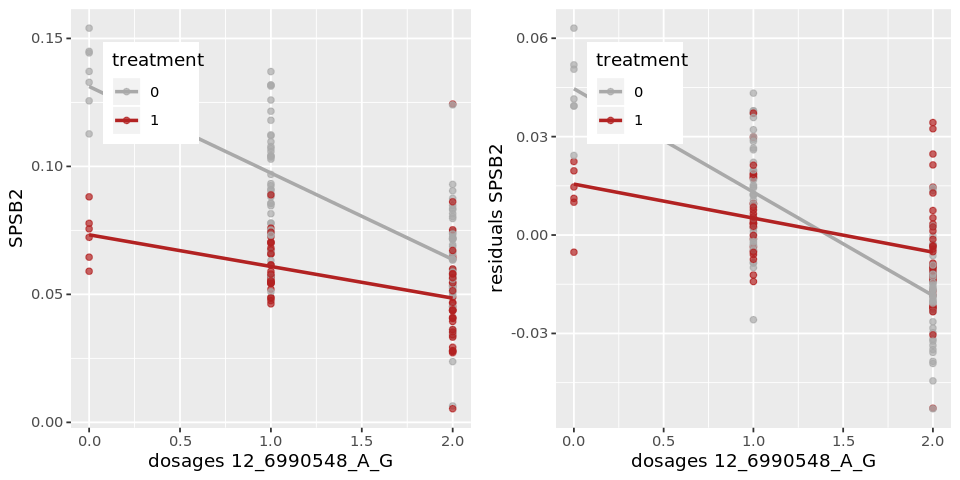

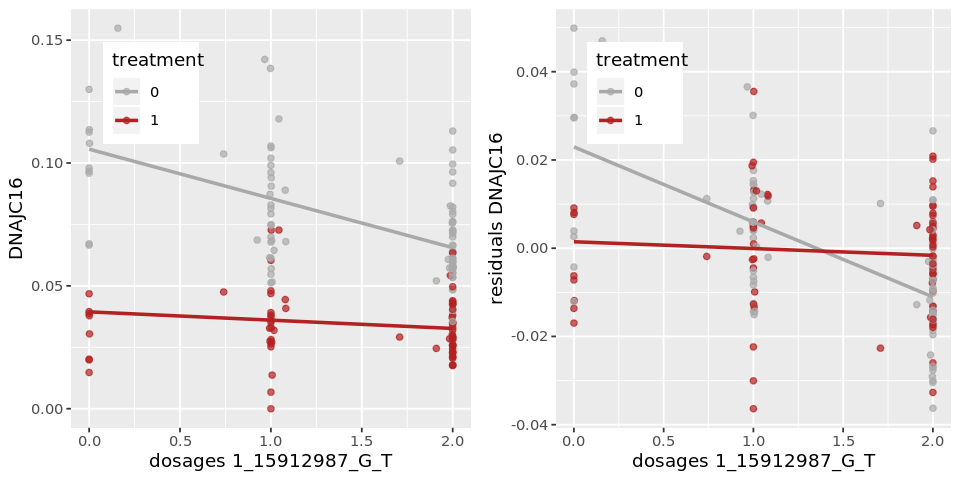

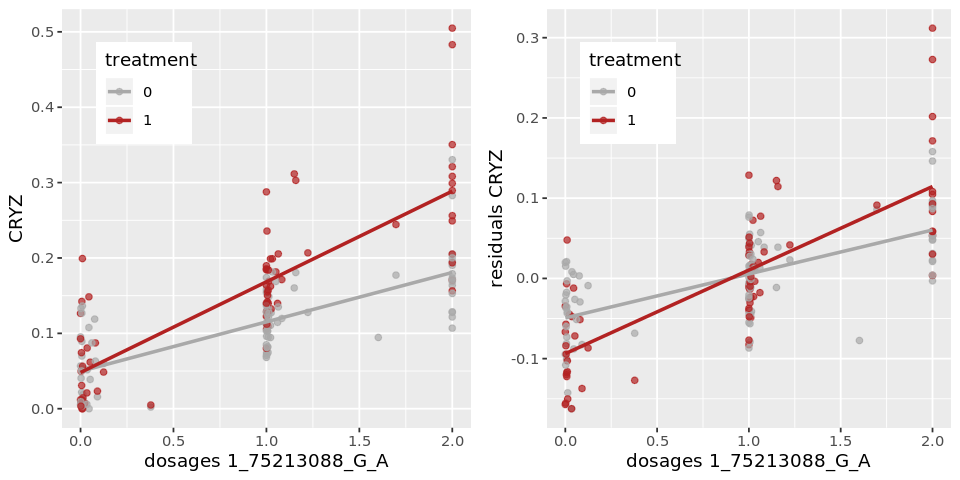

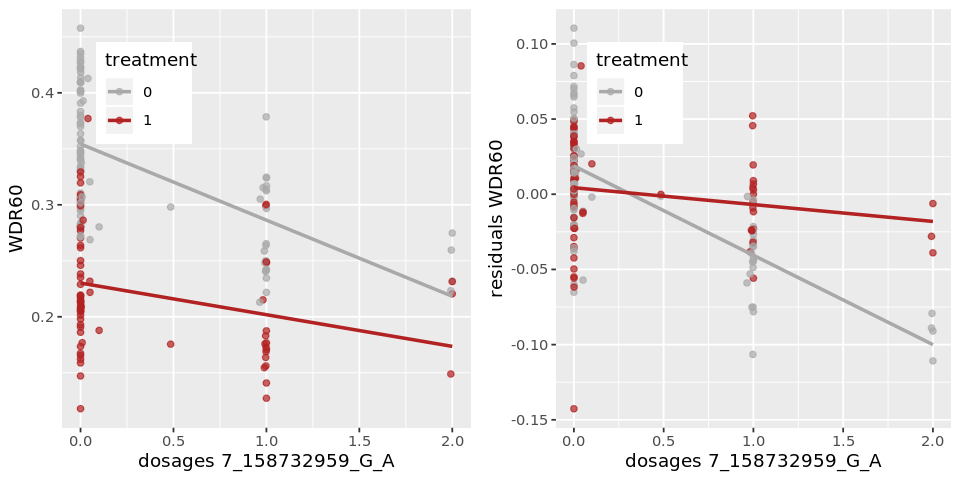

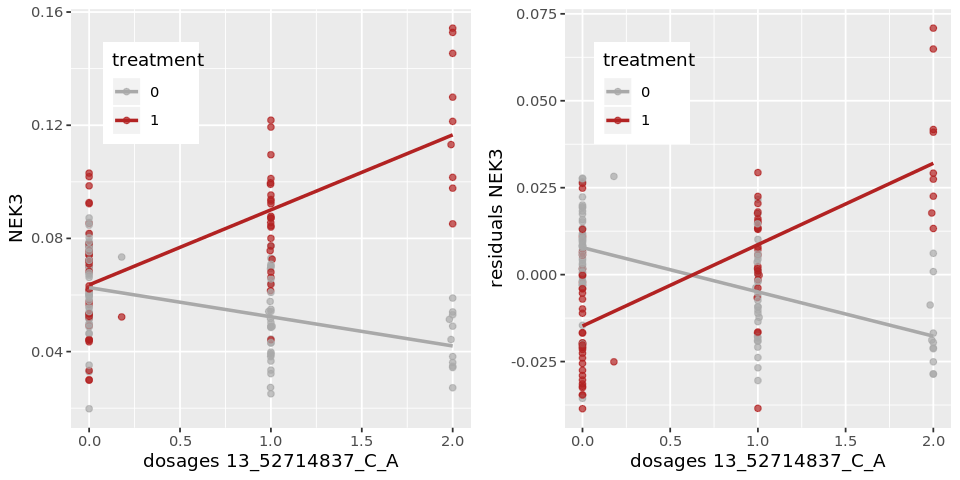

Warning message in `==.default`(annos$feature_id, as.character(gene)):
“longer object length is not a multiple of shorter object length”Warning message in is.na(e1) | is.na(e2):
“longer object length is not a multiple of shorter object length”Warning message in rownames(e) == gene:
“longer object length is not a multiple of shorter object length”

ERROR: `by` can't contain join column `index` which is missing from LHS

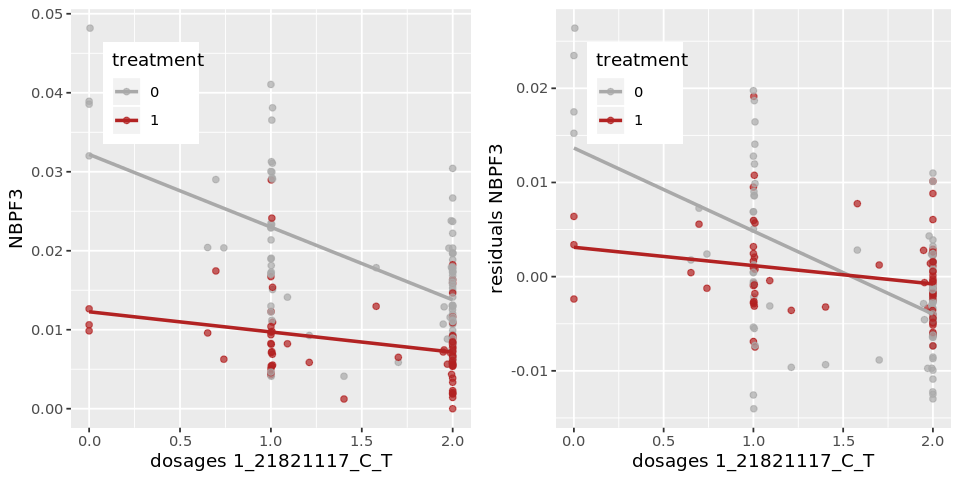

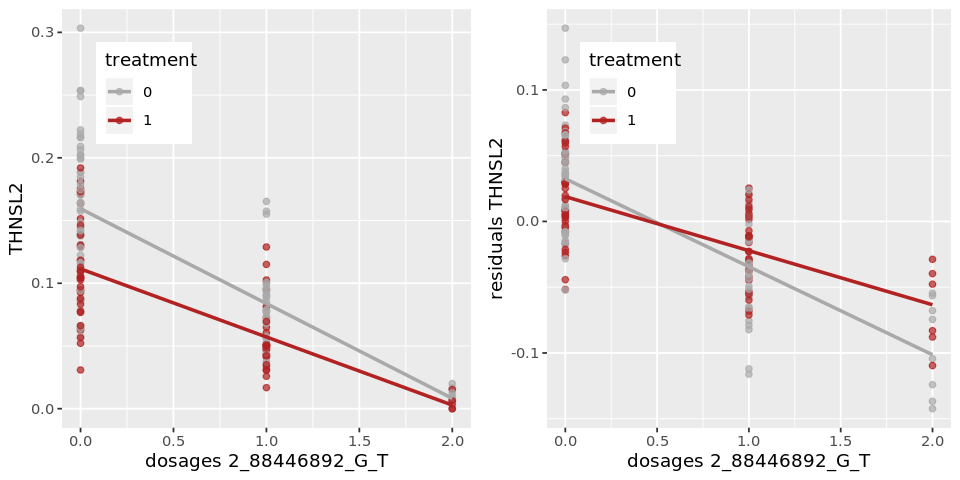

In [42]:
for (i in 1:length(snps_negative)){
#     print(i)
    snp = as.character(snps_negative[i])
#     print(snp)
    gene = as.character(res[res$snp_id == snp,"feature_id"])
    gene_name = as.character(annos[annos$feature_id == as.character(gene),"hgnc_symbol"])
    df_e = data.frame(gene = t(e[rownames(e) == gene,]), index = gsub("\\.","-",colnames(e)))
    colnames(df_e)[1] = "gene"
#     head(df_e)
    df_e2 = inner_join(df_e,as.data.frame(cov),by = "index")
#     head(df_e2,2)
    #### get residuals (more accurately what we test)
    mylm = lm(formula = gene ~ PC2+PC3+PC4+PC5+PC6+PC7+PC8+PC9+PC10+treatment, data = df_e2)
    df_e2$res = mylm$residuals
    df_e2$donor_id = gsub("_NONE","",df_e2$index)
    df_e2$donor_id = gsub("_ROT","",df_e2$donor_id)
#     head(df_e2,2)
#     print(gene)

    g = data.frame(donor_id = colnames(genos), snp = t(genos[snp,]))
    g$donor_id = as.character(g$donor_id)
    colnames(g)[2] = "dosages"
#     print(head(g,2))
    df0 = inner_join(df_e2,g,by = "donor_id") 
    df0$genotypes <- round(df0$dosages)
    df0$treatment = as.factor(df0$treatment)
    p1 = ggplot(df0, aes(x = dosages, y = gene, col = treatment)) +  geom_point(alpha = 0.7) + 
        xlab(paste0("dosages ",snp)) + ylab(gene_name) + scale_color_manual(values=c(col_NONE, col_ROT)) +
        geom_smooth(method = lm,  se = FALSE, fullrange = TRUE) + theme(legend.position = c(0.2, 0.8)) + xlim(c(0,2))
    p2 = ggplot(df0, aes(x = dosages, y = res, col = treatment)) +  geom_point(alpha = 0.7) + xlim(c(0,2)) +
        xlab(paste0("dosages ",snp)) + ylab(paste0("residuals ",gene_name)) + scale_color_manual(values=c(col_NONE, col_ROT)) +
        geom_smooth(method = lm,  se = FALSE, fullrange = TRUE) + theme(legend.position = c(0.2, 0.8))
    
    options(repr.plot.width=8, repr.plot.height=4)
    print(cowplot::plot_grid(p1, p2, align = "h", ncol = 2))   
}